# Japanese Yen Exchange Rate Forecast
## 1.Data set definition

This project uses a dataset containing data on the exchange rate of the Japanese yen against the U.S. dollar, with the file name “JPY_Japanese-Yen.csv”. This dataset records daily exchange rate changes from the beginning of 1996 to May 2024, including information on opening price, high price, low price, closing price, and volume. The data span a wide range of time frames and can be used to analyze trends and patterns over time.
https://www.kaggle.com/datasets/usamabuttar/global-currency-historical-prices-updated-daily

## 2.Project objectives.

- Explore the yen-dollar exchange rate data and examine trends, seasonality and anomalies in it.
- Evaluate the smoothness of the data and perform appropriate transformations to meet modeling assumptions where necessary.
- Use different time series forecasting models (e.g., ARIMA, SARIMA) to forecast future exchange rate changes.
- Compare the forecasting performance of different models, select the best model and explain its advantages.
- Based on the model, forecast the exchange rate movement in the future period. 3.

## 3.Research questions.

- Is there a significant upward or downward trend in the exchange rate data of the yen against the U.S. dollar?
- Is there a significant cyclical or seasonal pattern in the exchange rate data?
- What specific events or periods have had a significant impact on the exchange rate?
- Which time-series model can be used to most accurately characterize and forecast the exchange rate data?
- How will the exchange rate change over time based on the forecasting model?

## 4.Preliminary data analysis.

Before starting the modeling, a thorough exploratory analysis of the data was first conducted, including.

- Checking the size, column names and data types of the dataset.
- Reviewing the first few rows of the data set to understand its structure and content.
- Calculating descriptive statistics such as mean, median and standard deviation.
- Identify and deal with missing values and interpolate missing values using linear interpolation.
- Plot time series graphs to visualize exchange rate trends.
- Calculate rolling averages and expanded averages to smooth data and better visualize trends.
- Use heat maps to visualize monthly and yearly exchange rate patterns.
- Plot scatter plots to see the relationship between opening and closing prices.
- Calculate correlation coefficients to analyze the correlation between variables.
- Plotting the autocorrelation function (ACF) and partial autocorrelation function (PACF) to investigate the time dependence of the data.

These preliminary analyses provide us with knowledge about the structure, distribution and pattern of the data, and lay the foundation for subsequent modeling work. Some important events are also labeled to better explain exchange rate fluctuations.

Next, several simple baseline forecasting methods, such as the mean, plain and drift methods, were explored and their evaluation metrics were calculated for comparison with more sophisticated models.

Then, more advanced time series modeling techniques, including methods such as ARIMA and SARIMA, were attempted. These models are capable of capturing autoregressive, moving average and seasonal patterns in the data, thereby improving forecasting accuracy. The performance of the different models was evaluated and the best model was selected.

Using the SARIMA model, we have forecasted the exchange rate changes in the coming month and compared and visualized the forecast results with the historical data.

Finally, use LSTM, CNN, MLP to forecasted the exchange rate, and also import two new dataset,US Bond Yield and Japan Bond Yield.

Calculate Interest Rate Differential:

For each date, compute the differential between the U.S. Bond Yield and the Japan Bond Yield:

Bond_Yield_Diff = US_Bond_Yield - Japan_Bond_Yield.

Use Interest Rate Differential in Predictions:

Incorporate the calculated interest rate differential as an input feature, combined with JPY/USD exchange rate data, into the model to perform multi-step predictions of the exchange rate.

Overall, the aim of this project is to gain a deeper understanding of the yen-dollar exchange rate data, identify patterns and influencing factors, and provide reliable forecasts of future exchange rate changes through exploratory analysis and time series modeling methods.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pmdarima


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.1 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from ipywidgets import interact, widgets
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")

# Data Reading and Preprocessing
In this step, perform the following data preprocessing operations.
Generate statistical summaries of numeric columns, including counts, means, standard deviations, etc.
Checks for and handles missing values, filling them in using linear interpolation.


In [ ]:
# Define the file path
file_path = '/content/drive/My Drive/JPY_Japanese-Yen.csv'

# Load the CSV file into a DataFrame and parse the 'Date' column as datetime
df = pd.read_csv(file_path, parse_dates=['Date'])

# Display the first few rows of the DataFrame
print(df.head())

# Print the number of rows in the original DataFrame
print(f'The number of rows in the original DataFrame is: {len(df)}')

        Date        Open        High         Low       Close  Volume
0 1996-10-30  114.370003  114.480003  113.610001  114.180000       0
1 1996-11-01  113.500000  113.500000  113.500000  113.500000       0
2 1996-11-04  113.279999  113.980003  112.949997  113.879997       0
3 1996-11-05  113.709999  114.330002  113.449997  114.250000       0
4 1996-11-06  114.230003  114.680000  113.650002  113.949997       0
The number of rows in the original DataFrame is: 7142


In [ ]:
df

,Date,Open,High,Low,Close,Volume
0,1996-10-30,114.370003,114.480003,113.610001,114.180000,0
1,1996-11-01,113.500000,113.500000,113.500000,113.500000,0
2,1996-11-04,113.279999,113.980003,112.949997,113.879997,0
3,1996-11-05,113.709999,114.330002,113.449997,114.250000,0
4,1996-11-06,114.230003,114.680000,113.650002,113.949997,0
...,...,...,...,...,...,...
7137,2024-05-08,154.748001,155.649994,154.694000,154.748001,0
7138,2024-05-09,155.419006,155.947006,155.225998,155.419006,0
7139,2024-05-10,155.389008,155.886002,155.380997,155.389008,0
7140,2024-05-13,155.817993,156.210007,155.595993,155.817993,0


In [ ]:
df = df.drop(columns=['Volume'])
print(df)

           Date        Open        High         Low       Close
0    1996-10-30  114.370003  114.480003  113.610001  114.180000
1    1996-11-01  113.500000  113.500000  113.500000  113.500000
2    1996-11-04  113.279999  113.980003  112.949997  113.879997
3    1996-11-05  113.709999  114.330002  113.449997  114.250000
4    1996-11-06  114.230003  114.680000  113.650002  113.949997
...         ...         ...         ...         ...         ...
7137 2024-05-08  154.748001  155.649994  154.694000  154.748001
7138 2024-05-09  155.419006  155.947006  155.225998  155.419006
7139 2024-05-10  155.389008  155.886002  155.380997  155.389008
7140 2024-05-13  155.817993  156.210007  155.595993  155.817993
7141 2024-05-14  156.203003  156.542999  156.164993  156.406998

[7142 rows x 5 columns]


### Data Inspection

In [ ]:
# Display concise summary information about the DataFrame.
# This includes the index dtype and column dtypes, non-null values, and memory usage.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7142 entries, 0 to 7141
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    7142 non-null   datetime64[ns]
 1   Open    7142 non-null   float64       
 2   High    7142 non-null   float64       
 3   Low     7142 non-null   float64       
 4   Close   7142 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 279.1 KB


In [ ]:
# Generate a statistical summary of the numerical columns in the DataFrame

# Set the 'Date' column as the index of the DataFrame
df.set_index('Date', inplace=True)

# Generate a statistical summary of the numerical columns
summary = df.describe()

# Display the statistical summary
print(summary)

              Open         High          Low        Close
count  7142.000000  7142.000000  7142.000000  7142.000000
mean    111.136284   111.591198   110.640232   111.131425
std      15.485154    15.568369    15.403838    15.484989
min      75.750000    75.973999    75.570000    75.739998
25%     104.250252   104.739998   103.812498   104.232002
50%     110.877998   111.274498   110.459999   110.870502
75%     119.640749   120.120752   119.019997   119.627253
max     158.223999   159.960998   157.421005   158.223999


### Data Interpolation and Cleaning

In [ ]:
# Filter rows containing all NaN (missing) values
all_nan_rows = df[df.isna().all(axis=1)]
print("Number of rows where all columns are NaN:", len(all_nan_rows))
print(all_nan_rows)

# Interpolate missing values using linear interpolation and modify DataFrame in place
df.interpolate(method='linear', inplace=True)

# Retrieve the dimensions of the DataFrame (number of rows, number of columns)
print(df.shape)

Number of rows where all columns are NaN: 0
Empty DataFrame
Columns: [Open, High, Low, Close]
Index: []
(7142, 4)


In [ ]:
# Count the number of missing values in each column of the DataFrame
df.isnull().sum()

Open     0
High     0
Low      0
Close    0
dtype: int64

In [ ]:
df

,Open,High,Low,Close
Date,,,,
1996-10-30,114.370003,114.480003,113.610001,114.180000
1996-11-01,113.500000,113.500000,113.500000,113.500000
1996-11-04,113.279999,113.980003,112.949997,113.879997
1996-11-05,113.709999,114.330002,113.449997,114.250000
1996-11-06,114.230003,114.680000,113.650002,113.949997
...,...,...,...,...
2024-05-08,154.748001,155.649994,154.694000,154.748001
2024-05-09,155.419006,155.947006,155.225998,155.419006
2024-05-10,155.389008,155.886002,155.380997,155.389008


# Exploratory data analysis

In this section, performed extensive exploratory analysis of the data, including.

Finding the index of the minimum and maximum values of each column.
Plotting closing price charts for the entire time series and for the most recent period.
Calculating and plotting 5-year moving averages and expanded averages to smooth the data and better visualize trends.
Visualize monthly and yearly average closing price patterns using heatmaps.
Plot a scatter plot of opening and closing prices to analyze the relationship between them.
Calculate and visualize the correlation coefficient matrix to study the correlation between variables.


 ### Indices of Minimum and Maximum Values

In [ ]:
# Return the date of the minimum value for each column
min_dates = df.idxmin()

# Display the dates of the minimum values for each column
print(min_dates)

Open    2011-10-31
High    2011-10-28
Low     2011-10-31
Close   2011-10-31
dtype: datetime64[ns]


In [ ]:
# Return the index label of the maximum value for each column in the DataFrame
df.idxmax()

Open    2024-04-29
High    2024-04-29
Low     2024-05-01
Close   2024-04-29
dtype: datetime64[ns]

### Time Series Plotting

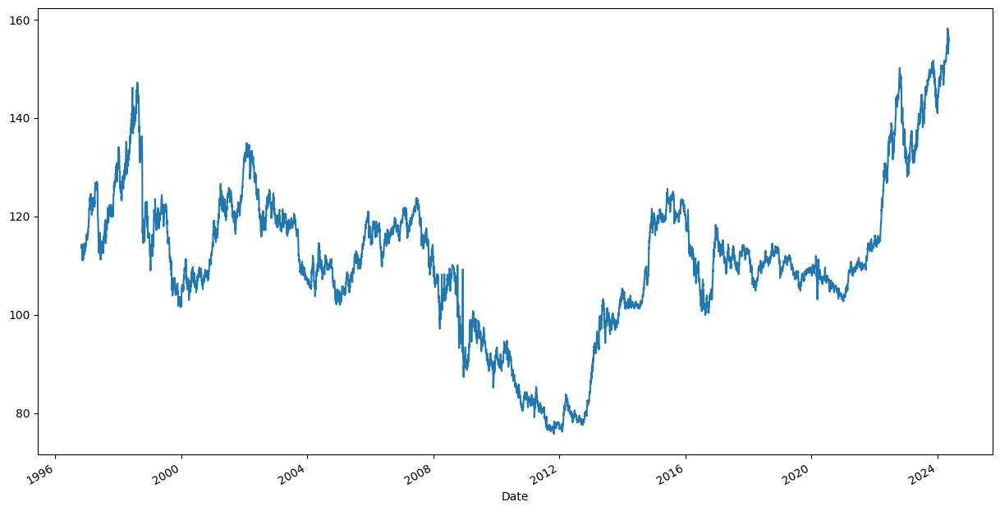

In [ ]:
# Plot the 'Close' column from the DataFrame
# Set the figure size to (15, 8) for better visualization
df.Close.plot(figsize=(15, 8));

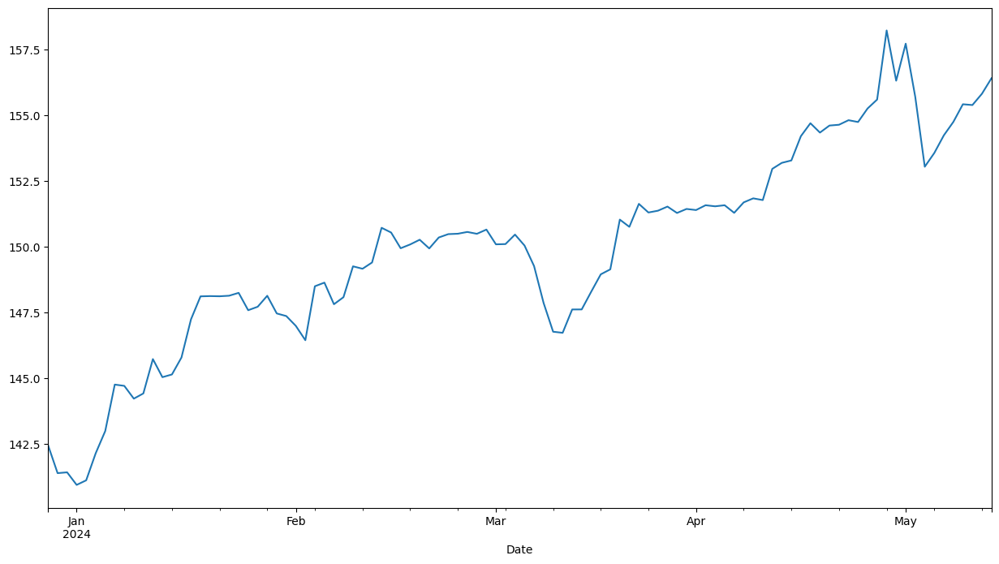

In [ ]:
# Plot the 'Close' column from the last 100 rows of the DataFrame
# Set the figure size to (15, 8) for better visualization
df.Close[-100:].plot(figsize=(15, 8));

### 5-Year Moving Average and Expanding Average

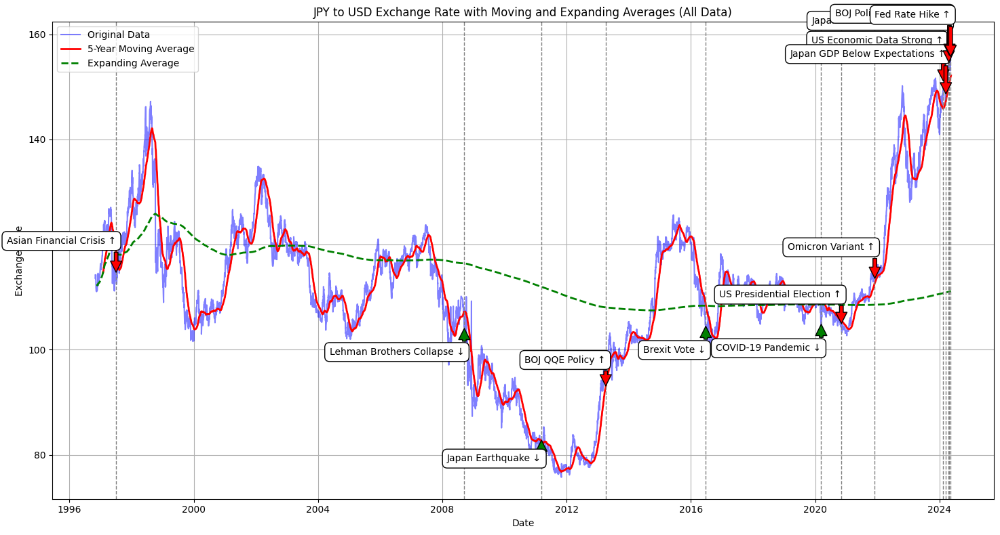

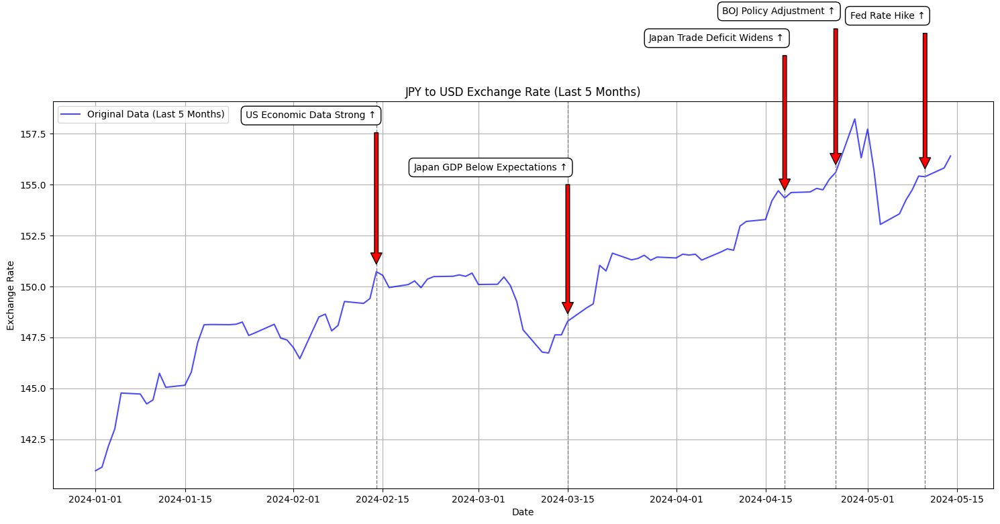

In [ ]:
# Calculate the 5-year (60-month) moving average
df['5-Year Moving Average'] = df['Close'].rolling(window=60).mean()

# Calculate the expanding average (cumulative mean) starting from the 12th observation
df['Expanding Average'] = df['Close'].expanding(12).mean()

# Define key events with their effects ('up' means JPY depreciates, 'down' means JPY appreciates)
events = {
    '1997-07-02': ('Asian Financial Crisis', 'up'),
    '2008-09-15': ('Lehman Brothers Collapse', 'down'),
    '2011-03-11': ('Japan Earthquake', 'down'),
    '2013-04-04': ('BOJ QQE Policy', 'up'),
    '2016-06-23': ('Brexit Vote', 'down'),
    '2020-03-11': ('COVID-19 Pandemic', 'down'),
    '2020-11-03': ('US Presidential Election', 'up'),
    '2021-12-01': ('Omicron Variant', 'up'),
    '2024-02-14': ('US Economic Data Strong', 'up'),
    '2024-03-15': ('Japan GDP Below Expectations', 'up'),
    '2024-04-18': ('Japan Trade Deficit Widens', 'up'),
    '2024-04-26': ('BOJ Policy Adjustment', 'up'),
    '2024-05-10': ('Fed Rate Hike', 'up'),
}

def annotate_event(ax, date, event, direction):
    """Add event annotations with arrows on the chart."""
    y = df.loc[date]['Close']
    if direction == 'up':
        # JPY depreciates (values on the chart increase)
        ax.annotate(f'{event} ↑',
                    xy=(pd.to_datetime(date), y),
                    xytext=(pd.to_datetime(date), y + 0.05 * y),  # Offset upwards
                    arrowprops=dict(facecolor='red', shrink=0.05),
                    horizontalalignment='right', fontsize=10,
                    bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    else:
        # JPY appreciates (values on the chart decrease)
        ax.annotate(f'{event} ↓',
                    xy=(pd.to_datetime(date), y),
                    xytext=(pd.to_datetime(date), y - 0.05 * y),  # Offset downwards
                    arrowprops=dict(facecolor='green', shrink=0.05),
                    horizontalalignment='right', fontsize=10,
                    bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

# Plot for all data
plt.figure(figsize=(15, 8))
plt.plot(df['Close'], label='Original Data', color='blue', alpha=0.5)
plt.plot(df['5-Year Moving Average'], label='5-Year Moving Average', color='red', linewidth=2)
plt.plot(df['Expanding Average'], label='Expanding Average', color='green', linestyle='--', linewidth=2)
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.title('JPY to USD Exchange Rate with Moving and Expanding Averages (All Data)')
plt.legend()
plt.grid(True)

# Add event annotations and vertical dashed lines
for date, (event, direction) in events.items():
    plt.axvline(pd.to_datetime(date), color='gray', linestyle='--', linewidth=1)
    annotate_event(plt.gca(), date, event, direction)

plt.tight_layout()
plt.show()

# Plot for the last 5 months
last_5_months = df.last('5M')

plt.figure(figsize=(15, 8))
plt.plot(last_5_months['Close'], label='Original Data (Last 5 Months)', color='blue', alpha=0.7)
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.title('JPY to USD Exchange Rate (Last 5 Months)')
plt.legend()
plt.grid(True)

# Add event annotations and vertical dashed lines (only for events in the last 5 months)
for date, (event, direction) in events.items():
    if pd.to_datetime(date) in last_5_months.index:
        plt.axvline(pd.to_datetime(date), color='gray', linestyle='--', linewidth=1)
        annotate_event(plt.gca(), date, event, direction)

plt.tight_layout()
plt.show()


1997-07-02: Asian Financial Crisis: Currencies across Asia depreciated, leading to a depreciation of the yen as well.

2008-09-15: Lehman Brothers Collapse: The global financial crisis erupted, and safe-haven flows into the yen caused it to appreciate.

2011-03-11: Japan Earthquake and Tsunami: The disaster triggered safe-haven demand, causing the yen to appreciate in the short term.

2013-04-04: Bank of Japan’s Quantitative and Qualitative Easing Policy: A large-scale easing policy was introduced, causing the yen to depreciate.

2016-06-23: Brexit Vote: Heightened market risk aversion led to yen appreciation.

2020-03-11: COVID-19 Pandemic: Increased global economic uncertainty led to safe-haven flows into the yen.

2020-11-03: U.S. Presidential Election: Market expectations for a stronger dollar caused the yen to depreciate.

2021-12-01: Discovery of Omicron Variant: Market concerns over the new variant led to yen depreciation.

2024-02-14: Strong U.S. Economic Data: Strong U.S. economic data strengthened the dollar, causing the yen to depreciate.

2024-03-15: Japanese GDP Below Expectations: Lower-than-expected economic growth in Japan led to yen depreciation.

2024-04-18: Widening Japanese Trade Deficit: An increasing trade deficit led to yen depreciation.

2024-04-26: Bank of Japan Policy Adjustment: Potential reduction in monetary stimulus caused the yen to depreciate.

2024-05-10: Federal Reserve Rate Hike: A Fed rate hike strengthened the dollar, causing the yen to depreciate.


### Pivot Table and Heatmap

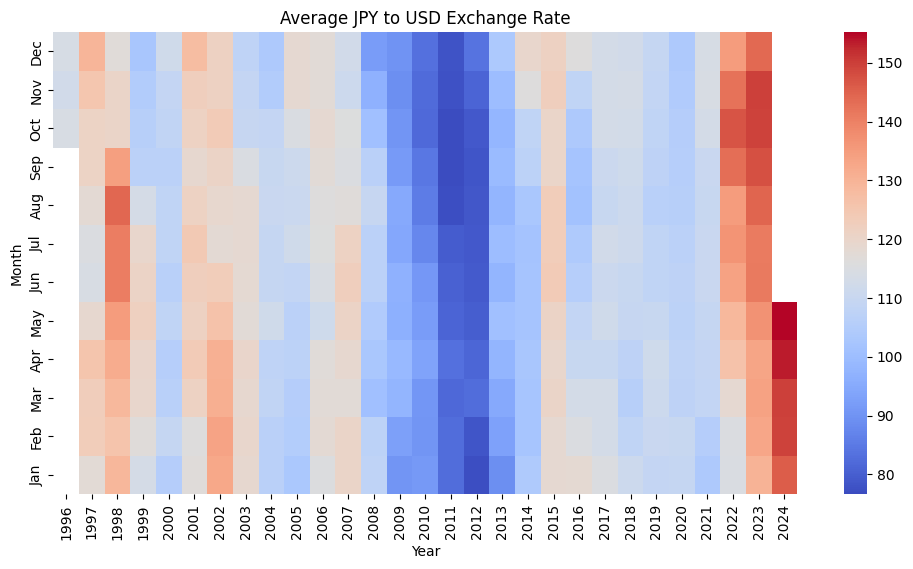

In [ ]:
# Add 'Year' and 'Month' columns to the data frame
df['Year'] = df.index.year
df['Month'] = df.index.month

# Create the pivot table
pivot_df = df.pivot_table(index='Month', columns='Year', values='Close')

# create a heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df[::-1], cmap='coolwarm', annot=False, yticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'][::-1])
plt.title('Average JPY to USD Exchange Rate')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

# Drop the 'Year' and 'Month' columns
df.drop('Year', axis=1, inplace=True)
df.drop('Month', axis=1, inplace=True)


### Scatter Plot

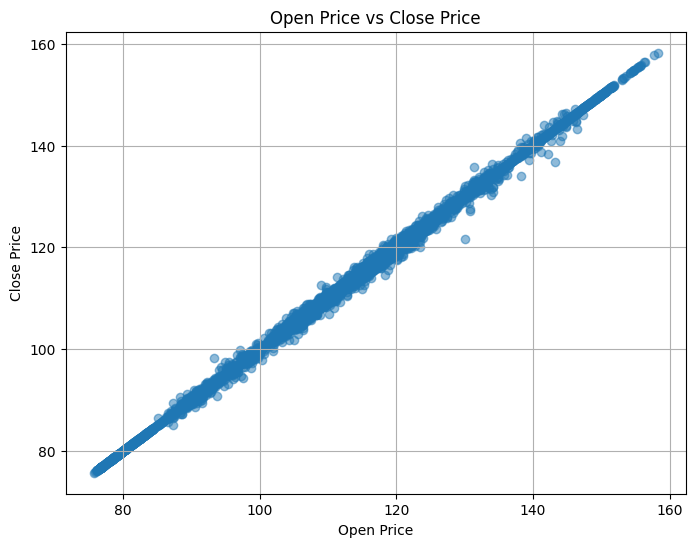

In [ ]:
# Scatterplotting
plt.figure(figsize=(8, 6))
plt.scatter(df['Open'], df['Close'], alpha=0.5)
plt.title('Open Price vs Close Price')
plt.xlabel('Open Price')
plt.ylabel('Close Price')
plt.grid(True)
plt.show()


In [ ]:
correlation_matrix = df.corr()
df.corr()

,Open,High,Low,Close,5-Year Moving Average,Expanding Average
Open,1.000000,0.999543,0.999318,0.999341,0.978354,0.209377
High,0.999543,1.000000,0.999150,0.999507,0.978804,0.215526
Low,0.999318,0.999150,1.000000,0.999511,0.976848,0.201314
Close,0.999341,0.999507,0.999511,1.000000,0.977755,0.208675
5-Year Moving Average,0.978354,0.978804,0.976848,0.977755,1.000000,0.248779
Expanding Average,0.209377,0.215526,0.201314,0.208675,0.248779,1.000000


### Correlation Matrix

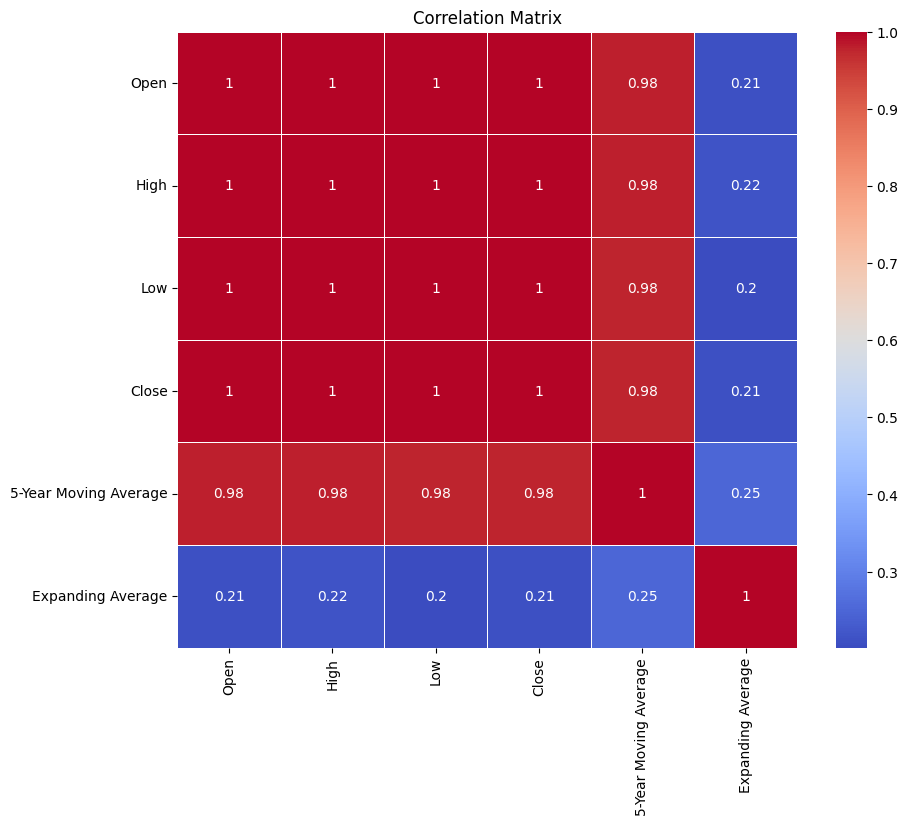

In [ ]:
# Heatmap the correlation coefficient matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [ ]:
df.corr().sum()

Open                     5.185933
High                     5.192530
Low                      5.176141
Close                    5.184788
5-Year Moving Average    5.160539
Expanding Average        2.083671
dtype: float64

ADF Statistic: -0.9895387165834731
p-value: 0.7570606653275125


<Figure size 1000x600 with 0 Axes>

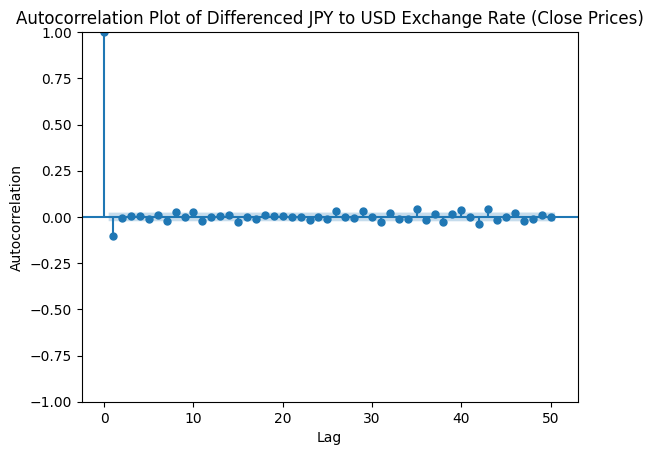

In [ ]:
closing_prices = df['Close']

# Check the statistics of the data
result = adfuller(closing_prices)
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Differentiate the data
differenced = closing_prices.diff().dropna()

# Re-plot the autocorrelation
plt.figure(figsize=(10, 6))
plot_acf(differenced, lags=50)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot of Differenced JPY to USD Exchange Rate (Close Prices)')
plt.show()

### Classical Decomposition and STL Decomposition

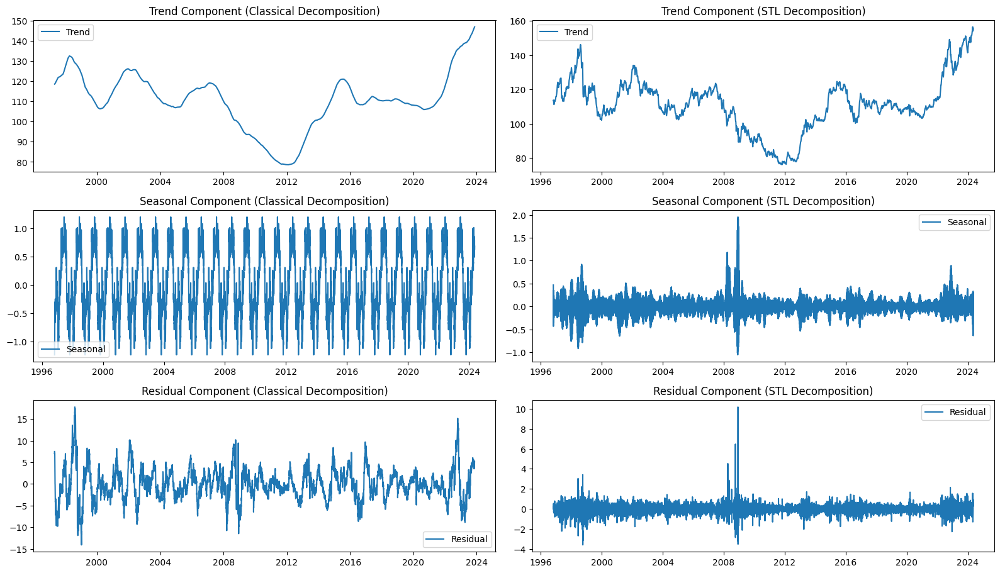

In [ ]:
df = df.sort_index()
df = df[~df.index.duplicated(keep='first')]

closing_prices = df['Close']

# Ensure that data are consistently spaced and that missing values are addressed
closing_prices = closing_prices.asfreq('D').interpolate()  # Resampling by daily frequency and filling in missing values using linear interpolation

# Execute the classic decomposition
classical_decomposition = seasonal_decompose(closing_prices, model='additive', period=365)

# Extraction of decomposed components
classical_trend = classical_decomposition.trend
classical_seasonal = classical_decomposition.seasonal
classical_residual = classical_decomposition.resid

# Perform STL decomposition
stl = STL(closing_prices, seasonal=13)
stl_result = stl.fit()

# Extraction of decomposed components
stl_trend = stl_result.trend
stl_seasonal = stl_result.seasonal
stl_residual = stl_result.resid

# Plotting decomposed components
plt.figure(figsize=(16, 12))

# Classic Breakdown Components
plt.subplot(4, 2, 1)
plt.plot(classical_trend.index, classical_trend, label='Trend')
plt.title('Trend Component (Classical Decomposition)')
plt.legend()

plt.subplot(4, 2, 3)
plt.plot(classical_seasonal.index, classical_seasonal, label='Seasonal')
plt.title('Seasonal Component (Classical Decomposition)')
plt.legend()

plt.subplot(4, 2, 5)
plt.plot(classical_residual.index, classical_residual, label='Residual')
plt.title('Residual Component (Classical Decomposition)')
plt.legend()

# STL
plt.subplot(4, 2, 2)
plt.plot(stl_trend.index, stl_trend, label='Trend')
plt.title('Trend Component (STL Decomposition)')
plt.legend()

plt.subplot(4, 2, 4)
plt.plot(stl_seasonal.index, stl_seasonal, label='Seasonal')
plt.title('Seasonal Component (STL Decomposition)')
plt.legend()

plt.subplot(4, 2, 6)
plt.plot(stl_residual.index, stl_residual, label='Residual')
plt.title('Residual Component (STL Decomposition)')
plt.legend()

plt.tight_layout()
plt.show()


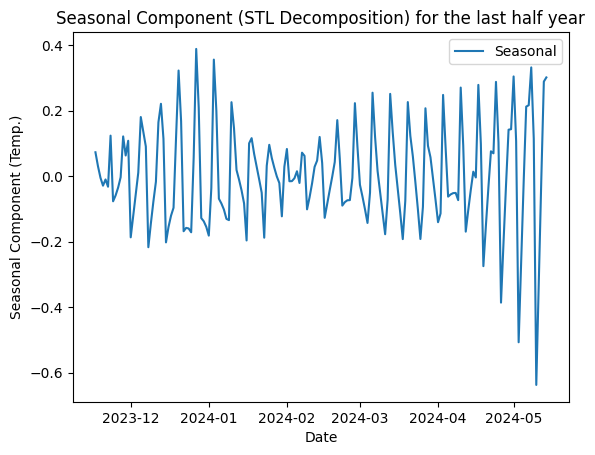

In [ ]:
# Plot the seasonal component (STL Decomposition) for the last five years
plt.plot(closing_prices.index[-180:], stl_seasonal[-180:], label='Seasonal')
plt.title('Seasonal Component (STL Decomposition) for the last half year')
plt.xlabel('Date')
plt.ylabel('Seasonal Component (Temp.)')
plt.legend()
plt.show()

### Differencing and Seasonal Differencing

**Assessing the smoothness of the data**
Before building a time series model, we need to assess the stationarity of the data. Smoothness refers to the fact that the statistical properties of the data (e.g., mean and variance) remain constant over time. If the data are not stationary, appropriate transformations (e.g., differencing) need to be performed to satisfy the modeling assumptions.
In this section, we perform the following operations.

Plot a time series plot of the raw data to visualize trends and seasonality.
Use the ADF (Augmented Dickey-Fuller) Test_data_data_data_data to assess the smoothness of the data.
If the data are not stationary, we will perform first-order differencing or seasonal differencing and reassess the stationarity.
For data that are still not smooth, methods such as logarithmic or square root transformation are attempted.

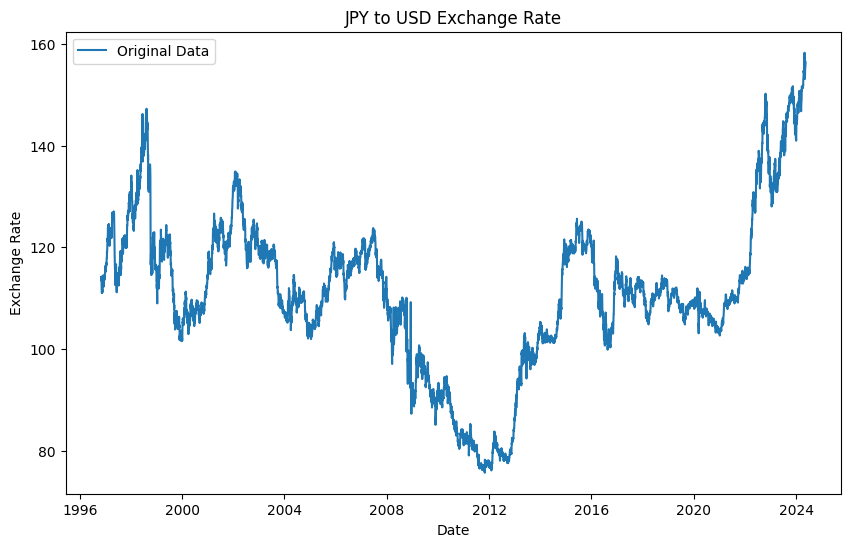

ADF Test:
ADF Statistic: -0.9304426601333022
p-value: 0.7777820005410316
ADF Test Result: Data is non-stationary



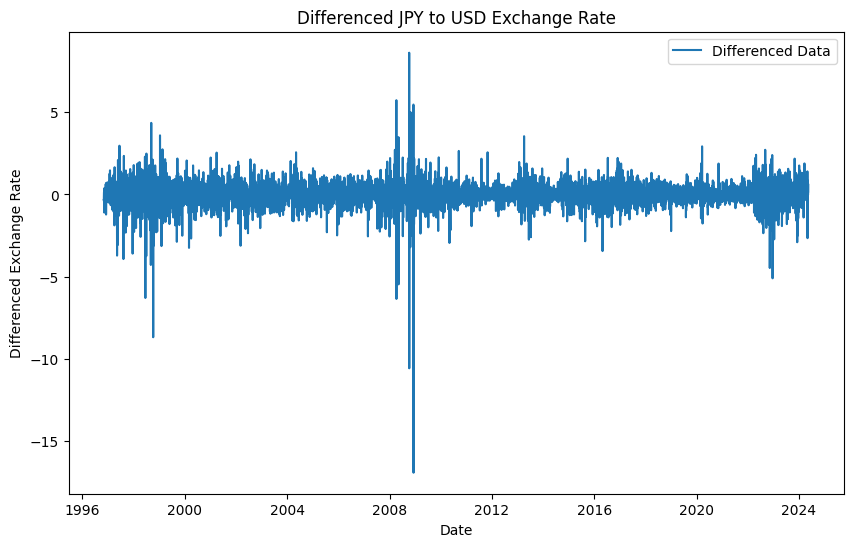

ADF Test:
ADF Statistic: -51.40296643014224
p-value: 0.0
ADF Test Result: Data is stationary



In [ ]:
def check_stationarity(data):
    # Perform ADF Test
    adf_result = adfuller(data)
    adf_statistic = adf_result[0]
    adf_p_value = adf_result[1]

    # Print results
    print("ADF Test:")
    print("ADF Statistic:", adf_statistic)
    print("p-value:", adf_p_value)
    if adf_p_value < 0.05:
        print("ADF Test Result: Data is stationary\n")
    else:
        print("ADF Test Result: Data is non-stationary\n")


# Plotting raw data
plt.figure(figsize=(10, 6))
plt.plot(closing_prices, label='Original Data')
plt.title('JPY to USD Exchange Rate')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.legend()
plt.show()

check_stationarity(closing_prices)

# If data are non-stationary, data can be differenced
differenced_data = closing_prices.diff().dropna()

# Plotting the differenced data
plt.figure(figsize=(10, 6))
plt.plot(differenced_data, label='Differenced Data')
plt.title('Differenced JPY to USD Exchange Rate')
plt.xlabel('Date')
plt.ylabel('Differenced Exchange Rate')
plt.legend()
plt.show()

check_stationarity(differenced_data)


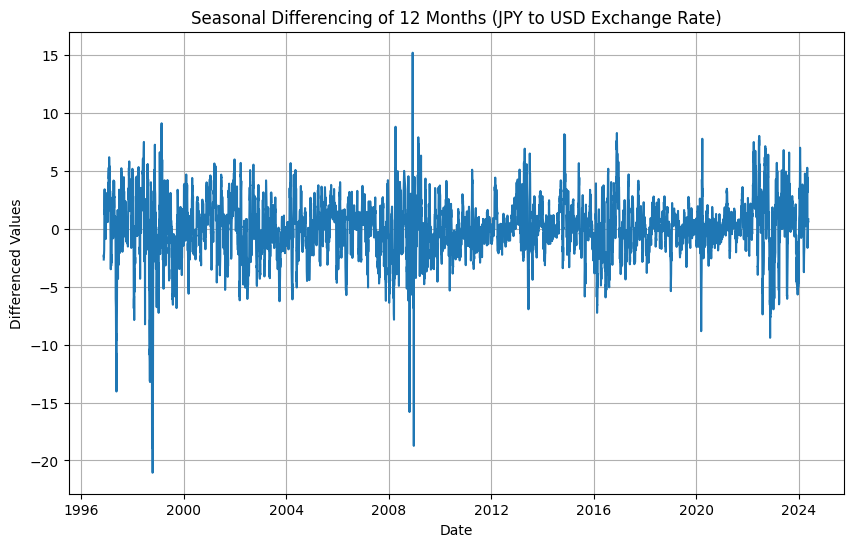

In [ ]:
# Seasonal spreads on closing prices (12 months)
seasonal_diff = df['Close'].diff(12)

# Plotting the differenced data
plt.figure(figsize=(10, 6))
plt.plot(seasonal_diff)
plt.title('Seasonal Differencing of 12 Months (JPY to USD Exchange Rate)')
plt.xlabel('Date')
plt.ylabel('Differenced Values')
plt.grid(True)
plt.show()

In [ ]:
check_stationarity(seasonal_diff.dropna())

ADF Test:
ADF Statistic: -13.570767086593714
p-value: 2.2172388678366066e-25
ADF Test Result: Data is stationary



In [ ]:
# Compute the absolute minimum value of the seasonal differenced data
add_value = round(abs(seasonal_diff.min()))

# Print the value to be subtracted after developing the model
print(f"This value has to be subtracted after developing our model = {add_value}")

# Add the absolute minimum value to the seasonal differenced data
seasonal_diff += add_value

This value has to be subtracted after developing our model = 21


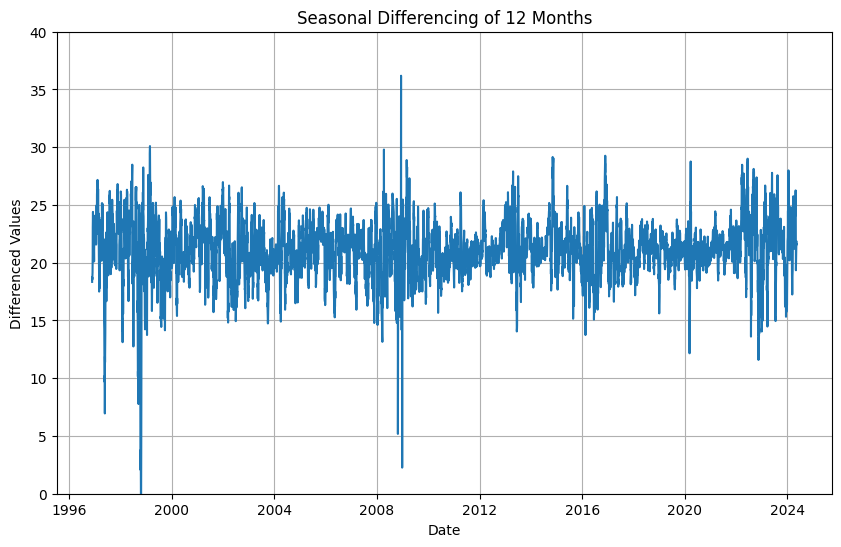

In [ ]:
# Plot the differenced column with adjusted y-axis limits
plt.figure(figsize=(10, 6))
plt.plot(seasonal_diff)
plt.title('Seasonal Differencing of 12 Months')
plt.xlabel('Date')
plt.ylabel('Differenced Values')
plt.grid(True)
plt.ylim([0, 40])  # Adjust y-axis limits for better visualization
plt.show()

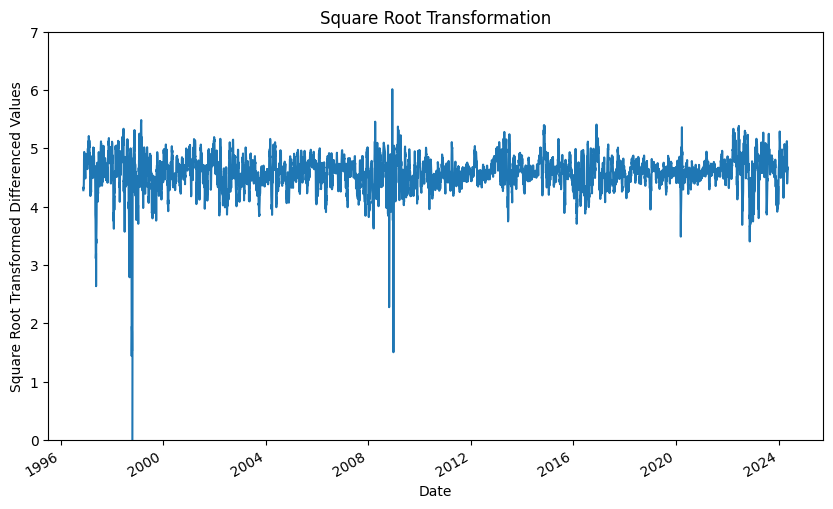

In [ ]:
# Apply square root transformation to the seasonal differenced data
df_cube = np.power(seasonal_diff, 1/2)

# Plot the transformed data
df_cube.plot(ylabel="Square Root Transformed Differenced Values", legend=False, figsize=(10, 6))
plt.ylim([0, 7])  # Adjust y-axis limits for better visualization
plt.title('Square Root Transformation')
plt.show()

# Time Series Forecasting Models

### Simple Time Series Forecasting Models

Before starting the complex time series modeling, several simple benchmark models were tried, including.

The mean model (TSMean)
The Simple Time Series Model (TSNaive)
Seasonal (TSNaiveSeasonal)
Drift model (TSDrift)

These models were fitted on a training set and their performance was evaluated on a Test set. These benchmark models usually perform generally average, but can be used as a baseline for comparison.

In [ ]:
class TSMean:
    def __init__(self, series):
        self.mean = series.mean()

    def forecast(self, steps):
        return [self.mean] * steps

class TSNaive:
    def __init__(self, series):
        self.last_value = series.iloc[-1]

    def fit(self):
        return self

    def forecast(self, steps):
        return [self.last_value] * steps

class TSNaiveSeasonal:
    def __init__(self, series, period):
        self.period = period
        self.values = series.values

    def forecast(self, steps):
        seasonal_forecast = []
        for i in range(steps):
            index = len(self.values) - (i % self.period) - 1
            seasonal_forecast.append(self.values[index])
        return seasonal_forecast[::-1]

class TSDrift:
    def __init__(self, series):
        self.x_start = 0
        self.x_end = len(series) - 1
        self.y_start = series.iloc[0]
        self.y_end = series.iloc[-1]
        self.slope = (self.y_end - self.y_start) / (self.x_end - self.x_start)
        self.intercept = self.y_start - self.slope * self.x_start

    def forecast(self, steps):
        forecast_values = [self.intercept + self.slope * (self.x_end + i) for i in range(1, steps + 1)]
        return forecast_values

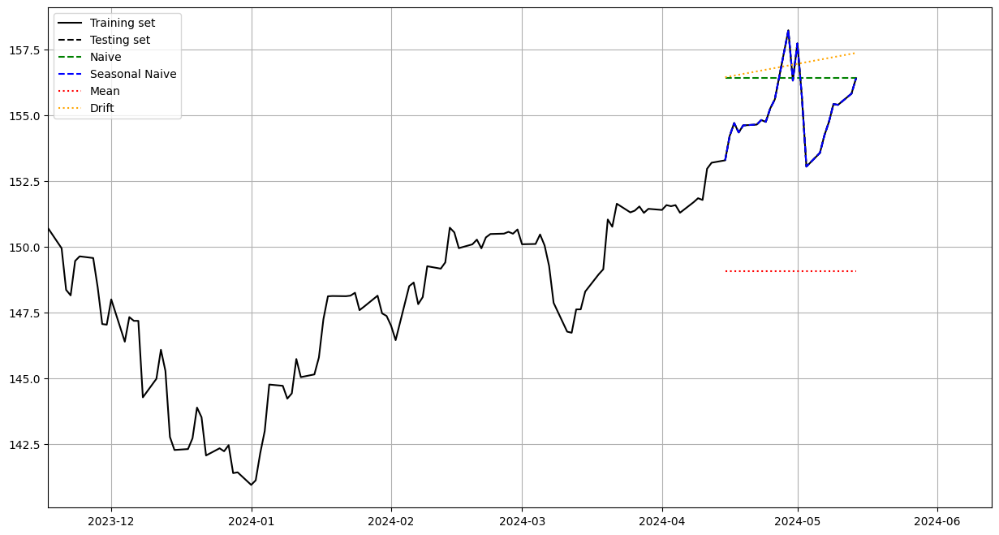

In [ ]:
Train = closing_prices[-6*30:]

# Tested using data from the last 1 month
Test = closing_prices[-30:]

# Create model instances
m = TSMean(Train)
n = TSNaive(Train).fit()
s = TSNaiveSeasonal(Train, 30)
dr = TSDrift(Train)

# Generate forecasts
forecast_naive = n.forecast(30)
forecast_seasonal = s.forecast(30)
forecast_mean = m.forecast(30)
forecast_drift = dr.forecast(30)

# Plot forecast results, showing only the last six months of data
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(Train, 'k', label='Training set')
ax.plot(Test.index, Test, 'k', linestyle='--', label='Testing set')
ax.plot(Test.index, forecast_naive, color='green', label='Naive', linestyle='--')
ax.plot(Test.index, forecast_seasonal, color='blue', label='Seasonal Naive', linestyle='--')
ax.plot(Test.index, forecast_mean, color='red', label='Mean', linestyle='dotted')
ax.plot(Test.index, forecast_drift, color='orange', label='Drift', linestyle=':')
ax.legend(loc='upper left')
ax.grid()
plt.xlim(pd.Timestamp(closing_prices.index[-6*30]), pd.Timestamp(closing_prices.index[-1] + pd.Timedelta(days=30)))
plt.show()



ADF Test:
ADF Statistic: -2.011391427699809
p-value: 0.2816007995726891
ADF Test Result: Data is non-stationary



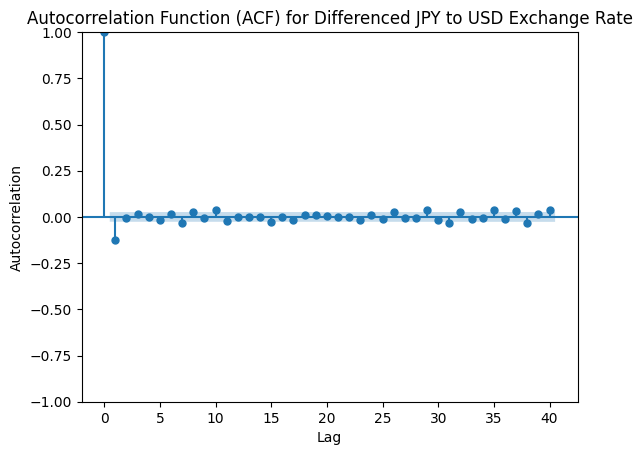

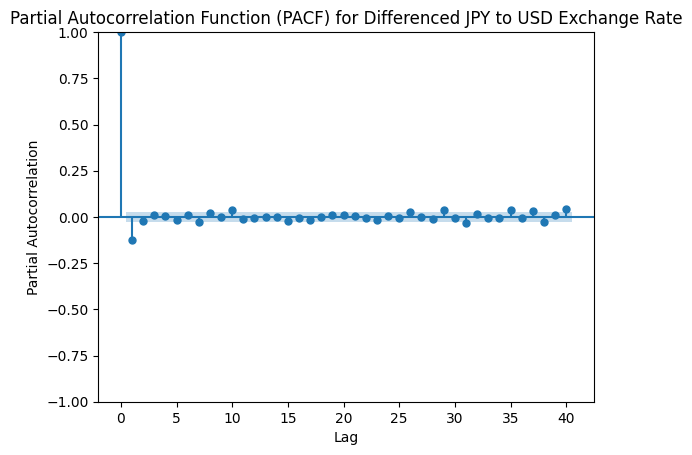

Total Observations: 7142
Training Observations: 5713
Testing Observations: 1429


In [ ]:
# Split data into training and Testing sets
split_ratio = 0.8
split_index = int(len(df) * split_ratio)
Train = df['Close'][:split_index]
Test = df['Close'][split_index:]

# ADF Test
def check_stationarity(data):
    adf_result = adfuller(data)
    adf_statistic = adf_result[0]
    adf_p_value = adf_result[1]

    print("ADF Test:")
    print("ADF Statistic:", adf_statistic)
    print("p-value:", adf_p_value)
    if adf_p_value < 0.05:
        print("ADF Test Result: Data is stationary\n")
    else:
        print("ADF Test Result: Data is non-stationary\n")

check_stationarity(Train)

# If the data is non-stationary, try first-order differencing
differenced_data = Train.diff().dropna()

# Plotting the ACF and PACF for differenced data
plot_acf(differenced_data, lags=40)
plt.title('Autocorrelation Function (ACF) for Differenced JPY to USD Exchange Rate')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

plot_pacf(differenced_data, lags=40)
plt.title('Partial Autocorrelation Function (PACF) for Differenced JPY to USD Exchange Rate')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

# Print information about the data
print('Total Observations: {}'.format(len(df)))
print('Training Observations: {}'.format(len(Train)))
print('Testing Observations: {}'.format(len(Test)))



### Model Performance Evaluation

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Define evaluation indicator calculation functions
def calculate_metrics(true_values, forecasted_values):
    rmse = np.sqrt(mean_squared_error(true_values, forecasted_values))
    mae = mean_absolute_error(true_values, forecasted_values)
    mape = np.mean(np.abs((true_values - forecasted_values) / true_values)) * 100
    return [rmse, mae, mape]

# Define the number of steps for the Test set (e.g., 30 for the last month)
steps = 30

# Placeholder forecasts for demonstration (Replace with actual forecast values)
naive_forecast = Test.shift(1).dropna()
seasonal_naive_forecast = Test.shift(30).dropna()  # Assuming seasonality is 30 days
mean_forecast = [np.mean(Train)] * len(Test)  # Simple mean of training data
drift_forecast = (Test.shift(1) + (Test.shift(1) - Test.shift(2))).dropna()

# Truncate forecasts to match Test data length if necessary
naive_forecast = naive_forecast[-steps:]
seasonal_naive_forecast = seasonal_naive_forecast[-steps:]
mean_forecast = mean_forecast[-steps:]
drift_forecast = drift_forecast[-steps:]

# Select actual values for the last 'steps' days as the Test set
Test = closing_prices[-steps:]

# Ensure the forecast arrays have the same length as the Test data
naive_forecast = naive_forecast[-steps:]
seasonal_naive_forecast = seasonal_naive_forecast[-steps:]
mean_forecast = mean_forecast[-steps:]
drift_forecast = drift_forecast[-steps:]

# Calculate evaluation indicators for each model
naive_metrics = calculate_metrics(Test, naive_forecast)
seasonal_metrics = calculate_metrics(Test, seasonal_naive_forecast)
mean_metrics = calculate_metrics(Test, mean_forecast)
drift_metrics = calculate_metrics(Test, drift_forecast)

results = pd.DataFrame({
    'Model': ['Naive', 'Seasonal Naive', 'Mean', 'Drift'],
    'RMSE': [naive_metrics[0], seasonal_metrics[0], mean_metrics[0], drift_metrics[0]],
    'MAE': [naive_metrics[1], seasonal_metrics[1], mean_metrics[1], drift_metrics[1]],
    'MAPE (%)': [naive_metrics[2], seasonal_metrics[2], mean_metrics[2], drift_metrics[2]]
})
results.set_index('Model', inplace=True)

print(results)



                     RMSE        MAE   MAPE (%)
Model                                          
Naive            2.362837   2.068000   0.505475
Seasonal Naive   5.662461   5.144901   3.408525
Mean            46.584558  46.567222  30.014973
Drift            2.662246   2.019402   0.683978


### Autoregression (AR) Model and MA model

Coefficients: [ 6.75210560e-02  2.69119166e-02  1.59081073e-01  1.05624533e-01
 -1.00687876e-01 -1.01645656e-01  9.39047996e-02 -2.23405279e-02
 -1.92718995e-02  3.30610333e-03 -1.52555256e-02 -5.85634295e-02
 -7.07209398e-02 -6.38775155e-02  1.75117071e-01  2.68253147e-02
  4.29195923e-02 -1.68534528e-01 -5.66284523e-02  1.12217045e-01
  3.49693021e-02 -2.73376154e-02 -5.78308175e-02  7.85987270e-02
 -3.43419549e-02  1.03793368e-01  3.83045446e-02  2.23642797e-02
  1.33281730e-01 -1.07277678e-01  1.22443412e-01  6.19186873e-05
 -1.68581453e-01  5.04503524e-02 -8.49976361e-02 -1.22864476e-01
 -2.24573673e-03 -8.93857048e-02  7.02895246e-03  2.80646400e-01
  1.19714827e-01 -1.69616305e-01  4.55843279e-02 -2.47928088e-01
  1.26614630e-01  5.75608737e-03 -9.89288905e-02  2.98839788e-01
 -1.40730386e-01 -4.51703603e-02  1.23217444e-01]


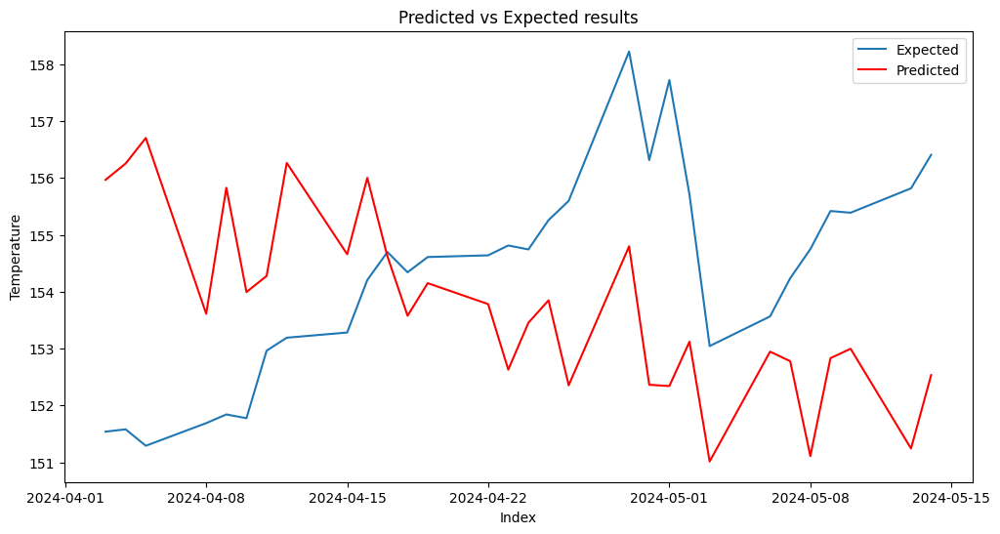

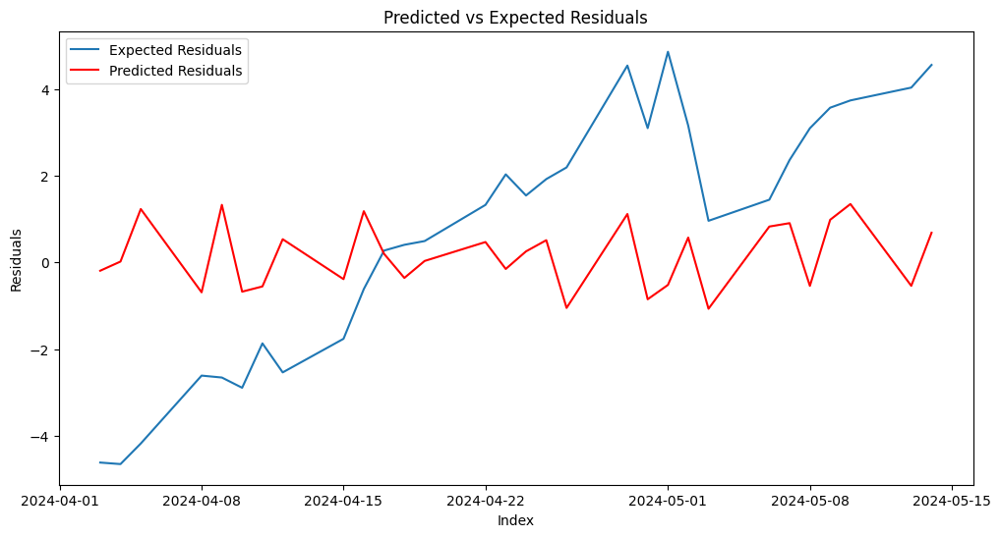

In [ ]:
# Use the last six months of data for training
Train = df['Close'][-6*30:]
# Use the last month of data for testing
Test = df['Close'][-30:]

# Train the AR model
model = AutoReg(Train, lags=25)
model_fit = model.fit()
ar_predictions = model_fit.predict(start=len(Train), end=len(Train)+len(Test)-1, dynamic=False).values

# Calculate residuals for the training data
ar_train_predictions = model_fit.predict(start=25, end=len(Train)-1, dynamic=False).values
Train_mod = Train[25:].values
train_resid = Train_mod - ar_train_predictions

# Train the MA model
model_ma = AutoReg(train_resid, lags=50)  # Adjust lag to 50
model_fit_ma = model_ma.fit()
print('Coefficients: %s' % model_fit_ma.params)

# Use the MA model to make predictions
predictions_ma = model_fit_ma.predict(start=len(train_resid), end=len(train_resid)+len(Test)-1, dynamic=False)

# Combine AR and MA predictions
predictions_sum = ar_predictions + predictions_ma

# Plot the predicted vs actual values
plt.figure(figsize=(12, 6))
plt.plot(Test.index, Test, label='Expected')
plt.plot(Test.index, predictions_sum, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected results')
plt.legend()
plt.show()

# Plot the residuals
plt.figure(figsize=(12, 6))
plt.plot(Test.index, Test - ar_predictions, label='Expected Residuals')
plt.plot(Test.index, predictions_ma, color='red', label='Predicted Residuals')
plt.xlabel('Index')
plt.ylabel('Residuals')
plt.title('Predicted vs Expected Residuals')
plt.legend()
plt.show()


In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,2.362837,2.068000,0.505475
Seasonal Naive,5.662461,5.144901,3.408525
Mean,46.584558,46.567222,30.014973
Drift,2.662246,2.019402,0.683978


In [ ]:
predictions_sum = [x + y for x, y in zip(ar_predictions, predictions_ma)]
# Calculate metrics for the predictions
metrics = calculate_metrics(Test, predictions_sum)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['AR+MA'] = metrics_df.values[0]

In [ ]:
# Automatically search for the best ARIMA model parameters using auto_arima function
auto_arima_model = auto_arima(Train, start_p=1, start_q=1,
                              max_p=30, max_q=30, m=1,
                              seasonal=False,
                              d=None, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

# Print the best parameters found by auto_arima
print("Best parameters found by auto_arima:", auto_arima_model.order)

# Create an ARIMA model with the best parameters obtained from auto_arima
model_arima = ARIMA(Train, order=auto_arima_model.order)

# Fit the ARIMA model to the training data
arima_fit = model_arima.fit()

# Akaike Information Criterion (AIC) is a metric used to evaluate the goodness of fit of a statistical model while penalizing for the number of parameters in the model.
# The lower the AIC value, the better the model is considered to be.
# "intercept" refers to an additional parameter in the model equation that represents a constant term or a baseline level. Including an intercept term allows the model to capture any systematic offset or bias in the data that is not explained by the autoregressive (AR), differencing (I), and moving average (MA) components.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=431.130, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=427.731, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=429.612, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=429.597, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=426.443, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.406 seconds
Best parameters found by auto_arima: (0, 1, 0)


In [ ]:
arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Close   No. Observations:                  180
Model:                 ARIMA(0, 1, 0)   Log Likelihood                -212.222
Date:                Mon, 24 Jun 2024   AIC                            426.443
Time:                        15:30:51   BIC                            429.631
Sample:                    09-06-2023   HQIC                           427.736
                         - 05-14-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.6271      0.045     13.840      0.000       0.538       0.716
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):                49.75
Prob(Q):                              0.73   Prob(JB):                         0.00
Heteroskedasticity (H):               1.66   Skew:                            -0.46
Prob(H) (two-sided):                  0.05   Kurtosis:                         5.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### ARIMA model

ADF Test Statistic: -0.852392555333068
p-value: 0.8032459021535625
Critical Values:
   1%: -3.4674201432469816
Critical Values:
   5%: -2.877826051844538
Critical Values:
   10%: -2.575452082332012
ADF Test Statistic: -13.598514886472701
p-value: 1.9737011367202665e-25
Critical Values:
   1%: -3.467631519151906
Critical Values:
   5%: -2.8779183721695567
Critical Values:
   10%: -2.575501353364474
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  179
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -213.732
Date:                Mon, 24 Jun 2024   AIC                            437.464
Time:                        15:30:51   BIC                            453.373
Sample:                    09-07-2023   HQIC                           443.915
                         - 05-14-2024                                         
Covariance Type:                  opg         

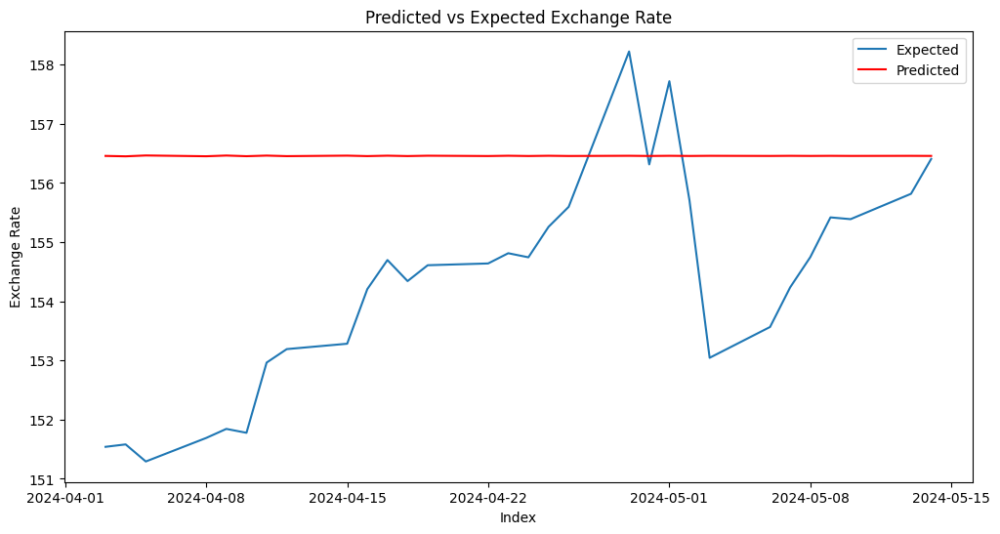

                  RMSE      MAE  MAPE (%)
ARIMA_manual  2.808366  2.37154       NaN


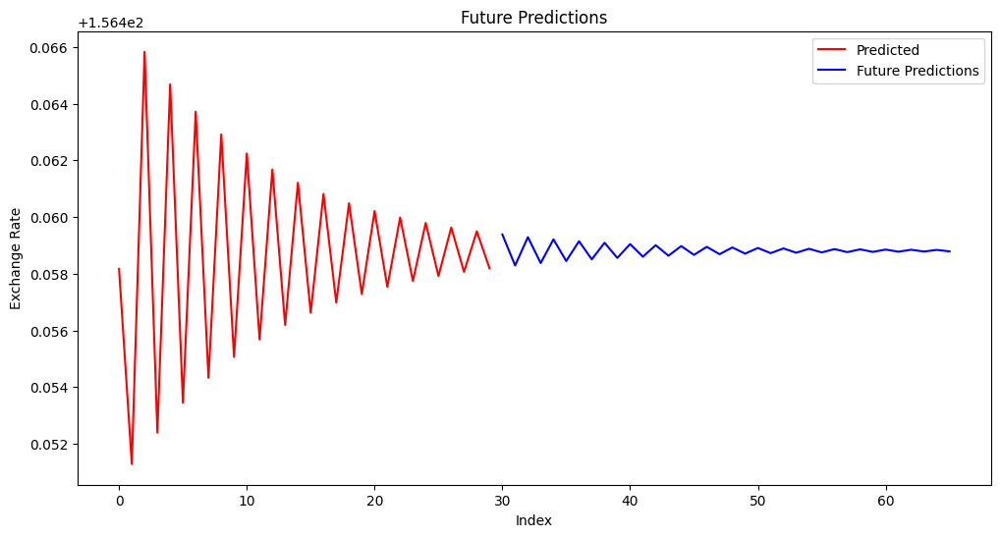

In [ ]:
# Check for stationarity and perform differencing if necessary
def test_stationarity(timeseries):
    adf_test = adfuller(timeseries, autolag='AIC')
    print('ADF Test Statistic:', adf_test[0])
    print('p-value:', adf_test[1])
    for key, value in adf_test[4].items():
        print('Critical Values:')
        print(f'   {key}: {value}')

test_stationarity(Train)

# Perform first-order differencing if needed
Train_diff = Train.diff().dropna()
test_stationarity(Train_diff)

# Manually adjust ARIMA parameters
manual_arima_model = ARIMA(Train_diff, order=(2, 1, 2))  # You can try other combinations (p, d, q)
arima_fit_manual = manual_arima_model.fit()
print(arima_fit_manual.summary())

# Make predictions using the fitted model
predictions_manual = arima_fit_manual.predict(start=len(Train_diff), end=len(Train_diff)+len(Test)-1, dynamic=False)

# Adjust the predictions by reversing differencing
predictions_adjusted = predictions_manual + Train.iloc[-1]

# Plot predictions vs expected
plt.figure(figsize=(12, 6))
plt.plot(Test.index, Test, label='Expected')
plt.plot(Test.index, predictions_adjusted, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Exchange Rate')
plt.title('Predicted vs Expected Exchange Rate')
plt.legend()
plt.show()

# Calculate metrics for the predictions
def calculate_metrics(true_values, forecasted_values):
    rmse = np.sqrt(mean_squared_error(true_values, forecasted_values))
    mae = mean_absolute_error(true_values, forecasted_values)
    mape = np.mean(np.abs((true_values - forecasted_values) / true_values)) * 100
    return [rmse, mae, mape]

metrics = calculate_metrics(Test, predictions_adjusted)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Create or update the results DataFrame
results = pd.DataFrame(columns=['RMSE', 'MAE', 'MAPE (%)'])
results.loc['ARIMA_manual'] = metrics_df.values[0]
print(results)

# Make future predictions for the next 36 periods using the fitted model
future_predictions_manual = arima_fit_manual.predict(start=len(Train_diff)+len(Test), end=len(Train_diff)+len(Test)-1+36, dynamic=False)

# Adjust future predictions by reversing differencing
future_predictions_adjusted = future_predictions_manual + Train.iloc[-1]

# Plot future predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(predictions_adjusted)), predictions_adjusted, color='red', label='Predicted')
plt.plot(range(len(predictions_adjusted), len(predictions_adjusted)+len(future_predictions_adjusted)), future_predictions_adjusted, color='blue', label='Future Predictions')
plt.xlabel('Index')
plt.ylabel('Exchange Rate')
plt.title('Future Predictions')
plt.legend()
plt.show()


### SARIMA model


ADF Test Statistic: -0.852392555333068
p-value: 0.8032459021535625
   1%: -3.4674201432469816
   5%: -2.877826051844538
   10%: -2.575452082332012
ADF Test Statistic: -13.598514886472701
p-value: 1.9737011367202665e-25
   1%: -3.467631519151906
   5%: -2.8779183721695567
   10%: -2.575501353364474


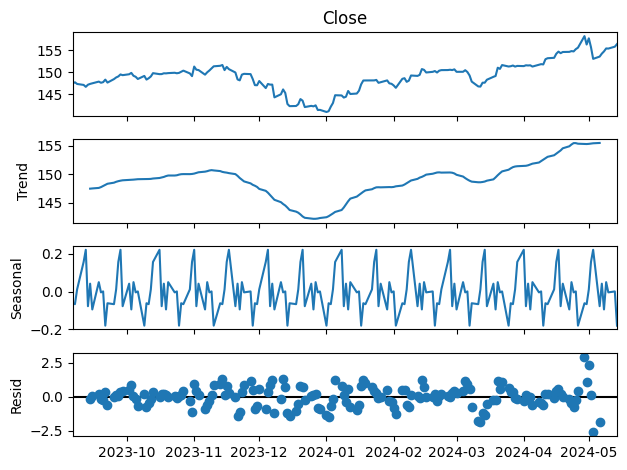

                                      SARIMAX Results                                       
Dep. Variable:                                Close   No. Observations:                  179
Model:             SARIMAX(2, 0, 2)x(1, 1, [1], 12)   Log Likelihood                -215.788
Date:                              Mon, 24 Jun 2024   AIC                            445.575
Time:                                      15:30:57   BIC                            467.401
Sample:                                  09-07-2023   HQIC                           454.434
                                       - 05-14-2024                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9135      0.102      8.971      0.000       0.714       1.113
ar.L2         -0.95

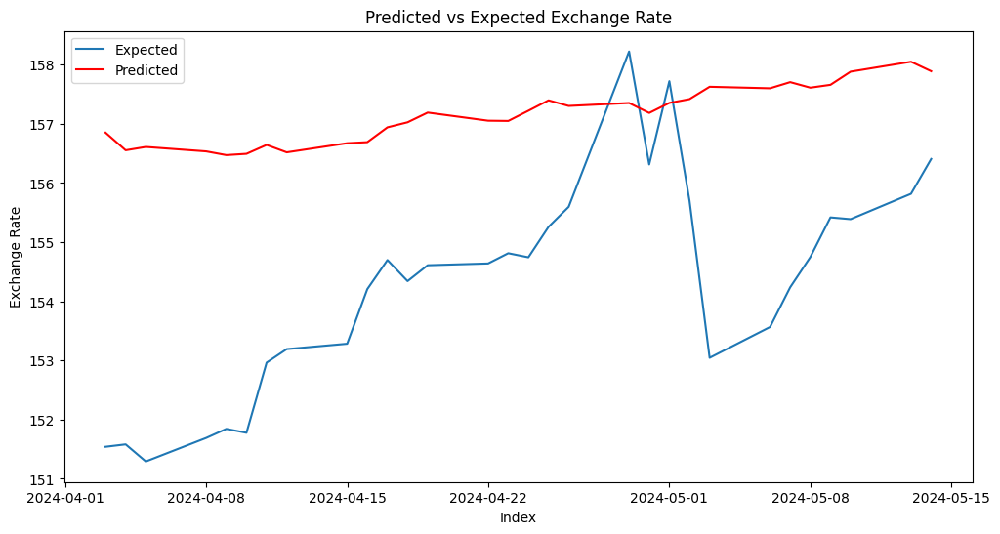

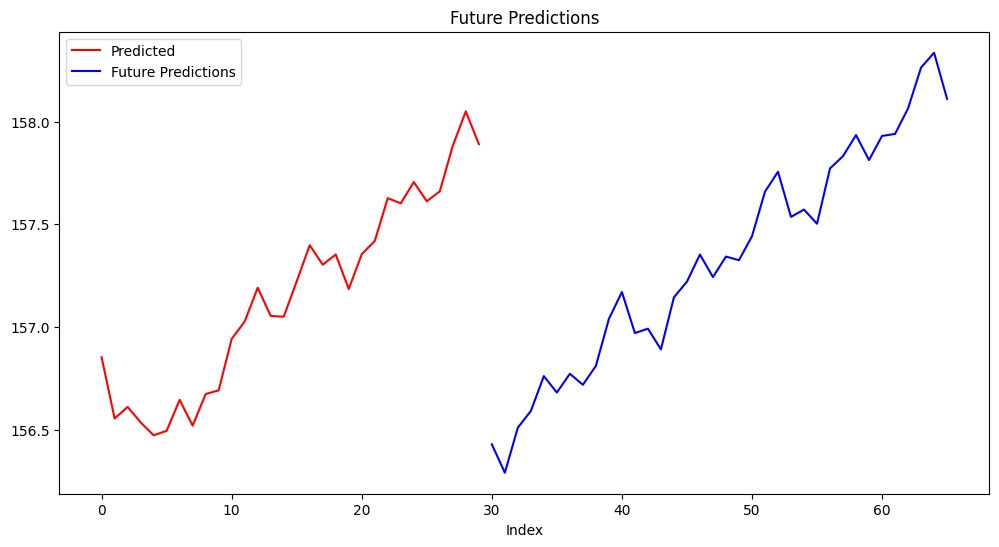

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import pandas as pd

# Function for stationarity check
def test_stationarity(timeseries):
    adf_test = adfuller(timeseries, autolag='AIC')
    print('ADF Test Statistic:', adf_test[0])
    print('p-value:', adf_test[1])
    for key, value in adf_test[4].items():
        print(f'   {key}: {value}')

test_stationarity(Train)

# Differencing
Train_diff = Train.diff().dropna()
test_stationarity(Train_diff)

# Plot trend and seasonality decomposition
decomposition = seasonal_decompose(Train, model='additive', period=12)
decomposition.plot()
plt.show()

# Manually adjust SARIMA parameters
sarima_model = SARIMAX(Train_diff, order=(2, 0, 2), seasonal_order=(1, 1, 1, 12))
sarima_fit = sarima_model.fit(disp=False)
print(sarima_fit.summary())

# Prediction
predictions_sarima = sarima_fit.predict(start=len(Train_diff), end=len(Train_diff)+len(Test)-1, dynamic=False)
predictions_sarima_adjusted = predictions_sarima.cumsum() + Train.iloc[-1]

# Validate model performance
def calculate_metrics(actual, predicted):
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mae = mean_absolute_error(actual, predicted)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    return rmse, mae, mape

metrics = calculate_metrics(Test, predictions_sarima_adjusted)

# Display metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])
results = pd.DataFrame(columns=['RMSE', 'MAE', 'MAPE (%)'])
results.loc['SARIMA'] = metrics_df.values[0]
print(results)

# Future predictions
future_predictions_sarima = sarima_fit.predict(start=len(Train_diff)+len(Test), end=len(Train_diff)+len(Test)-1+36, dynamic=False)
future_predictions_sarima_adjusted = future_predictions_sarima.cumsum() + Train.iloc[-1]

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(Test.index, Test, label='Expected')
plt.plot(Test.index, predictions_sarima_adjusted, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Exchange Rate')
plt.title('Predicted vs Expected Exchange Rate')
plt.legend()
plt.show()

# Plot future predictions
plt.figure(figsize=(12, 6))
plt.plot(range(len(predictions_sarima_adjusted)), predictions_sarima_adjusted, color='red', label='Predicted')
plt.plot(range(len(predictions_sarima_adjusted), len(predictions_sarima_adjusted)+len(future_predictions_sarima_adjusted)), future_predictions_sarima_adjusted, color='blue', label='Future Predictions')
plt.xlabel('Index')
plt.title('Future Predictions')
plt.legend()
plt.show()


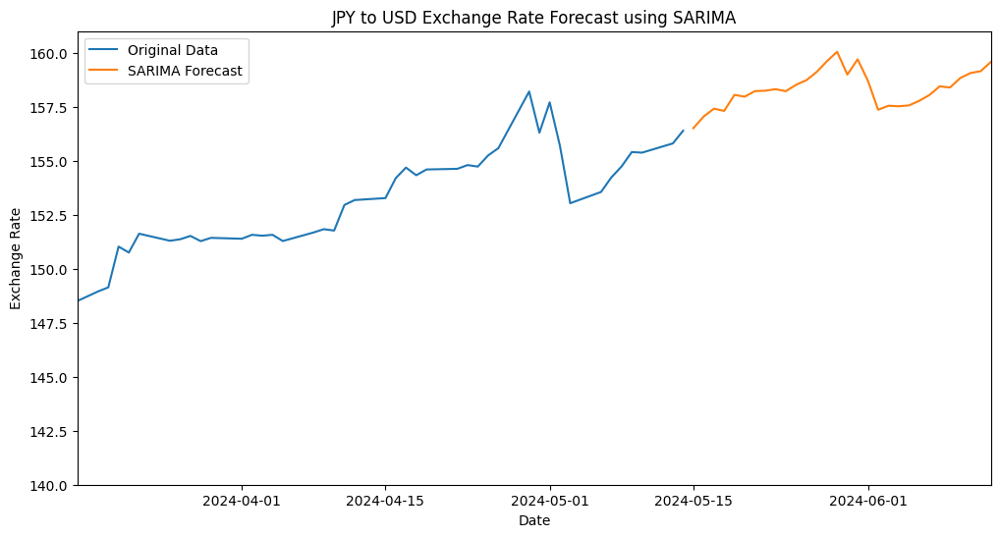

In [ ]:
Train = closing_prices[-6*30:]

steps = 30

# SARIMA
sarima_model = SARIMAX(Train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 30))
sarima_fit = sarima_model.fit(disp=False)

sarima_forecast = sarima_fit.get_forecast(steps=steps)
sarima_forecast_values = sarima_forecast.predicted_mean

all_data = pd.concat([closing_prices, sarima_forecast_values])

plt.figure(figsize=(12, 6))
plt.plot(closing_prices[-6*30:], label='Original Data')
plt.plot(sarima_forecast_values.index, sarima_forecast_values, label='SARIMA Forecast')
plt.title('JPY to USD Exchange Rate Forecast using SARIMA')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.legend()
plt.xlim(pd.Timestamp(closing_prices.index[-2*30]), pd.Timestamp(closing_prices.index[-1] + pd.Timedelta(days=steps)))
plt.show()

### Holt-Winters Seasonal Model

In [ ]:
# Stationarity check
def test_stationarity(timeseries):
    adf_test = adfuller(timeseries, autolag='AIC')
    print('ADF Test Statistic:', adf_test[0])
    print('p-value:', adf_test[1])
    for key, value in adf_test[4].items():
        print(f'   {key}: {value}')

print("\nOriginal Series:")
test_stationarity(Train)


Original Series:
ADF Test Statistic: -0.6792432104344713
p-value: 0.8520530085031144
   1%: -3.467631519151906
   5%: -2.8779183721695567
   10%: -2.575501353364474


In [ ]:
# Differential processing
Train_diff = Train.diff().dropna()
print("\nDifferenced Series:")
test_stationarity(Train_diff)


Differenced Series:
ADF Test Statistic: -11.56796391675267
p-value: 3.1524972079783577e-21
   1%: -3.467631519151906
   5%: -2.8779183721695567
   10%: -2.575501353364474


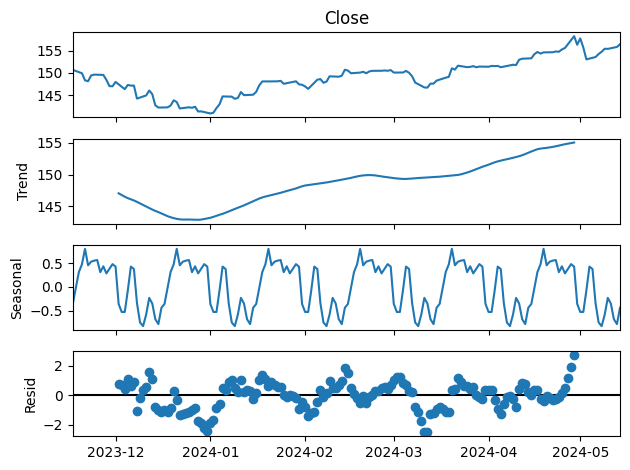

In [ ]:
# Plot Trend and Seasonal Decomposition Chart
decomposition = seasonal_decompose(Train, model='additive', period=30)  # period 30 适用于每日数据
decomposition.plot()
plt.show()

In [ ]:
# Fit Holt-Winters seasonal model
holt_winters_model = ExponentialSmoothing(
    Train,
    seasonal_periods=30,  # Set the seasonal period to 30
    trend='add',  # 'add' indicates an additive trend
    seasonal='add'  # 'add' indicates additive seasonality
).fit()

# Print model parameters
print('Holt-Winters Model Parameters:')
print(f'Level: {holt_winters_model.params["smoothing_level"]}')
print(f'Trend: {holt_winters_model.params["smoothing_trend"]}')
print(f'Seasonal: {holt_winters_model.params["smoothing_seasonal"]}')

Holt-Winters Model Parameters:
Level: 0.9999999850988388
Trend: 0.017128842212896386
Seasonal: 6.093420929291031e-13


In [ ]:
# Make predictions using the fitted Holt-Winters model
predictions_holt_winters = holt_winters_model.forecast(len(Test))

# Evaluate model performance
def calculate_metrics(true_values, forecasted_values):
    rmse = np.sqrt(mean_squared_error(true_values, forecasted_values))
    mae = mean_absolute_error(true_values, forecasted_values)
    mape = np.mean(np.abs((true_values - forecasted_values) / true_values)) * 100
    return [rmse, mae, mape]

metrics = calculate_metrics(Test, predictions_holt_winters)

# Display metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])
results = pd.DataFrame(columns=['RMSE', 'MAE', 'MAPE (%)'])
results.loc['Holt-Winters'] = metrics_df.values[0]
print(results)

# Forecast future values
future_predictions_holt_winters = holt_winters_model.forecast(36)

                  RMSE       MAE  MAPE (%)
Holt-Winters  3.903203  3.637293       NaN


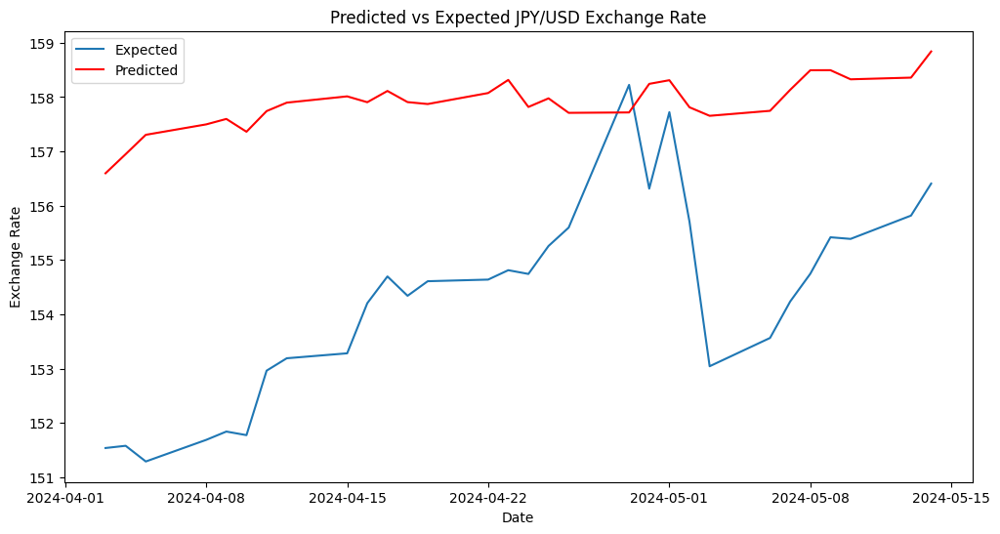

In [ ]:
# Prediction
plt.figure(figsize=(12, 6))
plt.plot(Test.index, Test, label='Expected')
plt.plot(Test.index, predictions_holt_winters, color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.title('Predicted vs Expected JPY/USD Exchange Rate')
plt.legend()
plt.show()

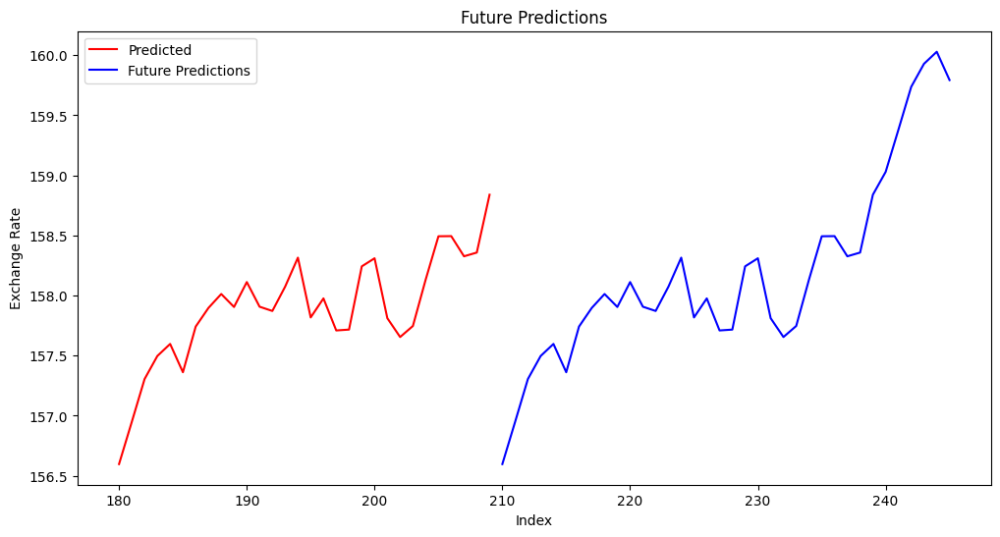

In [ ]:
# Future prediction
plt.figure(figsize=(12, 6))
plt.plot(range(len(Train), len(Train)+len(predictions_holt_winters)), predictions_holt_winters, color='red', label='Predicted')
plt.plot(range(len(Train)+len(predictions_holt_winters), len(Train)+len(predictions_holt_winters)+len(future_predictions_holt_winters)), future_predictions_holt_winters, color='blue', label='Future Predictions')
plt.xlabel('Index')
plt.ylabel('Exchange Rate')
plt.title('Future Predictions')
plt.legend()
plt.show()

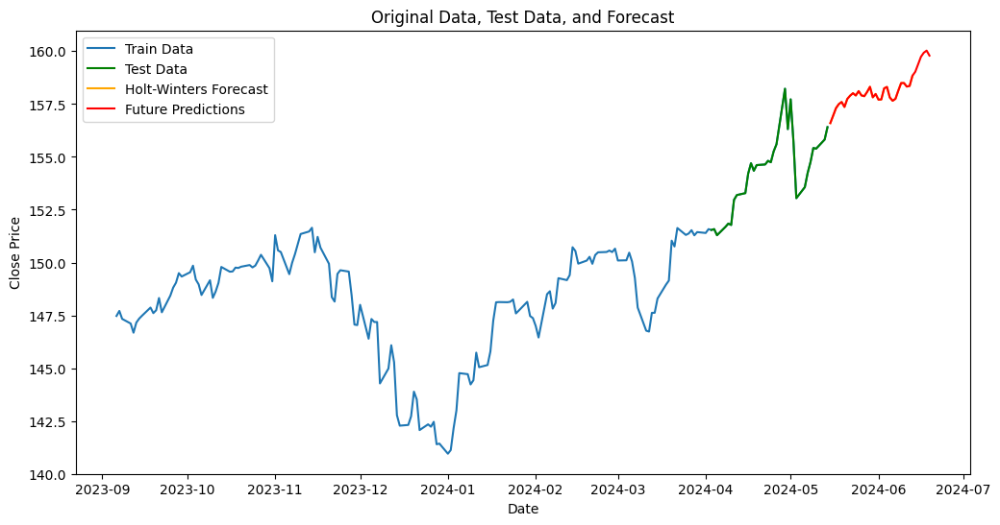

In [ ]:
# Combine original data, test set, and forecast data
all_data = pd.concat([df['Close'][-6*30:], predictions_holt_winters, future_predictions_holt_winters])

# Plot original data, test data, and future forecasts
plt.figure(figsize=(12, 6))
plt.plot(df.index[-6*30:], df['Close'][-6*30:], label='Train Data')  # Training data from the last six months
plt.plot(Test.index, Test, color='green', label='Test Data')  # Test data from the last month
plt.plot(predictions_holt_winters.index, predictions_holt_winters, color='orange', label='Holt-Winters Forecast')  # Forecast on the test set
plt.plot(future_predictions_holt_winters.index, future_predictions_holt_winters, color='red', label='Future Predictions')  # Future predictions
plt.legend()
plt.title('Original Data, Test Data, and Forecast')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.show()

# LSTM model

## 1. Univariate LSTM Models:
1. Data Preparation.
2. Vanilla LSTM.
3. Stacked LSTM.
4. Bidirectional LSTM.
5. CNN-LSTM.
6. ConvLSTM.

Data Preprocessing
- Normalize the 'Close' column exchange rate data to the [0, 1] range.
- Split the normalized data into training and test sets.
- Create time window data so that the model can predict future exchange rates - - based on past values.


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_squared_error

scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[['Close']])

train = df_scaled[:int(len(df) * 0.8)]
test = df_scaled[int(len(df) * 0.8):]

def create_dataset(dataset, look_back=60):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 60
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

### Vanilla LSTM

- Creating Time Window Data
- Define a function `create_dataset` that transforms time series data into a supervised learning problem.
- The generated features `X` and labels `y` are used to train and test the LSTM model.

Build and Train LSTM Model
- Build the LSTM model using Keras Sequential API.
- The model includes one LSTM layer and one dense layer.
- Train the model using training data with a batch size of 32 for 20 epochs.


In [ ]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(look_back, 1)))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 40901 (159.77 KB)
Trainable params: 40901 (159.77 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 11s 49ms/step - loss: 0.0094 - val_loss: 4.8988e-04
Epoch 2/10
177/177 [==============================] - 8s 47ms/step - loss: 3.4703e-04 - val_loss: 4.1936e-04
Epoch 3/10
177/177 [==============================] - 8s 45ms/step - loss: 3.0928e-04 - val_loss: 2.6741e-04
Epoch 4/10
177/177 [==============================] - 8s 46ms/step - loss: 3.0624e-04 - va

Prediction and Visualization
- Use the trained LSTM model to predict on the test data.
- Inverse normalize the predicted results and actual test labels to recover the original exchange rate values.
- Plot the predicted and actual values for a visual comparison.


43/43 [==============================] - 1s 12ms/step


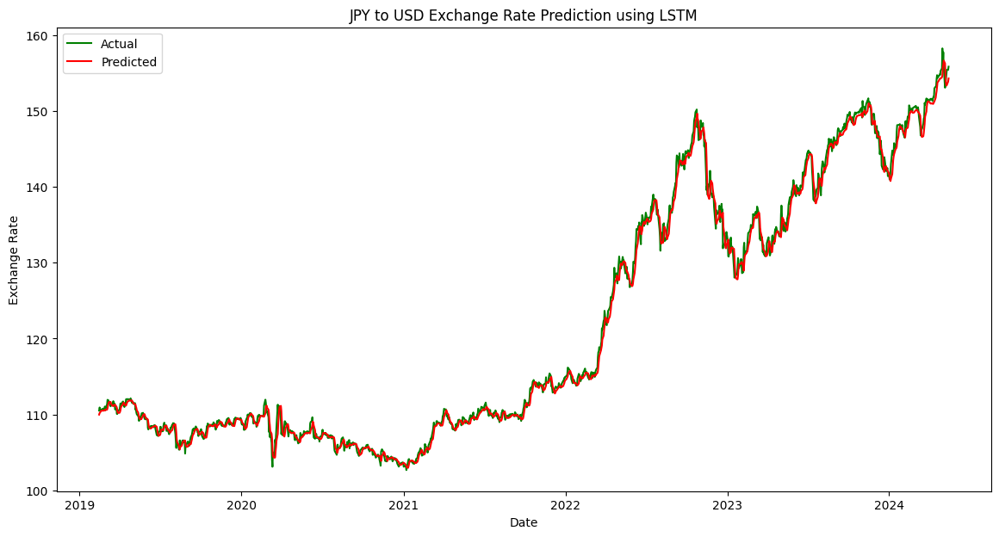

Mean Squared Error: 0.8326566911088942


In [ ]:
# Predictions and visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# Ensure the actual values and predicted values arrays are the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('JPY to USD Exchange Rate Prediction using LSTM')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.legend()
plt.show()

# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
print(f'Mean Squared Error: {mse}')

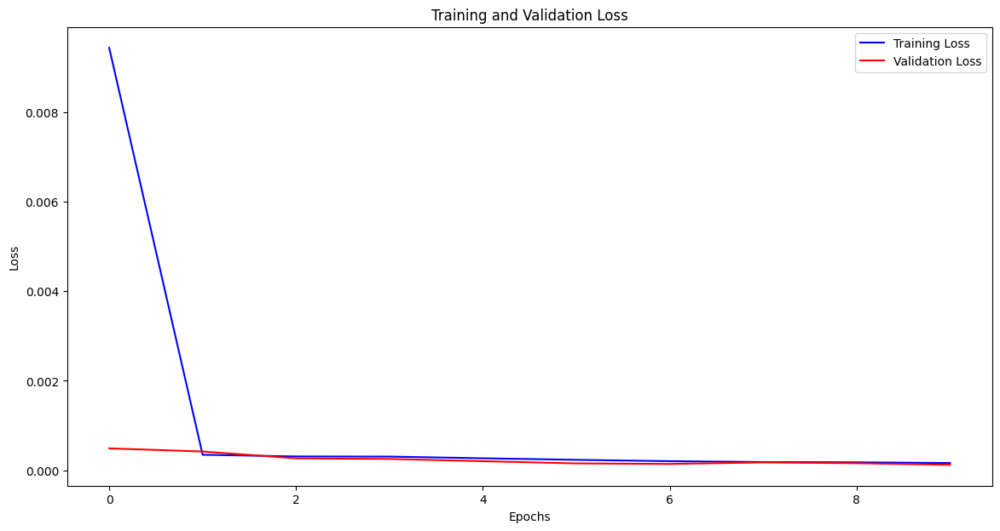

In [ ]:
# Plot loss
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')


Mean Squared Error (MSE): 0.8327
Root Mean Squared Error (RMSE): 0.9125
Mean Absolute Error (MAE): 0.6540
R² Score: 0.9969


In [ ]:
print(f'Number of samples in training data: {X_train.shape[0]}')
print(f'Number of samples in test data: {X_test.shape[0]}')

Number of samples in training data: 5652
Number of samples in test data: 1368


### Stacked LSTM

In [ ]:
# Build and train the Stacked LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(look_back, 1)))
model.add(LSTM(50, activation='relu', return_sequences=True))
model.add(LSTM(25, activation='relu'))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 60, 100)           40800     
                                                                 
 lstm_2 (LSTM)               (None, 60, 50)            30200     
                                                                 
 lstm_3 (LSTM)               (None, 25)                7600      
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
                                                                 
Total params: 78626 (307.13 KB)
Trainable params: 78626 (307.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 34s 170ms/step - loss: 0.0123 - val_loss: 7.5651e-04
Epoch 2/10
177/177 [=====================

In [ ]:
# Predictions and visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

43/43 [==============================] - 1s 27ms/step


In [ ]:
# Ensure the actual values and predicted values arrays are the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

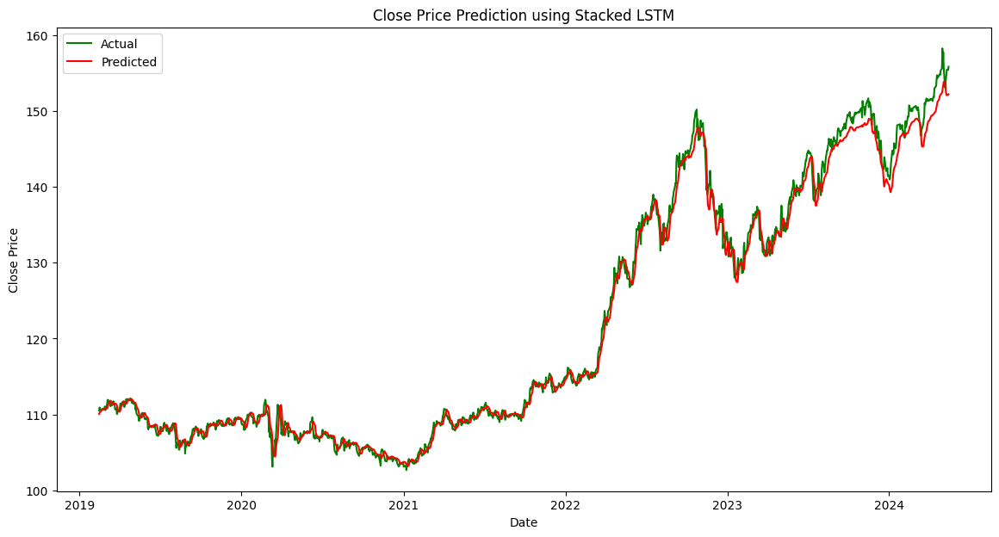

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('Close Price Prediction using Stacked LSTM')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

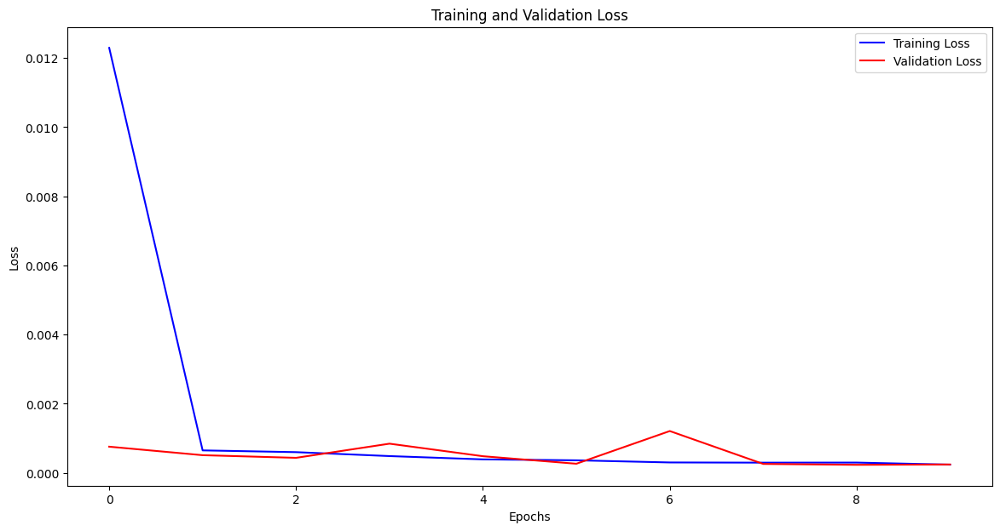

In [ ]:
# Plot the loss curves
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 1.6447
Root Mean Squared Error (RMSE): 1.2825
Mean Absolute Error (MAE): 0.9085
R² Score: 0.9940


### Bidirectional LSTM

In [ ]:
from tensorflow.keras.layers import LSTM, Dense, Bidirectional

# Build and train the Bidirectional LSTM model
model = Sequential()
model.add(Bidirectional(LSTM(100, activation='relu'), input_shape=(look_back, 1)))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 200)               81600     
 al)                                                             
                                                                 
 dense_2 (Dense)             (None, 1)                 201       
                                                                 
Total params: 81801 (319.54 KB)
Trainable params: 81801 (319.54 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 18s 87ms/step - loss: 0.0063 - val_loss: 4.7487e-04
Epoch 2/10
177/177 [==============================] - 15s 86ms/step - loss: 3.8029e-04 - val_loss: 2.4529e-04
Epoch 3/10
177/177 [==============================] - 16s 89ms/step - loss: 3.1057e-04 - val_loss: 2.8287e-04
Epoch 4/10
177/177 [

In [ ]:
# Predictions and visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

43/43 [==============================] - 1s 18ms/step


In [ ]:
# Ensure the actual values and predicted values arrays are the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

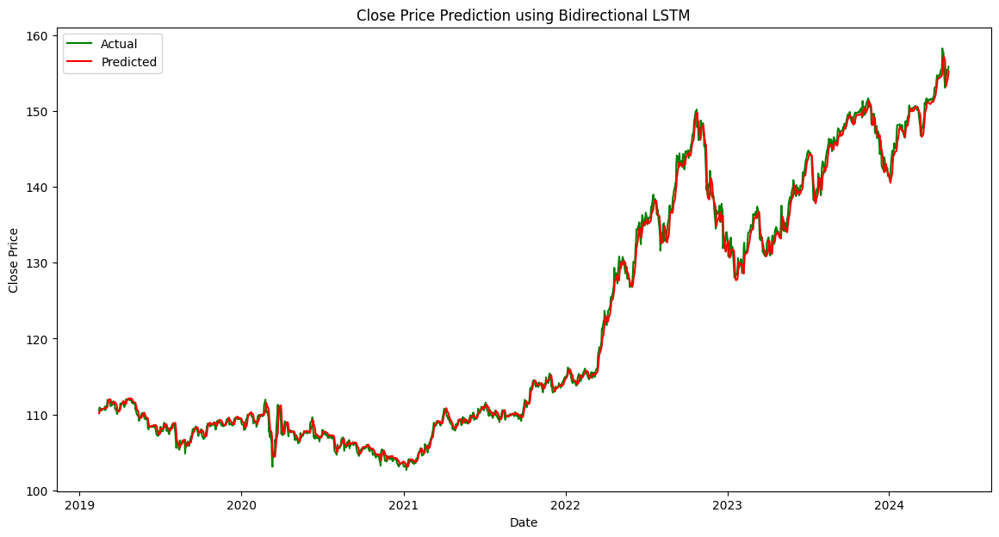

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('Close Price Prediction using Bidirectional LSTM')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

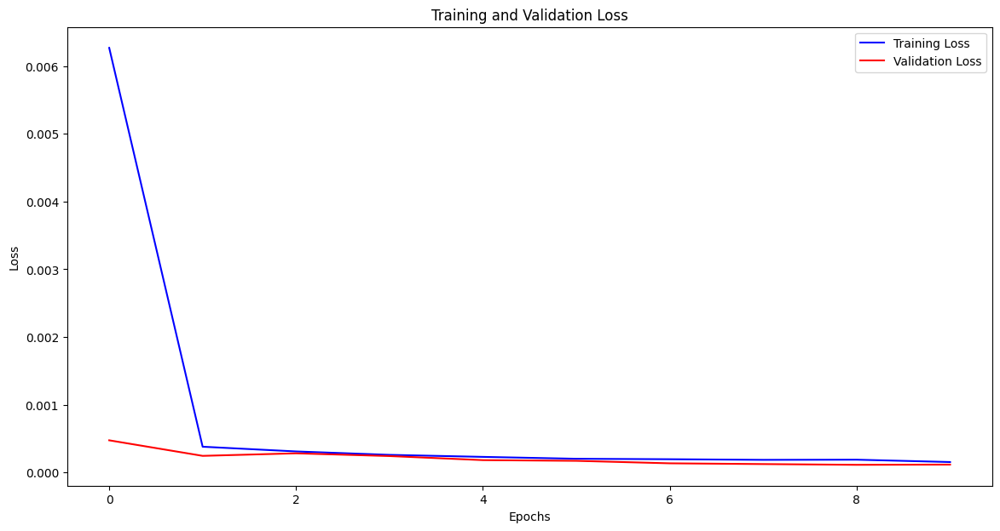

In [ ]:
# Plot the loss curves
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 0.7924
Root Mean Squared Error (RMSE): 0.8902
Mean Absolute Error (MAE): 0.6351
R² Score: 0.9971


### CNN-LSTM

In [ ]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, LSTM, Dense, Dropout, Reshape

# Build and train the CNN-LSTM model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(look_back, 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Reshape((int((look_back - 3 + 1) / 2), 64)))  # Reshape to fit LSTM input
model.add(LSTM(100, activation='relu'))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 58, 64)            256       
                                                                 
 max_pooling1d (MaxPooling1  (None, 29, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 1856)              0         
                                                                 
 reshape (Reshape)           (None, 29, 64)            0         
                                                                 
 lstm_5 (LSTM)               (None, 100)               66000     
                                                                 
 dense_3 (Dense)             (None, 1)                 101       
                                                      

In [ ]:
# Predictions and visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# Ensure the actual values and predicted values arrays are the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

43/43 [==============================] - 0s 5ms/step


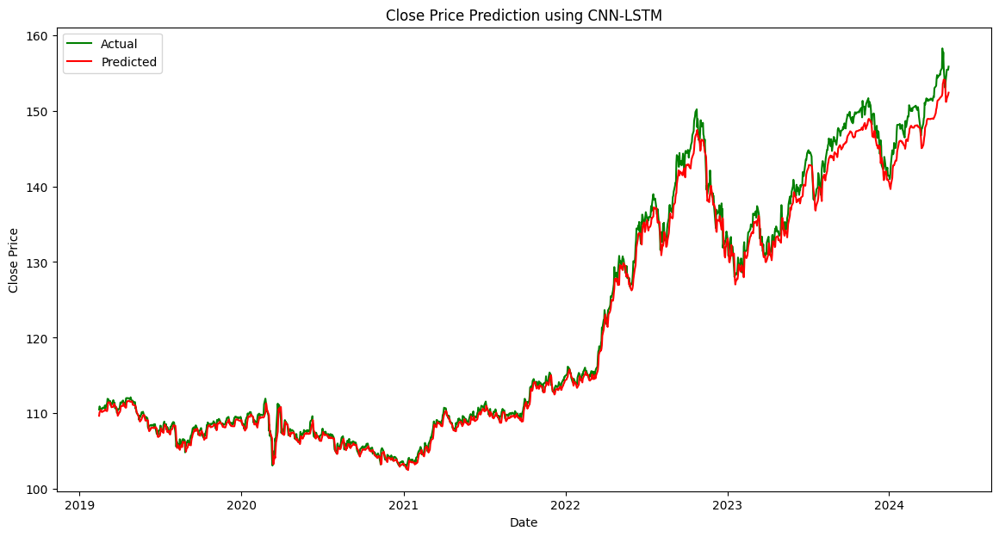

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('Close Price Prediction using CNN-LSTM')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

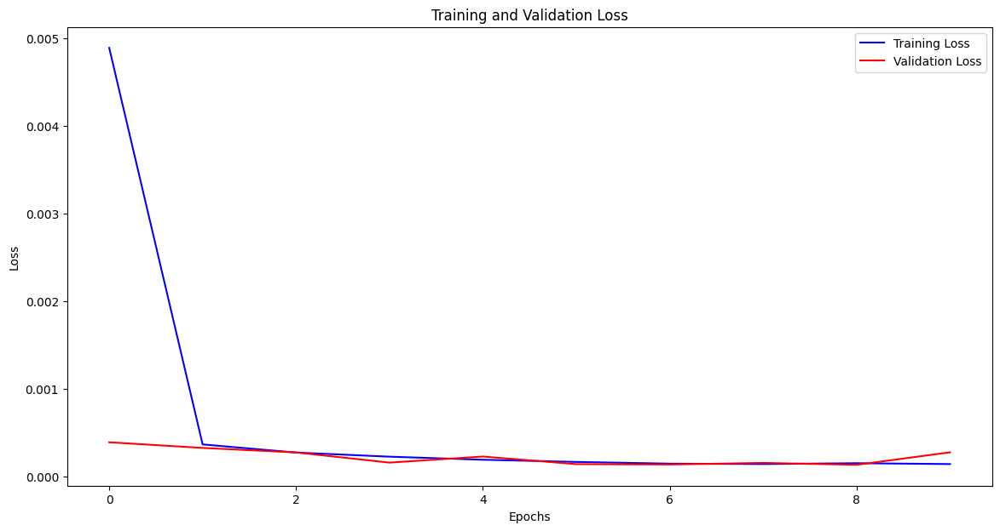

In [ ]:
# Plot the loss curves
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 1.8724
Root Mean Squared Error (RMSE): 1.3684
Mean Absolute Error (MAE): 1.0009
R² Score: 0.9931


### ConvLSTM

In [ ]:
from tensorflow.keras.layers import ConvLSTM2D, Flatten, Dense

# Reshape to ConvLSTM interpreted as [samples, time steps, 1, rows, columns]
X_train = X_train.reshape((X_train.shape[0], look_back, 1, 1, 1))
X_test = X_test.reshape((X_test.shape[0], look_back, 1, 1, 1))

# Build and train the ConvLSTM model
model = Sequential()
model.add(ConvLSTM2D(filters=64, kernel_size=(1, 1), activation='relu', input_shape=(look_back, 1, 1, 1)))
model.add(Flatten())
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 1, 64)          16896     
                                                                 
 flatten_1 (Flatten)         (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 16961 (66.25 KB)
Trainable params: 16961 (66.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 28s 136ms/step - loss: 0.0176 - val_loss: 0.0021
Epoch 2/10
177/177 [==============================] - 23s 129ms/step - loss: 4.6960e-04 - val_loss: 9.2581e-04
Epoch 3/10
177/177 [==============================] - 24s 133ms/step

In [ ]:
# Predictions and visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

# Ensure the actual values and predicted values arrays are the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

43/43 [==============================] - 1s 26ms/step


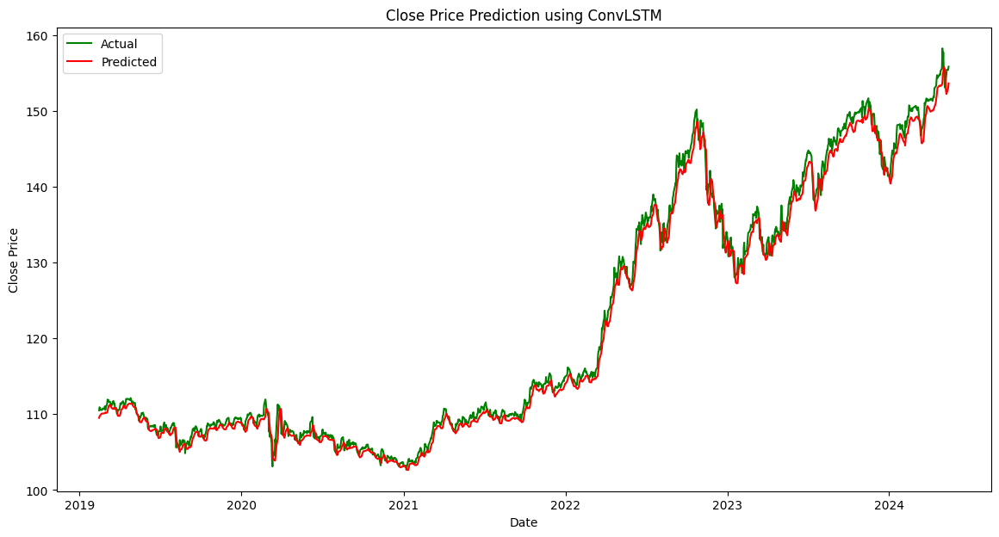

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('Close Price Prediction using ConvLSTM')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

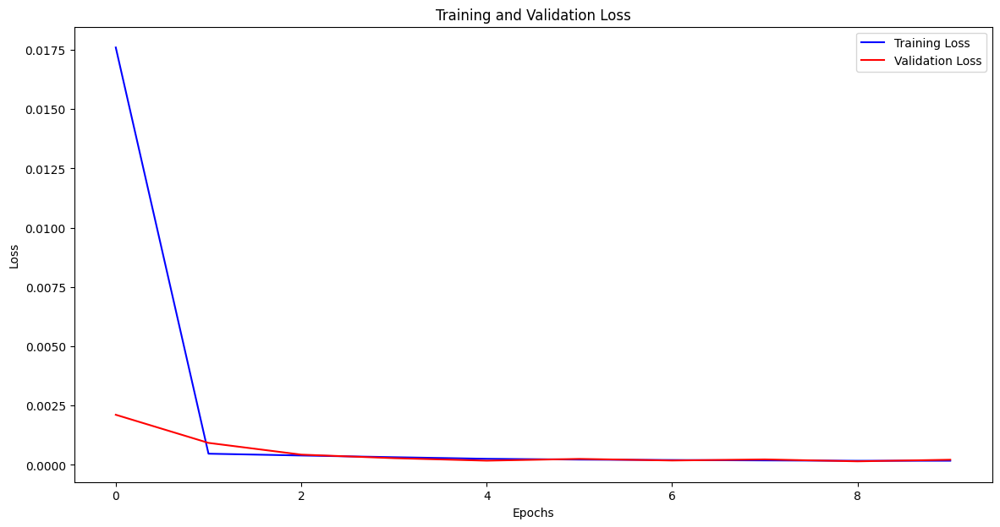

In [ ]:
# Plot the loss curves
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 1.4640
Root Mean Squared Error (RMSE): 1.2100
Mean Absolute Error (MAE): 0.9570
R² Score: 0.9946


## 2. Multivariate LSTM Models

### Multiple Input Series

In [ ]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[['Close', 'Open', 'High', 'Low']])

train = df_scaled[:int(len(df) * 0.8)]
test = df_scaled[int(len(df) * 0.8):]

def create_dataset(dataset, look_back=60):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), :]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 60
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], df_scaled.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], df_scaled.shape[1]))


In [ ]:
# Building and Training the LSTM Model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(look_back, df_scaled.shape[1])))
model.add(Dropout(0.2))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 100)               42000     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                                 
Total params: 42101 (164.46 KB)
Trainable params: 42101 (164.46 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 10s 49ms/step - loss: 0.0084 - val_loss: 4.5294e-04
Epoch 2/10
177/177 [==============================] - 9s 48ms/step - loss: 0.0021 - val_loss: 2.1940e-04
Epoch 3/10
177/177 [==============================] - 9s 48ms/step - 

43/43 [==============================] - 1s 9ms/step


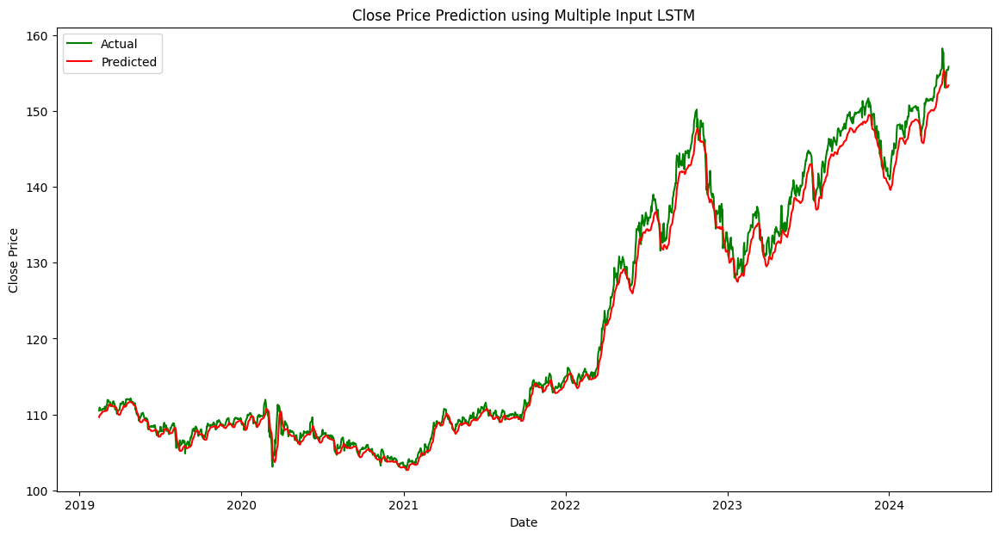

In [ ]:
# Prediction and Visualization
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(np.concatenate([y_pred, np.zeros((len(y_pred), df_scaled.shape[1] - 1))], axis=1))[:, 0]
y_test_inv = scaler.inverse_transform(np.concatenate([y_test.reshape(-1, 1), np.zeros((len(y_test), df_scaled.shape[1] - 1))], axis=1))[:, 0]

# Ensure actual and predicted arrays have the same length
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('Close Price Prediction using Multiple Input LSTM')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

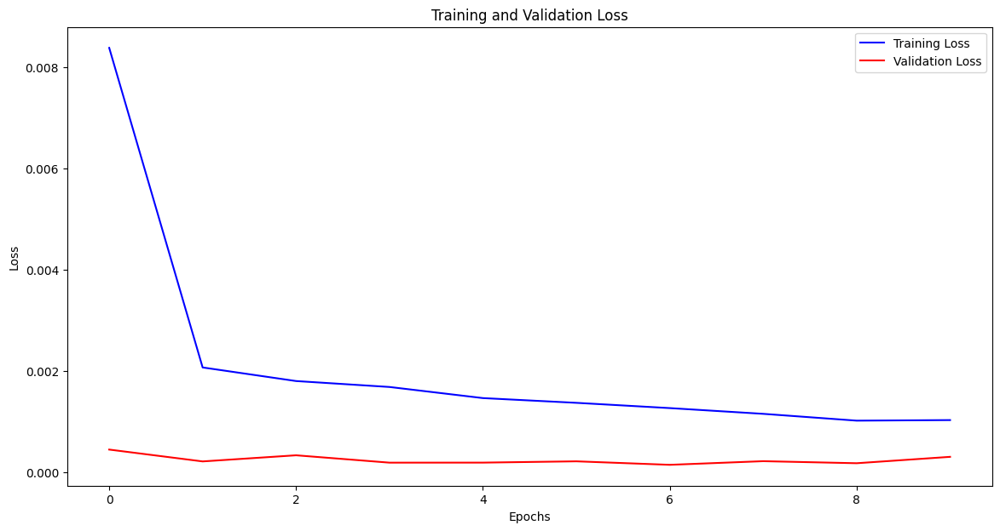

In [ ]:
# Plotting Loss Curves
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate Error Metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 2.1070
Root Mean Squared Error (RMSE): 1.4515
Mean Absolute Error (MAE): 1.1027
R² Score: 0.9923


### Multiple Parallel Series

In [ ]:
# Set file paths
us_bond_path = '/content/drive/My Drive/United States Bond YieldData.csv'
jp_bond_path = '/content/drive/My Drive/Japan Bond Yield Historical Data.csv'
jpy_usd_path = '/content/drive/My Drive/JPY_Japanese-Yen.csv'

# Load data
df_us_bond = pd.read_csv(us_bond_path)
df_jp_bond = pd.read_csv(jp_bond_path)
df_jpy_usd = pd.read_csv(jpy_usd_path)

# Clean column names
df_us_bond.rename(columns=lambda x: x.strip(), inplace=True)
df_jp_bond.rename(columns=lambda x: x.strip(), inplace=True)
df_jpy_usd.rename(columns=lambda x: x.strip(), inplace=True)

# Print column names to verify cleaning
print("US Bond Data Columns:", df_us_bond.columns)
print("Japan Bond Data Columns:", df_jp_bond.columns)
print("JPY/USD Data Columns:", df_jpy_usd.columns)

US Bond Data Columns: Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change %'], dtype='object')
Japan Bond Data Columns: Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change %'], dtype='object')
JPY/USD Data Columns: Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')


In [ ]:
# Check and rename 'Date' column
df_us_bond.columns = df_us_bond.columns.str.replace('﻿Date', 'Date')
df_jp_bond.columns = df_jp_bond.columns.str.replace('﻿Date', 'Date')

# Check column names again to verify renaming
print("US Bond Data Columns:", df_us_bond.columns)
print("Japan Bond Data Columns:", df_jp_bond.columns)

US Bond Data Columns: Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change %'], dtype='object')
Japan Bond Data Columns: Index(['Date', 'Price', 'Open', 'High', 'Low', 'Change %'], dtype='object')


In [ ]:
# Convert date columns to datetime
df_us_bond['Date'] = pd.to_datetime(df_us_bond['Date'])
df_jp_bond['Date'] = pd.to_datetime(df_jp_bond['Date'])
df_jpy_usd['Date'] = pd.to_datetime(df_jpy_usd['Date'])

In [ ]:
# Set start date as July 26, 2006
start_date = '2006-07-26'

In [ ]:
# Filter data
df_us_bond = df_us_bond[df_us_bond['Date'] >= start_date]
df_jp_bond = df_jp_bond[df_jp_bond['Date'] >= start_date]
df_jpy_usd = df_jpy_usd[df_jpy_usd['Date'] >= start_date]

In [ ]:
# Keep only the date and closing price columns
df_us_bond = df_us_bond[['Date', 'Price']].rename(columns={'Price': 'US_Bond_Yield'})
df_jp_bond = df_jp_bond[['Date', 'Price']].rename(columns={'Price': 'Japan_Bond_Yield'})
df_jpy_usd = df_jpy_usd[['Date', 'Close']].rename(columns={'Close': 'JPY_USD'})

# Merge data
df_combined = df_jpy_usd.merge(df_us_bond, on='Date').merge(df_jp_bond, on='Date')

# Calculate the interest rate differential between Yen and Dollar
df_combined['Rate_Differential'] = df_combined['US_Bond_Yield'] - df_combined['Japan_Bond_Yield']

# Handle missing values (if any)
df_combined = df_combined.dropna()

print(df_combined.head())

        Date     JPY_USD  US_Bond_Yield  Japan_Bond_Yield  Rate_Differential
0 2006-07-26  116.349998          5.038             2.520              2.518
1 2006-07-27  115.750000          5.040             2.528              2.512
2 2006-07-28  114.739998          4.994             2.568              2.426
3 2006-07-31  114.510002          4.988             2.588              2.400
4 2006-08-01  114.559998          4.981             2.568              2.413


In [ ]:
# Normalize the data
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_combined[['JPY_USD', 'Rate_Differential']])

# Split the data into training and test sets
train_size = int(len(df_scaled) * 0.8)
train, test = df_scaled[:train_size], df_scaled[train_size:]

# Create the dataset
def create_dataset(dataset, look_back=60):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i:(i + look_back), :]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])  # Target is the JPY_USD column
    return np.array(dataX), np.array(dataY)

look_back = 60
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

In [ ]:
# Check the shape of the data
print(f'X_train shape: {X_train.shape}')
print(f'X_test shape: {X_test.shape}')

X_train shape: (3435, 60, 2)
X_test shape: (814, 60, 2)


In [ ]:
# Build the LSTM model
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(look_back, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
108/108 [==============================] - 7s 48ms/step - loss: 0.0128 - val_loss: 5.7480e-04
Epoch 2/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0015 - val_loss: 4.2610e-04
Epoch 3/10
108/108 [==============================] - 5s 45ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 4/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0012 - val_loss: 4.4760e-04
Epoch 5/10
108/108 [==============================] - 5s 45ms/step - loss: 0.0011 - val_loss: 6.2981e-04
Epoch 6/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0010 - val_loss: 5.4291e-04
Epoch 7/10
108/108 [==============================] - 5s 48ms/step - loss: 9.4900e-04 - val_loss: 3.7511e-04
Epoch 8/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0010 - val_loss: 4.2510e-04
Epoch 9/10
108/108 [==============================] - 5s 46ms/step - loss: 8.6622e-04 - val_loss: 3.5643e-04
Epoch 10/10
108/108 [==============================

In [ ]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 100)               41200     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_6 (Dense)             (None, 1)                 101       
                                                                 
Total params: 41301 (161.33 KB)
Trainable params: 41301 (161.33 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Predict
y_pred = model.predict(X_test)

# Inverse transform the predictions
y_pred_inv = scaler.inverse_transform(
    np.concatenate([y_pred, np.zeros((len(y_pred), X_train.shape[2] - 1))], axis=1))[:, 0]
y_test_inv = scaler.inverse_transform(
    np.concatenate([y_test.reshape(-1, 1), np.zeros((len(y_test), X_train.shape[2] - 1))], axis=1))[:, 0]

print(f'First 5 Predictions: {y_pred_inv[:5]}')
print(f'First 5 Actual Values: {y_test_inv[:5]}')

26/26 [==============================] - 0s 9ms/step
First 5 Predictions: [105.66457418 105.77233002 105.91001709 106.12417185 106.36865852]
First 5 Actual Values: [106.5029984 106.8509979 106.7580032 107.0579987 107.9550018]


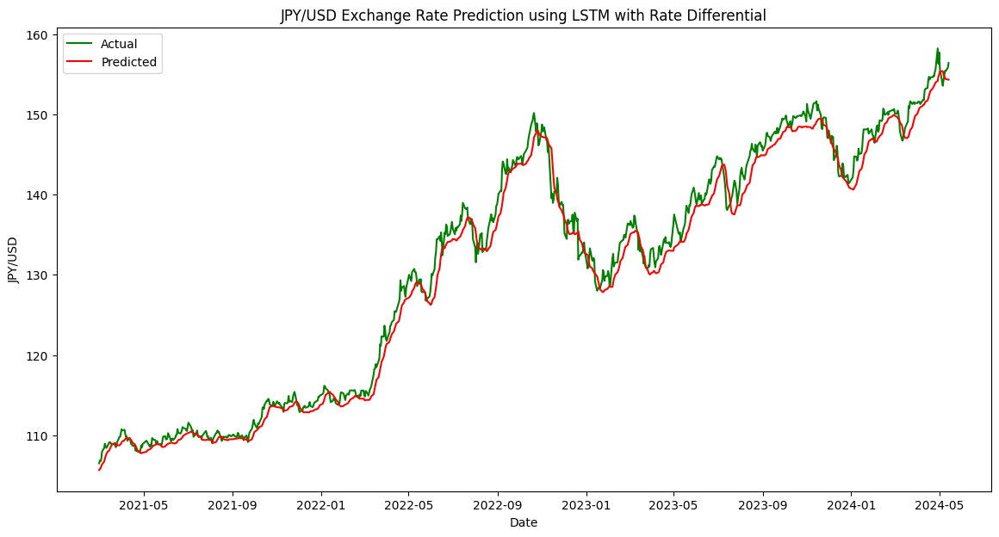

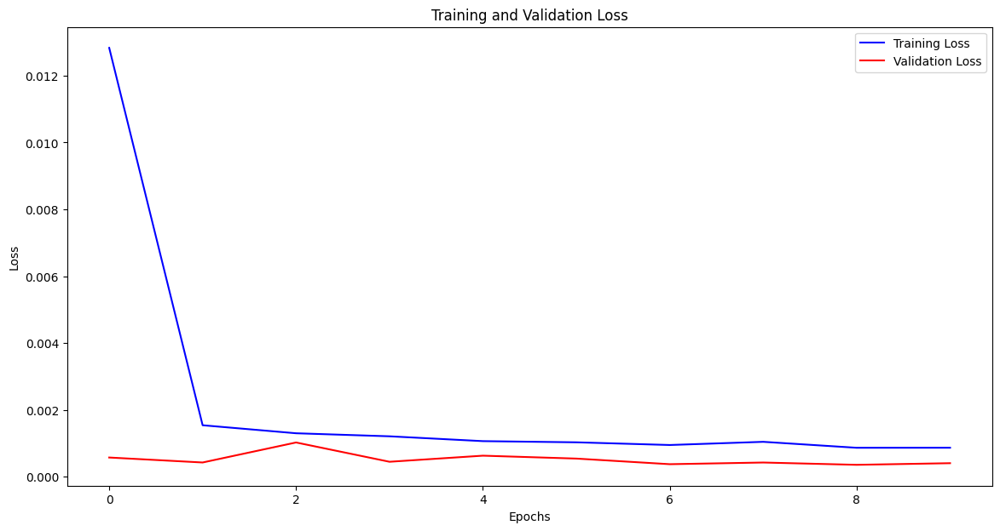

In [ ]:
# Ensure the actual and predicted arrays have the same length
df_index_test = df_combined['Date'].iloc[train_size + look_back:]

plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('JPY/USD Exchange Rate Prediction using LSTM with Rate Differential')
plt.xlabel('Date')
plt.ylabel('JPY/USD')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate error metrics
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')

Mean Squared Error (MSE): 2.7560
Root Mean Squared Error (RMSE): 1.6601
Mean Absolute Error (MAE): 1.3255
R² Score: 0.9880


## Multi-step LSTM Models


### Vector Output Model

In [ ]:
data = df_combined[['Date', 'JPY_USD']].copy()

scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data[['JPY_USD']])

def create_dataset(dataset, look_back=60, forecast_horizon=10):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - forecast_horizon):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[(i + look_back):(i + look_back + forecast_horizon), 0])
    return np.array(dataX), np.array(dataY)

look_back = 60
forecast_horizon = 10

X, y = create_dataset(data_scaled, look_back, forecast_horizon)

train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

X_train = X_train.reshape((X_train.shape[0], look_back, 1))
X_test = X_test.reshape((X_test.shape[0], look_back, 1))

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')


X_train shape: (3439, 60, 1)
y_train shape: (3439, 10)
X_test shape: (860, 60, 1)
y_test shape: (860, 10)


In [ ]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(look_back, 1)))
model.add(Dropout(0.2))
model.add(Dense(forecast_horizon))

model.compile(optimizer='adam', loss='mse')

history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

model.summary()

Epoch 1/10
108/108 [==============================] - 7s 53ms/step - loss: 0.0239 - val_loss: 0.0501
Epoch 2/10
108/108 [==============================] - 5s 45ms/step - loss: 0.0036 - val_loss: 0.0028
Epoch 3/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 4/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 5/10
108/108 [==============================] - 5s 45ms/step - loss: 0.0020 - val_loss: 0.0020
Epoch 6/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 7/10
108/108 [==============================] - 5s 45ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 8/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 9/10
108/108 [==============================] - 5s 49ms/step - loss: 0.0013 - val_loss: 8.5847e-04
Epoch 10/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0013 - va

In [ ]:
y_pred = model.predict(X_test)

y_pred_inv = scaler.inverse_transform(np.concatenate(
    [y_pred, np.zeros((len(y_pred), data_scaled.shape[1] - 1))], axis=1))[:, 0:forecast_horizon]
y_test_inv = scaler.inverse_transform(np.concatenate(
    [y_test, np.zeros((len(y_test), data_scaled.shape[1] - 1))], axis=1))[:, 0:forecast_horizon]

print(f'First 5 Predictions: {y_pred_inv[:5]}')
print(f'First 5 Actual Values: {y_test_inv[:5]}')


27/27 [==============================] - 0s 9ms/step
First 5 Predictions: [[103.83805667 103.78430289 103.84334675 104.11229757 104.04766373
  104.00868136 104.10651831 104.15585468 103.97657707 104.00730722]
 [103.80633095 103.75283528 103.81070657 104.0802277  104.01678855
  103.97573882 104.07575621 104.12557931 103.9480962  103.97507019]
 [103.79022473 103.73696996 103.7953329  104.06377979 104.00041684
  103.96025453 104.05946316 104.10876512 103.93036755 103.95935974]
 [103.7924322  103.73902257 103.79858757 104.06572423 104.00134851
  103.9637919  104.06021783 104.1085193  103.92751357 103.96214735]
 [103.78922915 103.73538933 103.795033   104.06220899 103.99748665
  103.96034548 104.05592825 104.10407976 103.92250127 103.95844528]]
First 5 Actual Values: [[103.9980011 104.1350021 104.2720032 104.1819992 103.939003  104.0100021
  103.6340027 103.4749985 103.1309967 103.4570007]
 [104.1350021 104.2720032 104.1819992 103.939003  104.0100021 103.6340027
  103.4749985 103.1309967 10

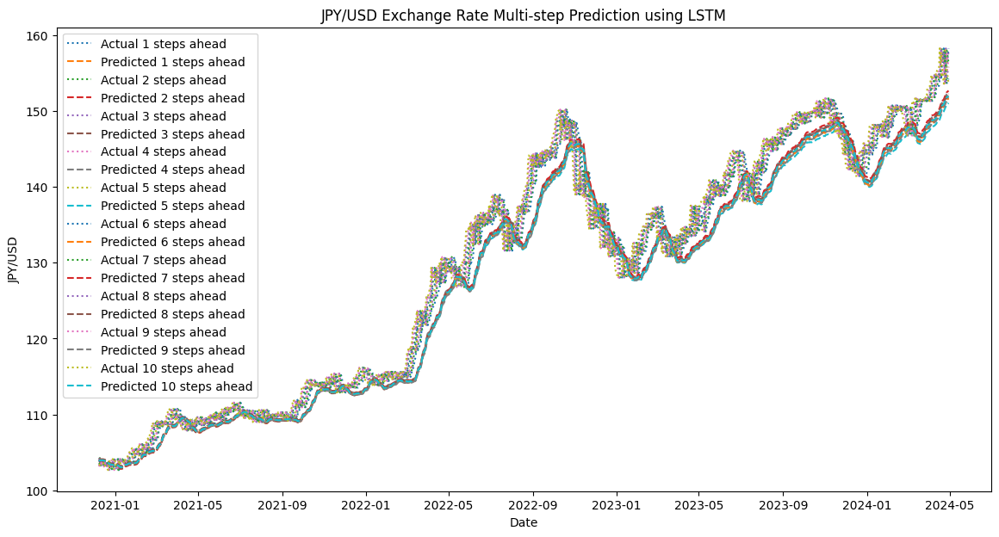

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 7))
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i], label=f'Actual {i + 1} steps ahead', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i], label=f'Predicted {i + 1} steps ahead', linestyle='dashed')
plt.title('JPY/USD Exchange Rate Multi-step Prediction using LSTM')
plt.xlabel('Date')
plt.ylabel('JPY/USD')
plt.legend()
plt.show()


Plotting Prediction Results

- In the plot, the actual values and predicted values for each prediction range (1 to 10 steps) are shown. Each dashed line represents the predicted values, and each dotted line represents the actual values.

Prediction Performance
Short-term Prediction (1 to 3 steps):

- In the short-term prediction, the difference between predicted values and actual values is small, indicating good prediction performance.
The curves almost overlap, showing that the model accurately captures the exchange rate changes in the short term.
Mid-term Prediction (4 to 6 steps):

- In the mid-term prediction, there begins to be a slight deviation between predicted values and actual values.
Although the overall trend remains consistent, there are some errors in the details, indicating that the prediction accuracy starts to decline.
Long-term Prediction (7 to 10 steps):

- In the long-term prediction, the deviation between predicted values and actual values becomes more apparent.
While the overall trend still aligns, the prediction performance decreases in some regions with significant fluctuations.

Model Performance
- Overall Trend Capture: The model performs well in capturing the overall trend, with predicted values generally following the changes in actual values. This indicates that the LSTM model has a strong ability to learn the long-term trends in the time series.
- Detail Errors: As the number of prediction steps increases, the errors gradually accumulate. This is due to the error accumulation effect in time series prediction, where errors in each step affect subsequent predictions.
- Handling Volatility: The model's performance is not as good in regions with significant volatility compared to more stable regions, indicating limited ability to handle abnormal fluctuations.

Improvement Suggestions
- Increase Training Data: More training data can help the model better learn the patterns in the time series and improve prediction accuracy.
Model Optimization: Trying different neural network structures or other time series prediction models, such as GRU or Transformer, can enhance prediction performance.
- Hyperparameter Tuning: Further improving the model's performance can be achieved by tuning hyperparameters (e.g., number of LSTM units, learning rate, look-back window).
- Feature Engineering: Introducing more features, such as macroeconomic indicators and market sentiment, can help the model understand and predict exchange rate changes more comprehensively.

Conclusion
- The LSTM model, as shown in this plot, performs well in predicting JPY/USD exchange rates, capturing short-term and mid-term changes accurately but showing some errors in long-term predictions. Increasing training data, optimizing the model, and tuning hyperparameters can further improve the model's prediction performance.

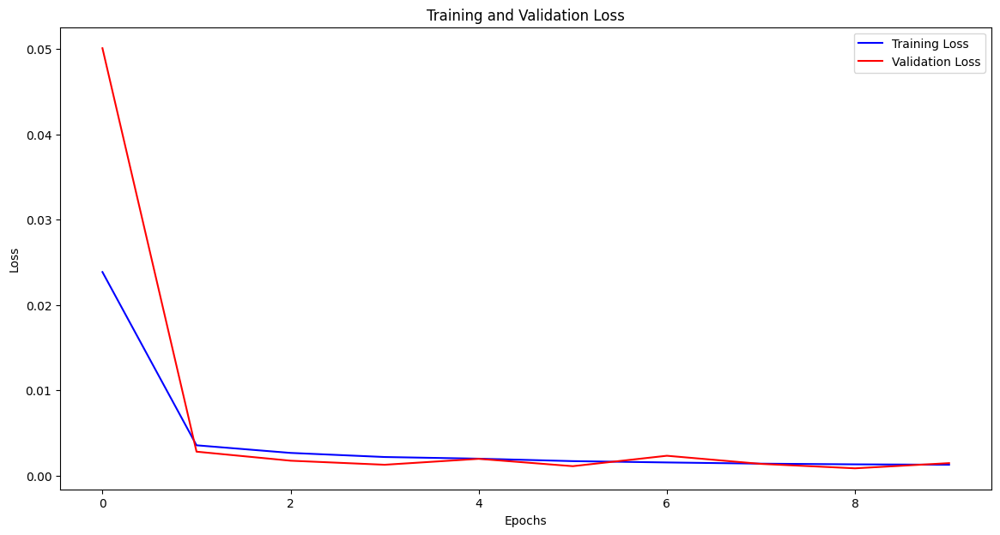

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test_inv.flatten(), y_pred_inv.flatten())
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv.flatten(), y_pred_inv.flatten())
r2 = r2_score(y_test_inv.flatten(), y_pred_inv.flatten())

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')


Mean Squared Error (MSE): 9.9820
Root Mean Squared Error (RMSE): 3.1594
Mean Absolute Error (MAE): 2.5148
R² Score: 0.9606


### Encoder-Decoder Model

In [ ]:
from tensorflow.keras.layers import Input, LSTM, Dense, RepeatVector, TimeDistributed
from tensorflow.keras.models import Model

X_train = X_train.reshape((X_train.shape[0], look_back, 1))
X_test = X_test.reshape((X_test.shape[0], look_back, 1))

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')


X_train shape: (3439, 60, 1)
y_train shape: (3439, 10)
X_test shape: (860, 60, 1)
y_test shape: (860, 10)


In [ ]:
encoder_inputs = Input(shape=(look_back, 1))
encoder = LSTM(100, activation='relu')(encoder_inputs)
encoder_output = RepeatVector(forecast_horizon)(encoder)

decoder = LSTM(100, activation='relu', return_sequences=True)(encoder_output)
decoder_output = TimeDistributed(Dense(1))(decoder)

model = Model(inputs=encoder_inputs, outputs=decoder_output)
model.compile(optimizer='adam', loss='mse')

history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))


model.summary()

Epoch 1/10
108/108 [==============================] - 9s 64ms/step - loss: 0.0158 - val_loss: 0.1642
Epoch 2/10
108/108 [==============================] - 6s 60ms/step - loss: 7.1527e-04 - val_loss: 0.0062
Epoch 3/10
108/108 [==============================] - 6s 58ms/step - loss: 5.6680e-04 - val_loss: 0.0031
Epoch 4/10
108/108 [==============================] - 6s 59ms/step - loss: 5.1797e-04 - val_loss: 0.0030
Epoch 5/10
108/108 [==============================] - 6s 59ms/step - loss: 4.8798e-04 - val_loss: 0.0025
Epoch 6/10
108/108 [==============================] - 6s 60ms/step - loss: 4.7610e-04 - val_loss: 0.0033
Epoch 7/10
108/108 [==============================] - 6s 59ms/step - loss: 4.9219e-04 - val_loss: 0.0016
Epoch 8/10
108/108 [==============================] - 7s 62ms/step - loss: 4.7322e-04 - val_loss: 0.0014
Epoch 9/10
108/108 [==============================] - 6s 59ms/step - loss: 4.8213e-04 - val_loss: 0.0016
Epoch 10/10
108/108 [==============================] - 6s 5

In [ ]:
y_pred = model.predict(X_test)

y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1)).reshape(y_pred.shape)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

print(f'First 5 Predictions:\n{y_pred_inv[:5]}')
print(f'First 5 Actual Values:\n{y_test_inv[:5]}')

27/27 [==============================] - 1s 10ms/step
First 5 Predictions:
[[[104.20918 ]
  [104.99579 ]
  [104.860596]
  [104.81175 ]
  [104.87707 ]
  [104.904945]
  [104.89399 ]
  [104.86331 ]
  [104.82901 ]
  [104.79987 ]]

 [[104.168625]
  [104.94951 ]
  [104.809105]
  [104.76223 ]
  [104.8281  ]
  [104.85612 ]
  [104.84507 ]
  [104.81428 ]
  [104.77984 ]
  [104.75056 ]]

 [[104.15778 ]
  [104.94244 ]
  [104.803215]
  [104.756035]
  [104.82181 ]
  [104.849846]
  [104.83888 ]
  [104.80816 ]
  [104.77379 ]
  [104.744545]]

 [[104.17323 ]
  [104.96811 ]
  [104.834564]
  [104.78551 ]
  [104.85078 ]
  [104.87876 ]
  [104.86803 ]
  [104.83753 ]
  [104.80335 ]
  [104.7743  ]]

 [[104.1727  ]
  [104.97111 ]
  [104.83909 ]
  [104.789635]
  [104.854836]
  [104.88286 ]
  [104.87223 ]
  [104.84182 ]
  [104.80772 ]
  [104.77871 ]]]
First 5 Actual Values:
[[103.9980011 104.1350021 104.2720032 104.1819992 103.939003  104.0100021
  103.6340027 103.4749985 103.1309967 103.4570007]
 [104.1350021 104

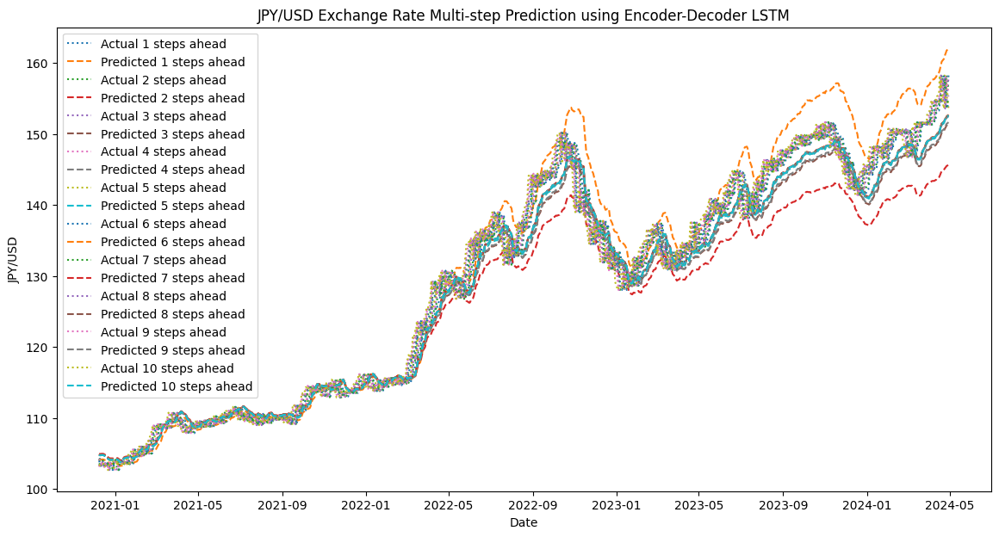

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 7))
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i], label=f'Actual {i + 1} steps ahead', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i], label=f'Predicted {i + 1} steps ahead', linestyle='dashed')
plt.title('JPY/USD Exchange Rate Multi-step Prediction using Encoder-Decoder LSTM')
plt.xlabel('Date')
plt.ylabel('JPY/USD')
plt.legend()
plt.show()


**Plotting Prediction Results**

In the plot, the actual values and predicted values for each prediction range (1 to 10 steps) are shown. Each dashed line represents the predicted values, and each dotted line represents the actual values.

Prediction Performance

**Short-term Prediction (1 to 3 steps):**
- In the short-term prediction, the difference between predicted values and actual values is small, indicating good prediction performance.
- The curves almost overlap, showing that the model accurately captures the exchange rate changes in the short term.

**Mid-term Prediction (4 to 6 steps):**
- In the mid-term prediction, there begins to be a slight deviation between predicted values and actual values.
- Although the overall trend remains consistent, there are some errors in the details, indicating that the prediction accuracy starts to decline.

**Long-term Prediction (7 to 10 steps):**
- In the long-term prediction, the deviation between predicted values and actual values becomes more apparent.
- While the overall trend still aligns, the prediction performance decreases in some regions with significant fluctuations.

Model Performance

- **Overall Trend Capture:** The model performs well in capturing the overall trend, with predicted values generally following the changes in actual values. This indicates that the LSTM model has a strong ability to learn the long-term trends in the time series.
- **Detail Errors:** As the number of prediction steps increases, the errors gradually accumulate. This is due to the error accumulation effect in time series prediction, where errors in each step affect subsequent predictions.
- **Handling Volatility:** The model's performance is not as good in regions with significant volatility compared to more stable regions, indicating limited ability to handle abnormal fluctuations.

Improvement Suggestions

1. **Increase Training Data:** More training data can help the model better learn the patterns in the time series and improve prediction accuracy.
2. **Model Optimization:** Trying different neural network structures or other time series prediction models, such as GRU or Transformer, can enhance prediction performance.
3. **Hyperparameter Tuning:** Further improving the model's performance can be achieved by tuning hyperparameters (e.g., number of LSTM units, learning rate, look-back window).
4. **Feature Engineering:** Introducing more features, such as macroeconomic indicators and market sentiment, can help the model understand and predict exchange rate changes more comprehensively.

Conclusion

The LSTM model, as shown in this plot, performs well in predicting JPY/USD exchange rates, capturing short-term and mid-term changes accurately but showing some errors in long-term predictions. Increasing training data, optimizing the model, and tuning hyperparameters can further improve the model's prediction performance.




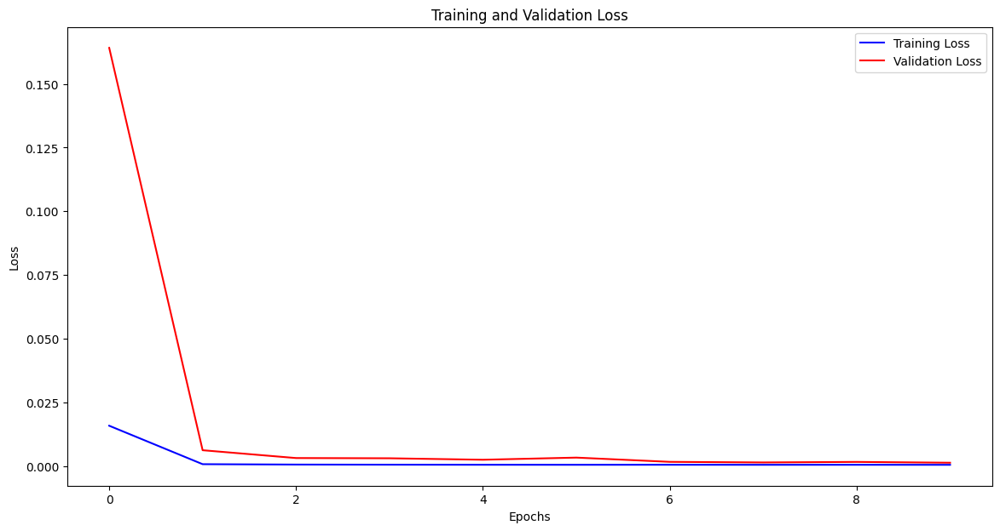

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
mse_list = []
rmse_list = []
mae_list = []
r2_list = []

for i in range(forecast_horizon):
    mse = mean_squared_error(y_test_inv[:, i], y_pred_inv[:, i])
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_inv[:, i], y_pred_inv[:, i])
    r2 = r2_score(y_test_inv[:, i], y_pred_inv[:, i])

    mse_list.append(mse)
    rmse_list.append(rmse)
    mae_list.append(mae)
    r2_list.append(r2)

print(f'Mean Squared Error (MSE): {mse_list}')
print(f'Root Mean Squared Error (RMSE): {rmse_list}')
print(f'Mean Absolute Error (MAE): {mae_list}')
print(f'R² Score: {r2_list}')

Mean Squared Error (MSE): [10.851535020989685, 20.748747422311023, 6.552449274274028, 6.676296429137681, 5.754100391639325, 5.9695155680352086, 6.591917258991641, 7.370818125071987, 8.170628251118645, 8.946404780444661]
Root Mean Squared Error (RMSE): [3.2941668174197987, 4.555079299234101, 2.5597752390149466, 2.583853020033779, 2.3987706000448075, 2.4432592101607247, 2.5674729324749737, 2.714925068039998, 2.8584310821005716, 2.991054125295071]
Mean Absolute Error (MAE): [2.3601274722739145, 3.435216716062296, 1.9899239015310455, 2.0011756168677324, 1.8739165439727925, 1.918772984375341, 2.02468276684911, 2.149149880059502, 2.269044848461346, 2.3853586854418376]
R² Score: [0.9571478206310584, 0.918108310195325, 0.9741619029373839, 0.9736838433162125, 0.9773153737957722, 0.9764641101438569, 0.9740107333490273, 0.970941686730289, 0.9677882355059381, 0.9647291542005467]


## Multivariate Multi-step LSTM Models


### Multiple Input Multi-step Output

In [ ]:
# JPY/USD, US Bond Yield, Japan Bond Yield
data = df_combined[['Date', 'JPY_USD', 'US_Bond_Yield', 'Japan_Bond_Yield']].copy()

scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data[['JPY_USD', 'US_Bond_Yield', 'Japan_Bond_Yield']])

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (3439, 60, 1)
y_train shape: (3439, 10)
X_test shape: (860, 60, 1)
y_test shape: (860, 10)


In [ ]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(look_back, X_train.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(forecast_horizon))

model.compile(optimizer='adam', loss='mse')

history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

model.summary()

Epoch 1/10
108/108 [==============================] - 7s 49ms/step - loss: 0.0196 - val_loss: 0.0135
Epoch 2/10
108/108 [==============================] - 5s 48ms/step - loss: 0.0031 - val_loss: 0.0015
Epoch 3/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 4/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 5/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 6/10
108/108 [==============================] - 5s 48ms/step - loss: 0.0016 - val_loss: 9.3328e-04
Epoch 7/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 8/10
108/108 [==============================] - 5s 47ms/step - loss: 0.0013 - val_loss: 0.0015
Epoch 9/10
108/108 [==============================] - 5s 49ms/step - loss: 0.0013 - val_loss: 9.4865e-04
Epoch 10/10
108/108 [==============================] - 5s 46ms/step - loss: 0.0012 

In [ ]:
y_pred = model.predict(X_test)

y_pred_expanded = np.zeros((y_pred.shape[0], data_scaled.shape[1]))
y_test_expanded = np.zeros((y_test.shape[0], data_scaled.shape[1]))

y_pred_expanded[:, 0] = y_pred[:, 0]
y_test_expanded[:, 0] = y_test[:, 0]

y_pred_inv = scaler.inverse_transform(y_pred_expanded)[:, 0]
y_test_inv = scaler.inverse_transform(y_test_expanded)[:, 0]

print(f'First 5 Predictions:\n{y_pred_inv[:5]}')
print(f'First 5 Actual Values:\n{y_test_inv[:5]}')


27/27 [==============================] - 0s 9ms/step
First 5 Predictions:
[103.77720111 103.74774678 103.73063514 103.73196258 103.73133328]
First 5 Actual Values:
[103.9980011 104.1350021 104.2720032 104.1819992 103.939003 ]


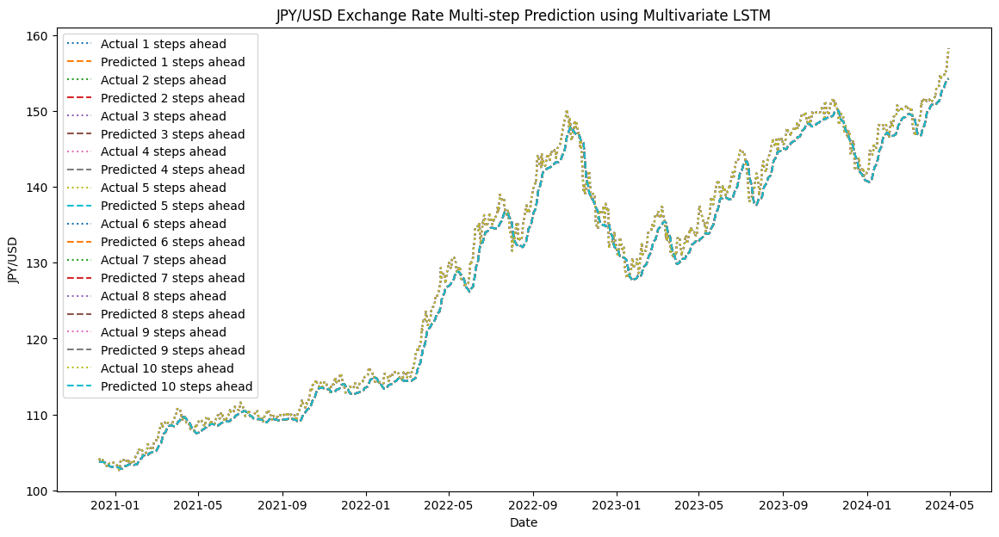

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 7))
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv, label=f'Actual {i + 1} steps ahead', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv, label=f'Predicted {i + 1} steps ahead', linestyle='dashed')
plt.title('JPY/USD Exchange Rate Multi-step Prediction using Multivariate LSTM')
plt.xlabel('Date')
plt.ylabel('JPY/USD')
plt.legend()
plt.show()


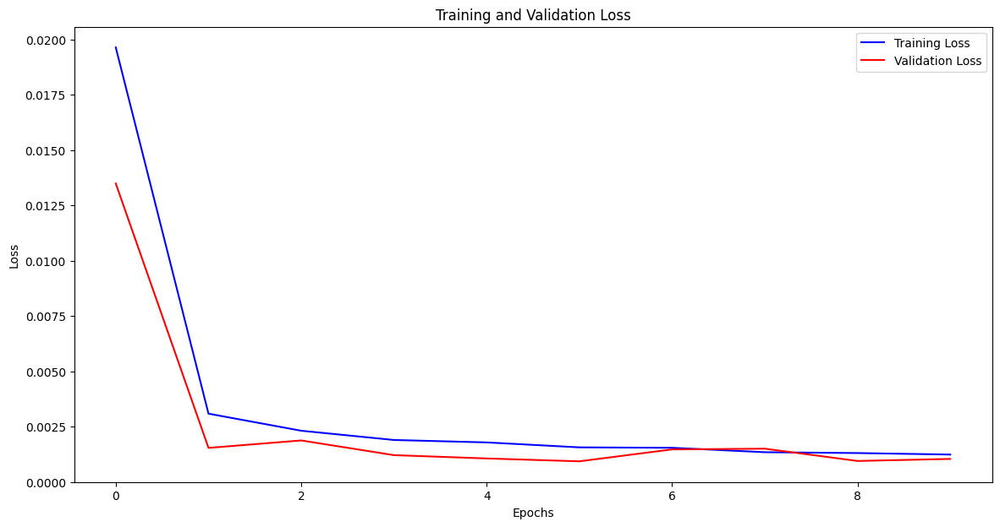

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
mse_list = []
rmse_list = []
mae_list = []
r2_list = []

y_test_flat = y_test_inv.flatten()
y_pred_flat = y_pred_inv.flatten()

mse = mean_squared_error(y_test_flat, y_pred_flat)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_flat, y_pred_flat)
r2 = r2_score(y_test_flat, y_pred_flat)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')


Mean Squared Error (MSE): 3.3662
Root Mean Squared Error (RMSE): 1.8347
Mean Absolute Error (MAE): 1.4648
R² Score: 0.9867


### Multiple Parallel Input and Multi-step Output


#### Reasons for Choosing Interest Rate Differential

#### **Why Choose Interest Rate Differential**

The interest rate differential, which is the difference between the bond yields or interest rates of two countries, is a powerful macroeconomic indicator that can significantly impact exchange rate movements. In the foreign exchange market, interest rate differentials typically influence capital flows and currency demand, thereby affecting the exchange rate.

#### **How Interest Rate Differential Affects the JPY/USD Exchange Rate**

- **Attracting Capital Flows**: If U.S. interest rates rise while Japanese rates remain unchanged or decrease, investors will move capital from Japan to the U.S. to pursue higher returns. This capital flow increases demand for the U.S. dollar, reduces demand for the Japanese yen, leading to yen depreciation and dollar appreciation, thus raising the JPY/USD exchange rate.

- **Changes in Currency Supply and Demand**: Higher U.S. interest rates make U.S. assets more attractive, causing investors to prefer holding more U.S. dollar assets. This increases demand for the U.S. dollar while reducing demand for the yen, resulting in changes in the JPY/USD exchange rate.

- **Carry Trade**: With higher U.S. interest rates, investors might borrow yen at low interest rates, convert it to U.S. dollars, and then invest in high-interest U.S. assets. This carry trade increases demand for the dollar, while the yen, being borrowed in large amounts, sees increased supply, leading to yen depreciation.

#### **Calculating the Interest Rate Differential**

To leverage the interest rate differential for predicting the JPY/USD exchange rate, we combine the U.S. Bond Yield and Japan Bond Yield data and compute their difference (`US Bond Yield - Japan Bond Yield`). Here's how:

- **Data Collection**:
  - Obtain historical data for U.S. Bond Yield and Japan Bond Yield.
  - Align the dates in the datasets to ensure consistency within the same time range for both data sources.

- **Calculate the Interest Rate Differential**:
  - For each date, compute the difference between the U.S. Bond Yield and the Japan Bond Yield: `Bond_Yield_Diff = US_Bond_Yield - Japan_Bond_Yield`.

- **Use the Interest Rate Differential for Prediction**:
  - Use the calculated interest rate differential as an input feature, along with JPY/USD exchange rate data, to feed into the model for multi-step exchange rate prediction.

### **Translation of Detailed Steps**

1. **Collect Data**:
   - From historical records, gather the U.S. Bond Yield and Japan Bond Yield.
   - Ensure that the dates are aligned in both datasets, covering the same time span.

2. **Calculate Interest Rate Differential**:
   - For each date, compute the differential between the U.S. Bond Yield and the Japan Bond Yield: `Bond_Yield_Diff = US_Bond_Yield - Japan_Bond_Yield`.

3. **Use Interest Rate Differential in Predictions**:
   - Incorporate the calculated interest rate differential as an input feature, combined with JPY/USD exchange rate data, into the model to perform multi-step predictions of the exchange rate.


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, concatenate, Dropout
import matplotlib.pyplot as plt

# Load data
df_combined = pd.read_csv('/content/drive/MyDrive/JPY_Japanese-Yen.csv')
us_bond_yield = pd.read_csv('/content/drive/MyDrive/United States Bond YieldData.csv')
japan_bond_yield = pd.read_csv('/content/drive/MyDrive/Japan Bond Yield Historical Data.csv')

# Clean and organize data
df_combined['Date'] = pd.to_datetime(df_combined['Date'])
us_bond_yield['Date'] = pd.to_datetime(us_bond_yield['Date'])
japan_bond_yield['Date'] = pd.to_datetime(japan_bond_yield['Date'])

# Rename columns and keep only necessary columns
us_bond_yield = us_bond_yield[['Date', 'Price']].rename(columns={'Price': 'US_Bond_Yield'})
japan_bond_yield = japan_bond_yield[['Date', 'Price']].rename(columns={'Price': 'Japan_Bond_Yield'})

# Merge data
df_combined = df_combined.merge(us_bond_yield, on='Date', how='left')
df_combined = df_combined.merge(japan_bond_yield, on='Date', how='left')

# Calculate difference feature
df_combined['Bond_Yield_Diff'] = df_combined['US_Bond_Yield'] - df_combined['Japan_Bond_Yield']

# Remove NaN values
df_combined = df_combined.dropna()

# Data normalization
scaler_close = MinMaxScaler()
scaler_yield_diff = MinMaxScaler()

close_scaled = scaler_close.fit_transform(df_combined[['Close']])
yield_diff_scaled = scaler_yield_diff.fit_transform(df_combined[['Bond_Yield_Diff']])

# Create multi-step dataset
def create_multivariate_parallel_dataset(close, yield_diff, look_back=60, forecast_horizon=10):
    close_X, yield_diff_X, dataY = [], [], []
    for i in range(len(close) - look_back - forecast_horizon):
        close_X.append(close[i:(i + look_back)])
        yield_diff_X.append(yield_diff[i:(i + look_back)])
        dataY.append(close[(i + look_back):(i + look_back + forecast_horizon)])
    return np.array(close_X), np.array(yield_diff_X), np.array(dataY)

look_back = 60  # Number of time steps for model input
forecast_horizon = 10  # Number of future time steps to predict
close_X, yield_diff_X, y = create_multivariate_parallel_dataset(close_scaled, yield_diff_scaled, look_back, forecast_horizon)

# Split into training and test sets
train_size = int(len(close_X) * 0.8)
close_X_train, yield_diff_X_train, y_train = close_X[:train_size], yield_diff_X[:train_size], y[:train_size]
close_X_test, yield_diff_X_test, y_test = close_X[train_size:], yield_diff_X[train_size:], y[train_size:]

print(f'close_X_train shape: {close_X_train.shape}')
print(f'yield_diff_X_train shape: {yield_diff_X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'close_X_test shape: {close_X_test.shape}')
print(f'yield_diff_X_test shape: {yield_diff_X_test.shape}')
print(f'y_test shape: {y_test.shape}')


close_X_train shape: (3439, 60, 1)
yield_diff_X_train shape: (3439, 60, 1)
y_train shape: (3439, 10, 1)
close_X_test shape: (860, 60, 1)
yield_diff_X_test shape: (860, 60, 1)
y_test shape: (860, 10, 1)


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, concatenate, Dropout

# Build Close input branch
close_input = Input(shape=(look_back, 1), name='close_input')
close_flat = Flatten()(close_input)

# Build Bond Yield Diff input branch
yield_diff_input = Input(shape=(look_back, 1), name='yield_diff_input')
yield_diff_flat = Flatten()(yield_diff_input)

# Merge the two branches
merged = concatenate([close_flat, yield_diff_flat])

# Fully connected layers
dense = Dense(100, activation='relu')(merged)
dense = Dropout(0.2)(dense)
output = Dense(forecast_horizon)(dense)

# Build the model
model = Model(inputs=[close_input, yield_diff_input], outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit([close_X_train, yield_diff_X_train], y_train.reshape(y_train.shape[0], -1),
                    epochs=10, batch_size=32,
                    validation_data=([close_X_test, yield_diff_X_test], y_test.reshape(y_test.shape[0], -1)))

# Print model summary
model.summary()

Epoch 1/10
108/108 [==============================] - 1s 4ms/step - loss: 0.0185 - val_loss: 0.0050
Epoch 2/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0050 - val_loss: 0.0026
Epoch 3/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 4/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0031 - val_loss: 0.0013
Epoch 5/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 6/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 7/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0014
Epoch 8/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0091
Epoch 9/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0067
Epoch 10/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 9.0301

In [ ]:
y_pred = model.predict([close_X_test, yield_diff_X_test])

y_pred = y_pred.reshape(y_pred.shape[0], forecast_horizon, 1)

y_pred_inv = scaler_close.inverse_transform(y_pred.reshape(-1, 1)).reshape(y_pred.shape)
y_test_inv = scaler_close.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

print(f'First 5 Predictions:\n{y_pred_inv[:5]}')
print(f'First 5 Actual Values:\n{y_test_inv[:5]}')


27/27 [==============================] - 0s 1ms/step
First 5 Predictions:
[[[104.742455]
  [104.75919 ]
  [104.83989 ]
  [104.776184]
  [104.983376]
  [104.810745]
  [104.73419 ]
  [104.47876 ]
  [104.49785 ]
  [104.55537 ]]

 [[104.67251 ]
  [104.9048  ]
  [104.59177 ]
  [104.64929 ]
  [104.83109 ]
  [104.78224 ]
  [104.645935]
  [104.55321 ]
  [104.29085 ]
  [104.50627 ]]

 [[105.05899 ]
  [105.2859  ]
  [104.94267 ]
  [104.82732 ]
  [105.08985 ]
  [105.20009 ]
  [105.0548  ]
  [104.825096]
  [104.61386 ]
  [104.662   ]]

 [[105.23438 ]
  [105.17822 ]
  [105.07527 ]
  [104.96643 ]
  [105.044304]
  [105.14371 ]
  [105.070175]
  [105.04511 ]
  [104.5719  ]
  [104.730415]]

 [[105.14542 ]
  [104.81272 ]
  [104.65696 ]
  [104.95421 ]
  [104.74197 ]
  [105.13983 ]
  [105.314   ]
  [104.83518 ]
  [104.721954]
  [105.05643 ]]]
First 5 Actual Values:
[[[103.9980011]
  [104.1350021]
  [104.2720032]
  [104.1819992]
  [103.939003 ]
  [104.0100021]
  [103.6340027]
  [103.4749985]
  [103.1309967]

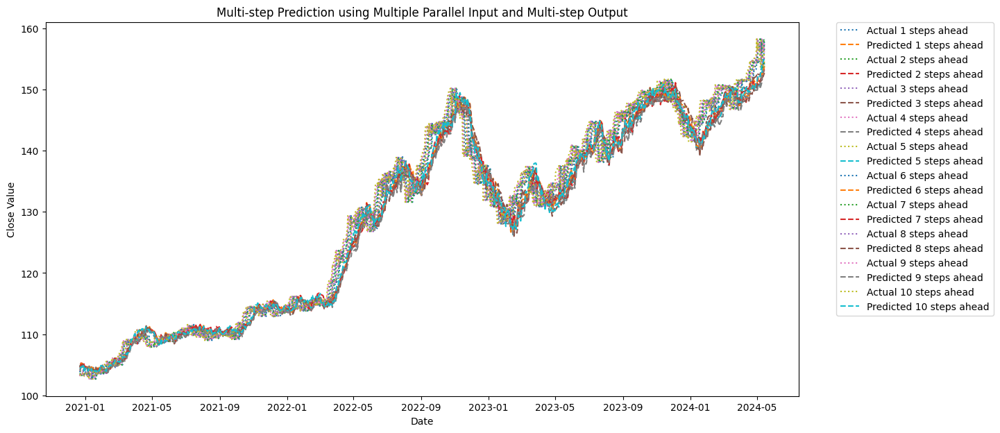

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back + forecast_horizon:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 7))
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i, 0], label=f'Actual {i + 1} steps ahead', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i, 0], label=f'Predicted {i + 1} steps ahead', linestyle='dashed')
plt.title('Multi-step Prediction using Multiple Parallel Input and Multi-step Output')
plt.xlabel('Date')
plt.ylabel('Close Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()


Axis Labels:

- **X-Axis**: Represents the date range from January 2021 to May 2024.
- **Y-Axis**: Represents the closing value.

 Lines:

- **Dotted Lines**: Represent the actual future values (1 to 10 steps ahead). Each line corresponds to the actual closing value `n` steps ahead from each prediction point.
- **Dashed Lines**: Represent the predicted future values (1 to 10 steps ahead). Each line corresponds to the predicted closing value `n` steps ahead from each prediction point.

 Explanation:

- **Closeness**: The closer the dashed lines (predicted values) are to the dotted lines (actual values), the better the model's performance.
- **Spread**: The spread between different lines indicates the forecast horizon. Predictions closer to the current date tend to be more accurate, and the accuracy generally decreases as the forecast horizon extends.

 Observations:

- The model captures the overall trend of the closing prices well, especially in the short term.
- As the horizon extends (further into the future), the deviation between the predicted values and actual values increases, which is expected in time series forecasting.



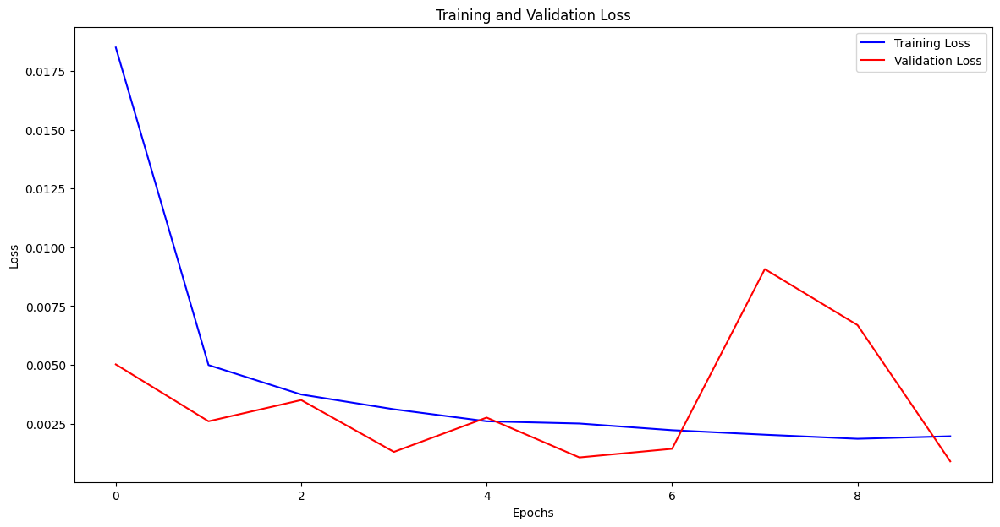

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
mse = mean_squared_error(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))
r2 = r2_score(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'R² Score: {r2}')


Mean Squared Error (MSE): 6.1436958695139205
Root Mean Squared Error (RMSE): 2.478647992255843
Mean Absolute Error (MAE): 1.8877102037095295
R² Score: 0.9757747842576944


# MLP Model

##Univariate MLP Models

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
df = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv')

# Data processing
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[['Close']])

train = df_scaled[:int(len(df) * 0.8)]
test = df_scaled[int(len(df) * 0.8):]

def create_dataset(dataset, look_back=60):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 60
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1]))

In [ ]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(look_back,)))
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 100)               6100      
                                                                 
 dense_5 (Dense)             (None, 50)                5050      
                                                                 
 dense_6 (Dense)             (None, 1)                 51        
                                                                 
Total params: 11201 (43.75 KB)
Trainable params: 11201 (43.75 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10
177/177 [==============================] - 2s 6ms/step - loss: 0.0022 - val_loss: 3.6040e-04
Epoch 2/10
177/177 [==============================] - 1s 5ms/step - loss: 2.9915e-04 - val_loss: 3.0549e-04
Epoch 3/10
177/177 [==============================] - 1s 7ms/step - lo

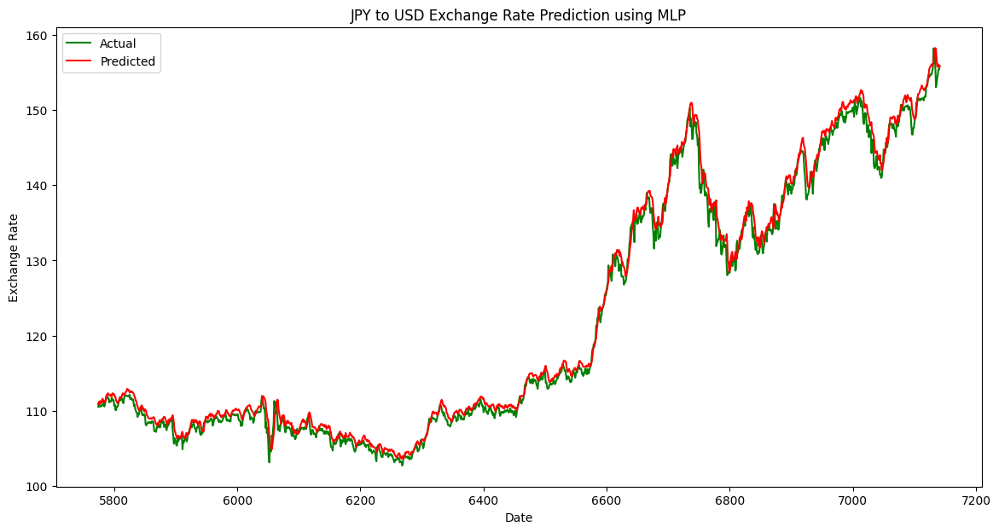

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('JPY to USD Exchange Rate Prediction using MLP')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.legend()
plt.show()

In [ ]:
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')
print(f'Number of samples in training data: {X_train.shape[0]}')
print(f'Number of samples in test data: {X_test.shape[0]}')

Mean Squared Error (MSE): 1.4732
Root Mean Squared Error (RMSE): 1.2138
Mean Absolute Error (MAE): 0.9174
R² Score: 0.9946
Number of samples in training data: 5652
Number of samples in test data: 1368


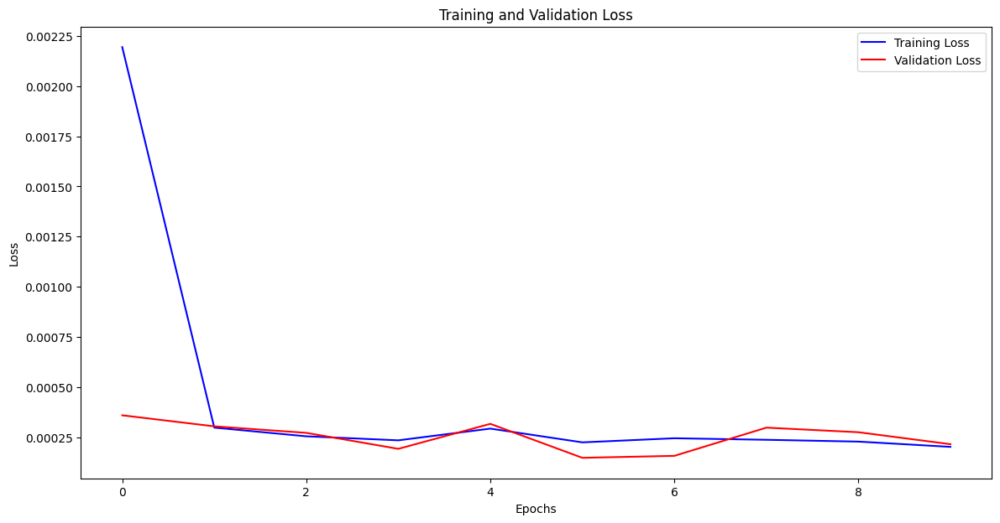

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Multivariate Multi-step MLP Models

### Multiple Parallel Input and Multi-step Output MLP Model

Model Overview
The Multiple Parallel Input and Multi-step Output MLP Model is a multi-layer perceptron (MLP) designed for handling multiple input features and predicting future values of these features over several time steps. This model is ideal for multivariate time series forecasting, especially when you need to consider multiple input features and perform multi-step predictions.

Reasons for Choosing This Model

1.Handling Multiple Input Features:

- This model can simultaneously handle input features such as JPY/USD exchange rate, US Bond Yield, and Japan Bond Yield, capturing their interrelationships.

2.Multi-step Prediction Capability:

- It can output predictions for several future time steps, meeting the need for multi-step forecasting of JPY/USD exchange rate and bond yields.

3.Capturing Complex Relationships:

- The MLP model, through its multi-layer neural network structure, can capture complex relationships among input features, enhancing prediction accuracy.

4.Parallel Processing:

- Suitable for handling multiple parallel input features and predicting their future values concurrently, which is useful for multivariate time series forecasting.

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, concatenate, Dropout

# Build Close input branch
close_input = Input(shape=(look_back, 1), name='close_input')
close_flat = Flatten()(close_input)

# Build Bond Yield Diff input branch
yield_diff_input = Input(shape=(look_back, 1), name='yield_diff_input')
yield_diff_flat = Flatten()(yield_diff_input)

# Merge the two branches
merged = concatenate([close_flat, yield_diff_flat])

# Fully connected layers
dense = Dense(100, activation='relu')(merged)
dense = Dropout(0.2)(dense)
output = Dense(forecast_horizon)(dense)

# Build the model
model = Model(inputs=[close_input, yield_diff_input], outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Train the model
history = model.fit([close_X_train, yield_diff_X_train], y_train.reshape(y_train.shape[0], -1),
                    epochs=10, batch_size=32,
                    validation_data=([close_X_test, yield_diff_X_test], y_test.reshape(y_test.shape[0], -1)))

# Print model summary
model.summary()


Epoch 1/10
108/108 [==============================] - 1s 4ms/step - loss: 0.0225 - val_loss: 0.0070
Epoch 2/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0054 - val_loss: 0.0044
Epoch 3/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0040 - val_loss: 0.0015
Epoch 4/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0037 - val_loss: 0.0018
Epoch 5/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0039
Epoch 6/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0016
Epoch 7/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 8/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0025
Epoch 9/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0017
Epoch 10/10
108/108 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0016

In [ ]:
y_pred = model.predict([close_X_test, yield_diff_X_test])

y_pred = y_pred.reshape(y_pred.shape[0], forecast_horizon, 1)

y_pred_inv = scaler_close.inverse_transform(y_pred.reshape(-1, 1)).reshape(y_pred.shape)
y_test_inv = scaler_close.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

print(f'First 5 Predictions:\n{y_pred_inv[:5]}')
print(f'First 5 Actual Values:\n{y_test_inv[:5]}')


27/27 [==============================] - 0s 1ms/step
First 5 Predictions:
[[[104.1934  ]
  [104.51536 ]
  [103.72792 ]
  [104.86349 ]
  [104.05155 ]
  [104.30904 ]
  [104.52941 ]
  [104.043655]
  [104.02571 ]
  [104.7888  ]]

 [[104.11145 ]
  [103.9236  ]
  [103.50597 ]
  [104.538216]
  [103.74701 ]
  [103.84429 ]
  [104.089966]
  [103.63885 ]
  [103.58607 ]
  [104.47548 ]]

 [[104.32352 ]
  [104.228294]
  [103.78274 ]
  [104.73325 ]
  [104.049706]
  [104.30756 ]
  [103.98124 ]
  [104.0446  ]
  [103.733536]
  [104.762794]]

 [[103.94813 ]
  [103.88652 ]
  [103.74159 ]
  [104.607994]
  [104.048874]
  [104.37263 ]
  [103.53466 ]
  [104.0176  ]
  [103.48347 ]
  [104.40781 ]]

 [[104.310295]
  [104.44036 ]
  [104.04852 ]
  [104.68679 ]
  [104.48711 ]
  [104.77863 ]
  [103.88596 ]
  [104.3117  ]
  [103.93624 ]
  [104.89419 ]]]
First 5 Actual Values:
[[[103.9980011]
  [104.1350021]
  [104.2720032]
  [104.1819992]
  [103.939003 ]
  [104.0100021]
  [103.6340027]
  [103.4749985]
  [103.1309967]

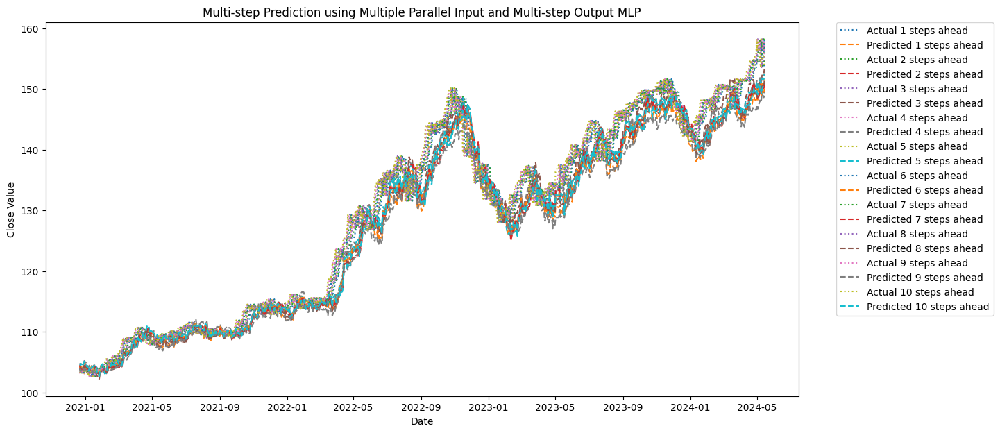

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back + forecast_horizon:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 7))
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i, 0], label=f'Actual {i + 1} steps ahead', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i, 0], label=f'Predicted {i + 1} steps ahead', linestyle='dashed')
plt.title('Multi-step Prediction using Multiple Parallel Input and Multi-step Output MLP')
plt.xlabel('Date')
plt.ylabel('Close Value')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()


 Chart Explanation

This chart displays the results of predicting the **JPY to USD exchange rate** using a **Multiple Parallel Input and Multi-step Output MLP Model**.

**X-Axis**:
- **Date**: Ranges from January 2021 to May 2024.

**Y-Axis**:
- **Exchange Rate**: The closing JPY to USD exchange rate.

**Lines**:
- **Dotted Lines**: Represent the actual future exchange rates (predictions from 1 to 10 steps ahead).
- **Dashed Lines**: Represent the model's predicted future exchange rates (predictions from 1 to 10 steps ahead).

 Summary

- **Prediction Accuracy**: The closer the dashed lines (predicted values) are to the dotted lines (actual values), the more accurate the model's predictions.
- **Trend Tracking**: The model effectively follows the overall trend of the exchange rates, especially in the short term.
- **Error Variation**: The prediction error generally increases with the number of steps ahead.

The chart demonstrates the model's performance in multi-step forecasting of the JPY to USD exchange rate and highlights how the prediction accuracy changes over time.

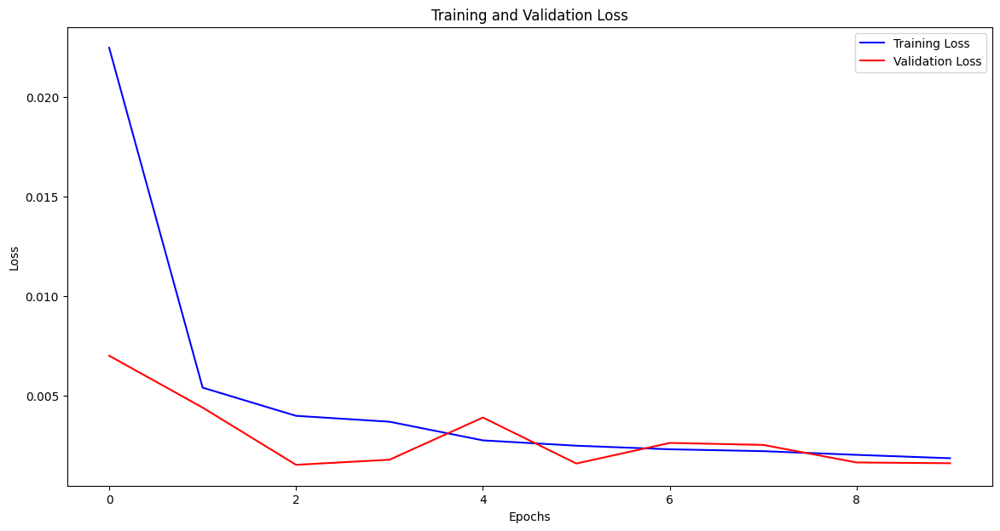

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))
r2 = r2_score(y_test_inv.reshape(-1), y_pred_inv.reshape(-1))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'R² Score: {r2}')


Mean Squared Error (MSE): 11.045538376268794
Root Mean Squared Error (RMSE): 3.323482868357951
Mean Absolute Error (MAE): 2.5592472979840006
R² Score: 0.9564463222401993


# CNN Model

## Univariate Convolutional Neural Network models

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[['Close']])

train = df_scaled[:int(len(df) * 0.8)]
test = df_scaled[int(len(df) * 0.8):]

def create_dataset(dataset, look_back=60):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 1):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 60
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(look_back, 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

model.summary()
model.compile(optimizer='adam', loss='mse')
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 59, 64)            192       
                                                                 
 max_pooling1d (MaxPooling1  (None, 29, 64)            0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 1856)              0         
                                                                 
 dense_7 (Dense)             (None, 50)                92850     
                                                                 
 dense_8 (Dense)             (None, 1)                 51        
                                                                 
Total params: 93093 (363.64 KB)
Trainable params: 93093 (363.64 KB)
Non-trainable params: 0 (0.00 Byte)
________________

In [ ]:
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

43/43 [==============================] - 0s 3ms/step


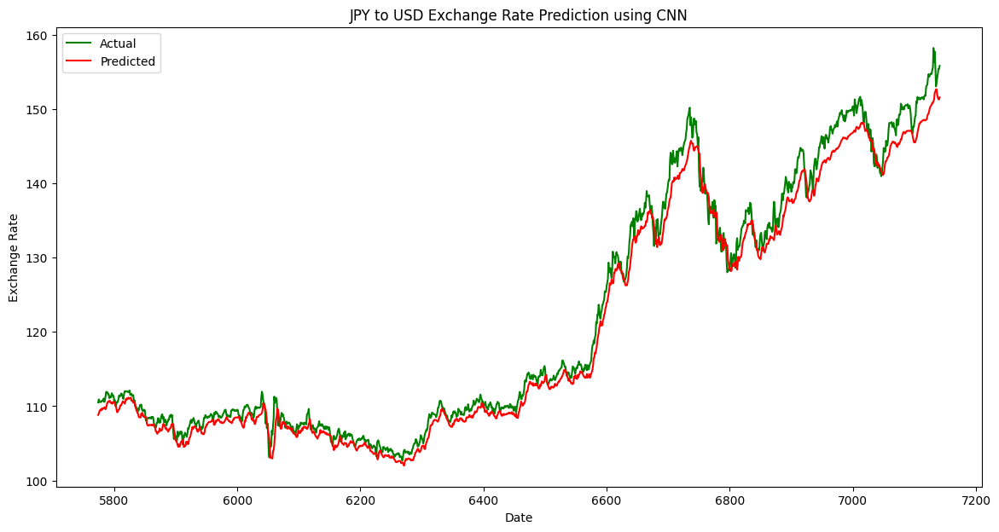

In [ ]:
df_index_test = df.index[int(len(df) * 0.8) + look_back + 1:]

plt.figure(figsize=(14, 7))
plt.plot(df_index_test[:len(y_test_inv)], y_test_inv, label='Actual', color='g')
plt.plot(df_index_test[:len(y_pred_inv)], y_pred_inv, label='Predicted', color='r')
plt.title('JPY to USD Exchange Rate Prediction using CNN')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.legend()
plt.show()

In [ ]:
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f'Mean Squared Error (MSE): {mse:.4f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')
print(f'Mean Absolute Error (MAE): {mae:.4f}')
print(f'R² Score: {r2:.4f}')
print(f'Number of samples in training data: {X_train.shape[0]}')
print(f'Number of samples in test data: {X_test.shape[0]}')

Mean Squared Error (MSE): 3.9692
Root Mean Squared Error (RMSE): 1.9923
Mean Absolute Error (MAE): 1.6064
R² Score: 0.9854
Number of samples in training data: 5652
Number of samples in test data: 1368


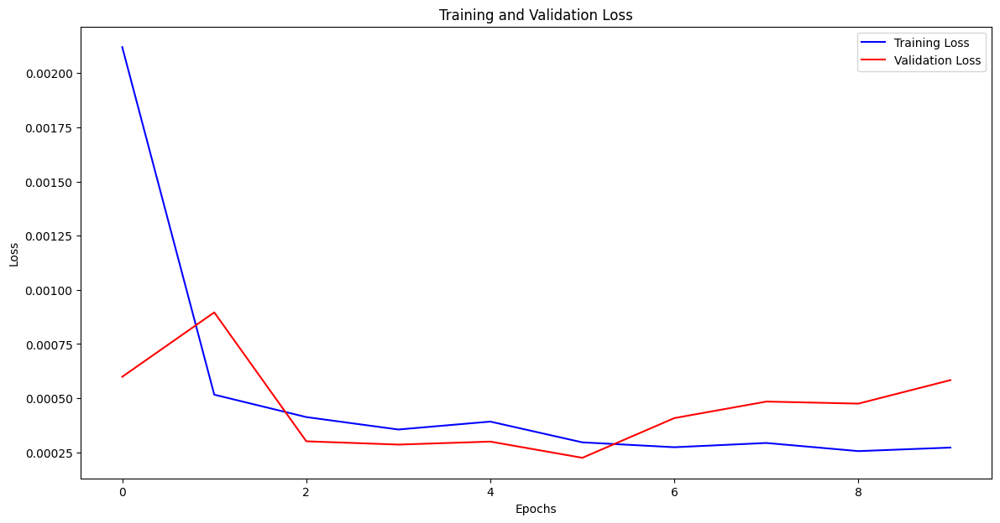

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Multiple Parallel Input and Multi-step Output

### Why Choose Multiple Parallel Input and Multi-step Output CNN Model

#### **Reasons for Choosing CNN**

1. **Capturing Local Patterns**:
   - **Convolutional Layers**: CNNs detect short-term patterns and trends in time series data, essential for predicting exchange rates influenced by interest rate differentials.

2. **Handling Multiple Inputs**:
   - **Parallel Inputs**: CNNs process multiple input sequences like `JPY/USD` exchange rate (`Close`) and `US/Japan Bond Yield Difference`, learning their combined effects.

3. **Extracting Temporal Features**:
   - **Temporal Dependencies**: Convolution operations capture how changes in bond yields and exchange rates influence each other over time.

4. **Efficiency**:
   - **Computational Efficiency**: CNNs are efficient in handling large datasets and making real-time predictions, essential for exchange rate forecasting.

#### **How CNN Benefits JPY/USD Prediction**

- **Local Temporal Patterns**: Identifies trends and anomalies in `JPY/USD` and bond yields, crucial for short-term forecasts.
- **Multi-feature Learning**: Captures interactions between exchange rates and bond yield differentials, improving prediction accuracy.
- **Noise Robustness**: Focuses on significant patterns, reducing the impact of random fluctuations.



In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout
import matplotlib.pyplot as plt

df_combined = pd.read_csv('/content/drive/MyDrive/JPY_Japanese-Yen.csv')
us_bond_yield = pd.read_csv('/content/drive/MyDrive/United States Bond YieldData.csv')
japan_bond_yield = pd.read_csv('/content/drive/MyDrive/Japan Bond Yield Historical Data.csv')

df_combined['Date'] = pd.to_datetime(df_combined['Date'])
us_bond_yield['Date'] = pd.to_datetime(us_bond_yield['Date'])
japan_bond_yield['Date'] = pd.to_datetime(japan_bond_yield['Date'])

us_bond_yield = us_bond_yield[['Date', 'Price']].rename(columns={'Price': 'US_Bond_Yield'})
japan_bond_yield = japan_bond_yield[['Date', 'Price']].rename(columns={'Price': 'Japan_Bond_Yield'})

df_combined = df_combined.merge(us_bond_yield, on='Date', how='left')
df_combined = df_combined.merge(japan_bond_yield, on='Date', how='left')

df_combined.rename(columns={'Close': 'JPY_USD'}, inplace=True)

print(df_combined.head())

df_combined['US_Bond_Yield_Diff'] = df_combined['US_Bond_Yield'].diff().fillna(0)
df_combined['Japan_Bond_Yield_Diff'] = df_combined['Japan_Bond_Yield'].diff().fillna(0)

scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(df_combined[['JPY_USD', 'US_Bond_Yield_Diff', 'Japan_Bond_Yield_Diff']])

def create_multivariate_parallel_dataset(dataset, look_back=60, forecast_horizon=10):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - forecast_horizon):
        a = dataset[i:(i + look_back), :]
        dataX.append(a)
        b = dataset[(i + look_back):(i + look_back + forecast_horizon), :]
        dataY.append(b)
    return np.array(dataX), np.array(dataY)

look_back = 60
forecast_horizon = 10
X, y = create_multivariate_parallel_dataset(data_scaled, look_back, forecast_horizon)

train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')


        Date        Open        High         Low     JPY_USD  Volume  \
0 1996-10-30  114.370003  114.480003  113.610001  114.180000       0   
1 1996-11-01  113.500000  113.500000  113.500000  113.500000       0   
2 1996-11-04  113.279999  113.980003  112.949997  113.879997       0   
3 1996-11-05  113.709999  114.330002  113.449997  114.250000       0   
4 1996-11-06  114.230003  114.680000  113.650002  113.949997       0   

   US_Bond_Yield  Japan_Bond_Yield  
0          6.414               NaN  
1          6.375               NaN  
2          6.345               NaN  
3          6.269               NaN  
4          6.294               NaN  
X_train shape: (5657, 60, 3)
y_train shape: (5657, 10, 3)
X_test shape: (1415, 60, 3)
y_test shape: (1415, 10, 3)


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, Dense, Flatten, Dropout

input_layer = Input(shape=(look_back, X_train.shape[2]))

conv_layer = Conv1D(filters=64, kernel_size=3, activation='relu')(input_layer)
conv_layer = Dropout(0.2)(conv_layer)
conv_layer = Flatten()(conv_layer)

dense_layer = Dense(100, activation='relu')(conv_layer)
dense_layer = Dropout(0.2)(dense_layer)
output_layer = Dense(forecast_horizon * X_train.shape[2])(dense_layer)

model = Model(inputs=input_layer, outputs=output_layer)

model.compile(optimizer='adam', loss='mse')

history = model.fit(X_train, y_train.reshape(y_train.shape[0], -1), epochs=10, batch_size=32, validation_data=(X_test, y_test.reshape(y_test.shape[0], -1)))

model.summary()


Epoch 1/10
177/177 [==============================] - 2s 4ms/step - loss: 0.0180 - val_loss: 0.0039
Epoch 2/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0070 - val_loss: 0.0034
Epoch 3/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0054 - val_loss: 0.0031
Epoch 4/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0046 - val_loss: 0.0035
Epoch 5/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0042 - val_loss: 0.0031
Epoch 6/10
177/177 [==============================] - 1s 4ms/step - loss: 0.0038 - val_loss: 0.0028
Epoch 7/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0035 - val_loss: 0.0026
Epoch 8/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0033 - val_loss: 0.0026
Epoch 9/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 10/10
177/177 [==============================] - 1s 3ms/step - loss: 0.0030 - val_loss: 0.0025

In [ ]:
y_pred = model.predict(X_test)

y_pred = y_pred.reshape(y_pred.shape[0], forecast_horizon, X_test.shape[2])

y_pred_expanded = np.zeros((y_pred.shape[0] * forecast_horizon, data_scaled.shape[1]))
y_test_expanded = np.zeros((y_test.shape[0] * forecast_horizon, data_scaled.shape[1]))

for i in range(forecast_horizon):
    y_pred_expanded[i::forecast_horizon, :] = y_pred[:, i, :]
    y_test_expanded[i::forecast_horizon, :] = y_test[:, i, :]

y_pred_inv = scaler.inverse_transform(y_pred_expanded).reshape(y_pred.shape[0], forecast_horizon, X_test.shape[2])
y_test_inv = scaler.inverse_transform(y_test_expanded).reshape(y_test.shape[0], forecast_horizon, X_test.shape[2])

print(f'First 5 Predictions:\n{y_pred_inv[:5]}')
print(f'First 5 Actual Values:\n{y_test_inv[:5]}')


45/45 [==============================] - 0s 1ms/step
First 5 Predictions:
[[[ 1.13963335e+02 -1.10211372e-03 -9.81514856e-04]
  [ 1.14090843e+02 -3.17599022e-03  8.88759226e-04]
  [ 1.13958026e+02 -1.71612239e-03  2.15583709e-03]
  [ 1.13908714e+02 -3.53325486e-03  2.86537024e-03]
  [ 1.14004247e+02 -6.79728782e-03  1.31442414e-03]
  [ 1.13918259e+02 -5.54210532e-03 -5.37638724e-03]
  [ 1.13736334e+02 -1.82885313e-03 -4.03784013e-03]
  [ 1.13535822e+02 -4.45734406e-03  4.69868183e-05]
  [ 1.14036536e+02 -7.30817294e-03  7.56428295e-03]
  [ 1.13841860e+02 -5.26406455e-03  2.88833344e-03]]

 [[ 1.13804984e+02 -1.67651045e-03  9.21216413e-04]
  [ 1.13961280e+02 -3.11441898e-03  4.41071299e-03]
  [ 1.13788819e+02 -3.81711674e-03  3.81062505e-03]
  [ 1.13845901e+02 -1.71967185e-03 -1.92357680e-03]
  [ 1.13924734e+02 -8.59937060e-03  1.44850299e-03]
  [ 1.13900683e+02 -5.43637884e-03 -3.71064630e-03]
  [ 1.13691693e+02 -4.01659620e-03 -1.23277789e-03]
  [ 1.13439984e+02 -4.41508186e-03  2.91

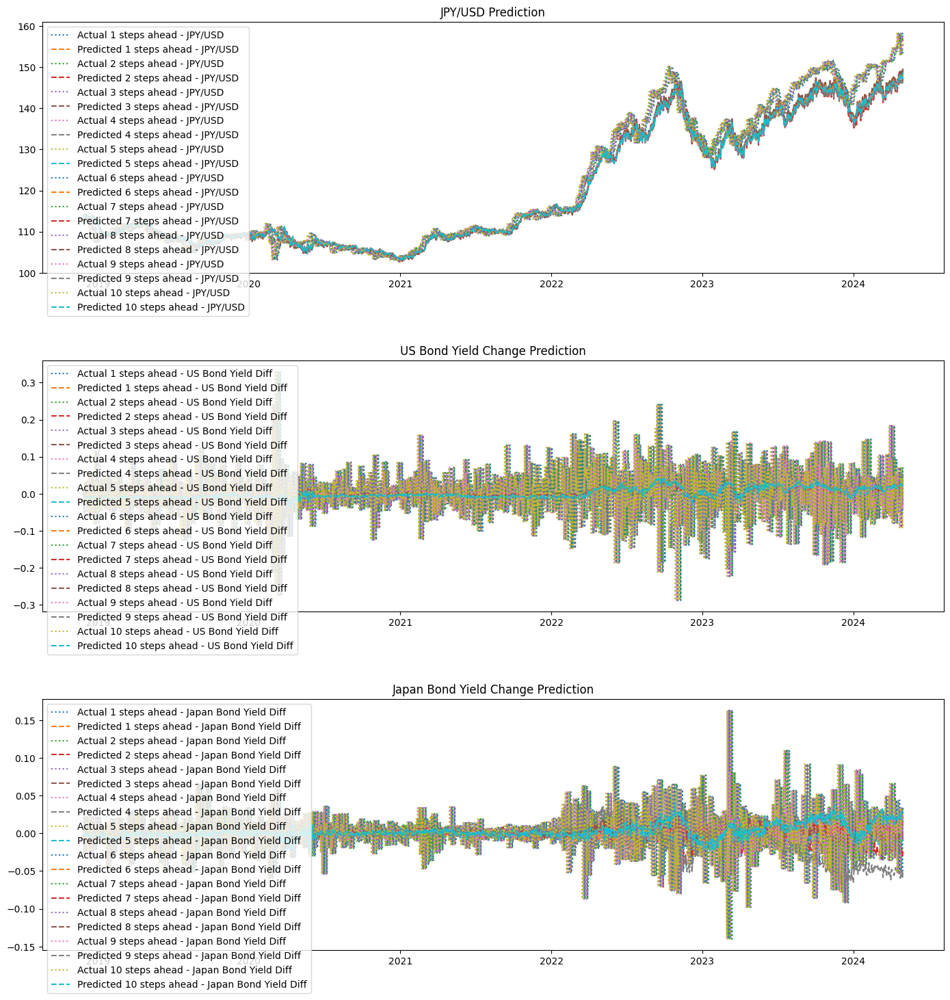

In [ ]:
df_index_test = df_combined['Date'].iloc[train_size + look_back:]

df_index_test = df_index_test[:len(y_test_inv)]

plt.figure(figsize=(14, 15))

# JPY/USD
plt.subplot(3, 1, 1)
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i, 0], label=f'Actual {i + 1} steps ahead - JPY/USD', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i, 0], label=f'Predicted {i + 1} steps ahead - JPY/USD', linestyle='dashed')
plt.title('JPY/USD Prediction')
plt.legend(loc='upper left')

# US Bond Yield
plt.subplot(3, 1, 2)
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i, 1], label=f'Actual {i + 1} steps ahead - US Bond Yield Diff', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i, 1], label=f'Predicted {i + 1} steps ahead - US Bond Yield Diff', linestyle='dashed')
plt.title('US Bond Yield Change Prediction')
plt.legend(loc='upper left')

# Japan Bond Yield Diff
plt.subplot(3, 1, 3)
for i in range(forecast_horizon):
    plt.plot(df_index_test, y_test_inv[:, i, 2], label=f'Actual {i + 1} steps ahead - Japan Bond Yield Diff', linestyle='dotted')
    plt.plot(df_index_test, y_pred_inv[:, i, 2], label=f'Predicted {i + 1} steps ahead - Japan Bond Yield Diff', linestyle='dashed')
plt.title('Japan Bond Yield Change Prediction')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


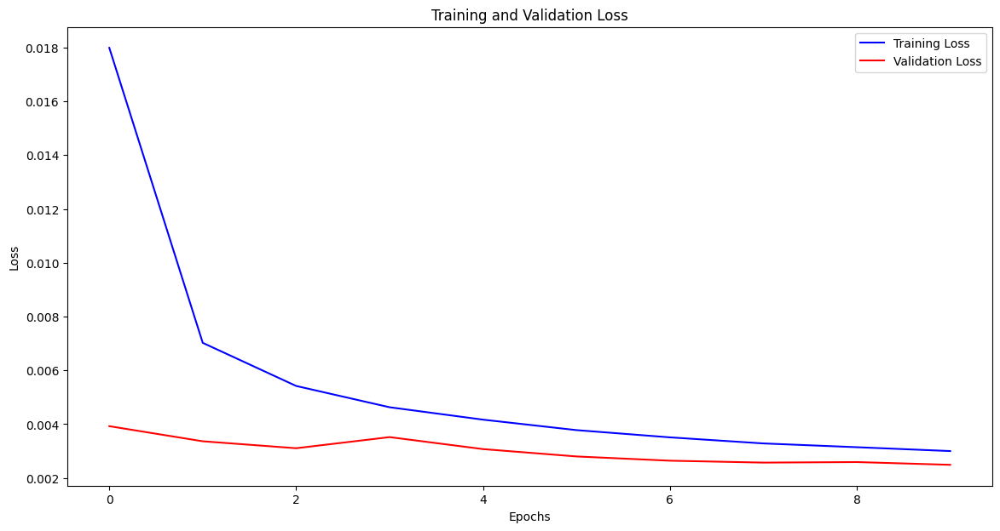

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['loss'], label='Training Loss', color='b')
plt.plot(history.history['val_loss'], label='Validation Loss', color='r')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse_list = []
rmse_list = []
mae_list = []
r2_list = []

y_test_flat = y_test_inv.reshape(-1, X_test.shape[2])
y_pred_flat = y_pred_inv.reshape(-1, X_test.shape[2])

for feature in range(X_test.shape[2]):
    mse = mean_squared_error(y_test_flat[:, feature], y_pred_flat[:, feature])
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test_flat[:, feature], y_pred_flat[:, feature])
    r2 = r2_score(y_test_flat[:, feature], y_pred_flat[:, feature])

    mse_list.append(mse)
    rmse_list.append(rmse)
    mae_list.append(mae)
    r2_list.append(r2)

print(f'Mean Squared Error (MSE) by feature: {mse_list}')
print(f'Root Mean Squared Error (RMSE) by feature: {rmse_list}')
print(f'Mean Absolute Error (MAE) by feature: {mae_list}')
print(f'R² Score by feature: {r2_list}')


Mean Squared Error (MSE) by feature: [9.544178248456538, 0.0037695951365792455, 0.0006600900109366701]
Root Mean Squared Error (RMSE) by feature: [3.089365347196174, 0.06139702872761226, 0.025692216933084426]
Mean Absolute Error (MAE) by feature: [2.133453200935474, 0.045342846796740055, 0.017751993758089762]
R² Score by feature: [0.9639007611602162, -0.037990199206180186, -0.14228322323607245]


# Grid Search

In [ ]:
import numpy as np
import pandas as pd
from math import sqrt
from keras.models import Sequential
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, LSTM

                 Close
Date                  
1996-10-30  114.180000
1996-11-01  113.500000
1996-11-04  113.879997
1996-11-05  114.250000
1996-11-06  113.949997
(7142, 1)


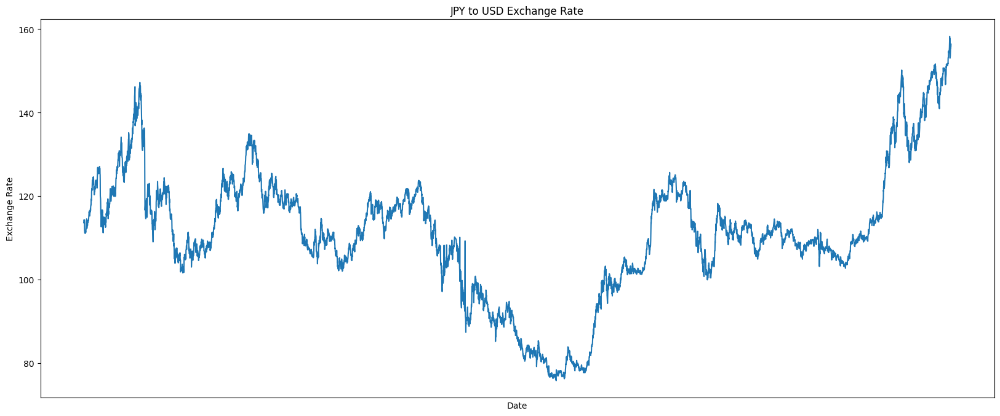

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

series = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv', header=0, index_col=0, usecols=['Date', 'Close'])
series.index = pd.to_datetime(series.index, format='%Y/%m/%d')

print(series.head())

print(series.shape)

plt.figure(figsize=(20, 8))
plt.plot(series)
plt.title('JPY to USD Exchange Rate')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.xticks([])
plt.show()

## Develop a Grid Search Framework
We will develop a network search test tool that can be used to evaluate a range of hyperparameters for different neural network models, such as MLPs, CNNs, and LSTMs.

### 1. Train-Test Split

In [ ]:
# split a univariate dataset into train/test sets
def train_test_split(data, test_size):
    return data[:-test_size], data[-test_size:]

### 2. Series as Supervised Learning
To train neural network models, we need to frame the univariate time series as a supervised learning problem. This involves splitting the data into multiple examples that the model can learn from and generalize across. Each example must have both an input component and an output component.

In [ ]:
def series_to_supervised(data, n_in, n_out=1):
    """
    Transform a time series into a supervised learning format.

    Parameters:
    data (list or array): The univariate time series data.
    n_in (int): The number of lag observations as input (X).
    n_out (int): The number of observations as output (y). Default is 1.

    Returns:
    ndarray: The transformed data suitable for supervised learning.
    """
    df = pd.DataFrame(data)
    cols = []

    # Create input sequence (t-n, ..., t-1)
    cols += [df.shift(i) for i in range(n_in, 0, -1)]

    # Create forecast sequence (t, t+1, ..., t+n)
    cols += [df.shift(-i) for i in range(n_out)]

    # Combine all sequences and drop rows with NaN values
    agg = pd.concat(cols, axis=1).dropna()

    return agg.values

In [ ]:
print(series_to_supervised(series, 3, 1))

[[114.1800003 113.5       113.8799973 114.25     ]
 [113.5       113.8799973 114.25      113.9499969]
 [113.8799973 114.25      113.9499969 111.7399979]
 ...
 [154.2369995 154.7480011 155.4190063 155.3890076]
 [154.7480011 155.4190063 155.3890076 155.8179932]
 [155.4190063 155.3890076 155.8179932 156.4069977]]


### 3. Walk-Forward Validation
- Time series forecasting models can be evaluated on a test set using walk-forward validation.
- In this approach, the model makes a forecast for each observation in the test dataset one at a time.
- After each forecast, the true observation is added to the test dataset and made available to the model.
- Simpler models can be refit with this new observation before making the next prediction. However, more complex models, such as neural networks, are not typically refit due to the high computational cost. Instead, the true observation is used as part of the input for the next prediction.
- The prediction is added to a list of predictions, and the true observation from the test set is added to a list of observations, initially seeded with all training dataset observations. This list is built up during each step of walk-forward validation, allowing the model to make a one-step prediction using the most recent history.
- All predictions can then be compared to the true values in the test set, and an error measure can be calculated.e step.

In [ ]:
# Fit a model (dummy function, replace with actual model fitting)
def model_fit(train, config):
    return None

# Forecast with a pre-fit model
def model_predict(model, history, offset):
    return history[-offset]

# Calculate root mean squared error (RMSE)
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

In [ ]:
# Walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
    predictions = []
    # Split dataset into training and test sets
    train, test = train_test_split(data, n_test)

    # Fit the model
    model = model_fit(train, cfg)
    # Seed history with the training dataset
    history = list(train)

    # Step over each time step in the test set
    for i in range(len(test)):
        # Make forecast for the current history
        yhat = model_predict(model, history, cfg)
        # Store the forecast in the list of predictions
        predictions.append(yhat)
        # Add actual observation to history for the next prediction
        history.append(test[i])

    # Estimate prediction error
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

### 4. Repeat Evaluation
- Neural network models are stochastic, meaning that the same model configuration and training dataset can yield different internal weights and, consequently, different performances each time the model is trained.
- This variability allows the model to adapt and find high-performing configurations for complex problems. However, it poses a challenge when evaluating model performance and selecting a final model for predictions.
- To address this, we evaluate a model configuration multiple times using walk-forward validation and report the average error across all evaluations.
- This approach is more feasible for small neural networks that can be trained in minutes or hours, rather than larger networks.

In [ ]:
# Score a model, returning None on failure
def repeat_evaluate(data, config, n_test, n_repeats=10):
    """
    Evaluate a model configuration multiple times and return the average score.

    Parameters:
    data (array-like): The dataset for model evaluation.
    config (dict): The model configuration.
    n_test (int): The number of test samples.
    n_repeats (int): The number of times to repeat the evaluation.

    Returns:
    tuple: A tuple containing the configuration key and the average score.
    """
    # Convert config to a string key
    key = str(config)

    # Fit and evaluate the model n times
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]

    # Calculate and summarize the average score
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))

    return key, result

### 5. Grid Search
- We now have all the pieces of the framework. All that is left is a function to drive the search.
- We can define a grid_search() function that takes the dataset, a list of configurations to search, and the number of observations to use as the test set.
- This function performs the search, calculates the mean scores for each configuration, and sorts the configurations in ascending order so that the best scores are listed first.

In [ ]:
# Grid search through configurations
def grid_search(data, cfg_list, n_test):
    """
    Perform a grid search to evaluate a list of configurations.

    Parameters:
    data (array-like): The dataset for model evaluation.
    cfg_list (list): A list of model configurations to evaluate.
    n_test (int): The number of test samples.

    Returns:
    list: A list of tuples with configuration and corresponding error, sorted by error.
    """
    # Evaluate each configuration
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]

    # Sort configurations by error in ascending order
    scores.sort(key=lambda tup: tup[1])

    return scores

### JPY Exchange Rate Example

- Running the example prints the RMSE of the model evaluated using walk-forward validation on the final 12 months of data.
- Each model configuration is evaluated 10 times, but since the model has no stochastic element, the score is the same each time.
- At the end of the run, the configurations and RMSE for the top three performing models are reported.
- As expected, the persistence model with a relative offset of -12 (one year ago) performed the best.

In [ ]:
# Define dataset and read only the "close" column
series = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv', header=0, index_col=0, usecols=['Date', 'Close'])
series.index = pd.to_datetime(series.index, format='%Y/%m/%d')

data = series.values

# Number of test samples: We will use the first 11 years (132 observations) for training and the last 12 for the test set.
n_test = 12

# Model configurations
cfg_list = [1, 6, 12, 24, 36]

# Perform grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List top 10 configurations
for cfg, error in scores[:10]:
    print(cfg, error)

 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
 > 1.462
> Model[1] 1.462
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
 > 2.480
> Model[6] 2.480
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
 > 2.320
> Model[12] 2.320
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
 > 4.295
> Model[24] 4.295
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
 > 6.983
> Model[36] 6.983
done
1 1.4617122640296685
12 2.320206388531993
6 2.479687388835999
24 4.294594493503039
36 6.9826830608997765


### Multilayer Perceptron Model

In [ ]:
import numpy as np
import pandas as pd
from math import sqrt
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

                 Close
Date                  
1996-10-30  114.180000
1996-11-01  113.500000
1996-11-04  113.879997
1996-11-05  114.250000
1996-11-06  113.949997
(7142, 1)


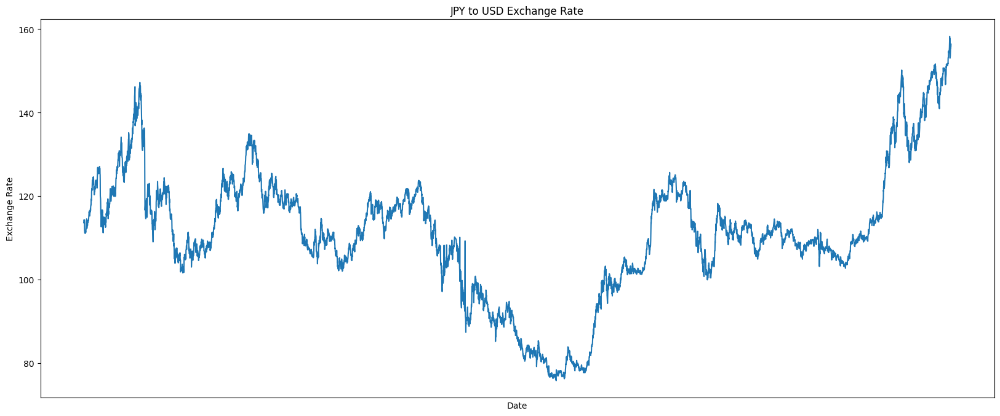

In [ ]:
# Load the time series data
series = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv', header=0, index_col=0, usecols=['Date', 'Close'])
series.index = pd.to_datetime(series.index, format='%Y/%m/%d')

# Print the first five rows of the dataset
print(series.head())

# Print the shape of the dataset
print(series.shape)

# Plot the time series data
plt.figure(figsize=(20, 8))
plt.plot(series)
plt.title('JPY to USD Exchange Rate')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.xticks([])
plt.show()

In [ ]:
# Custom train-test split function to avoid conflict with sklearn function
def custom_train_test_split(data, test_size):
    return data[:-test_size], data[-test_size:]

# Convert time series data to supervised learning format
def series_to_supervised(data, n_in, n_out=1):
    df = pd.DataFrame(data)
    cols = []
    cols += [df.shift(i) for i in range(n_in, 0, -1)]
    cols += [df.shift(-i) for i in range(n_out)]
    agg = pd.concat(cols, axis=1).dropna()
    return agg.values

# Calculate root mean squared error (RMSE)
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# Differencing function
def difference(data, order):
    return [data[i] - data[i - order] for i in range(order, len(data))]

In [ ]:
# Fit the model
def model_fit(train, config):
    n_input, n_nodes, n_epochs, n_batch, n_diff = config
    if n_diff > 0:
        train = difference(train, n_diff)
    data = series_to_supervised(train, n_in=n_input)
    train_x, train_y = data[:, :-1], data[:, -1]
    model = Sequential()
    model.add(Dense(n_nodes, activation='relu', input_dim=n_input))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)
    return model

# Make predictions with the model
def model_predict(model, history, config):
    n_input, _, _, _, n_diff = config
    correction = 0.0
    if n_diff > 0:
        correction = history[-n_diff]
        history = difference(history, n_diff)
    x_input = np.array(history[-n_input:]).reshape((1, n_input))
    yhat = model.predict(x_input, verbose=0)
    return correction + yhat[0]

In [ ]:
# Walk-forward validation
def walk_forward_validation(data, n_test, cfg):
    predictions = []
    train, test = custom_train_test_split(data, n_test)
    model = model_fit(train, cfg)
    history = list(train)
    for i in range(len(test)):
        yhat = model_predict(model, history, cfg)
        predictions.append(yhat)
        history.append(test[i])
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

# Repeat evaluation multiple times and return the average score
def repeat_evaluate(data, config, n_test, n_repeats=3):  # Reduced repeats to 3
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

# Perform grid search to evaluate configurations
def grid_search(data, cfg_list, n_test):
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores

In [ ]:
# Generate model configurations
def model_configs():
    n_input = [30, 60]  # Input sequence lengths for daily data
    n_nodes = [50, 100]  # Number of neurons in the hidden layer
    n_epochs = [10]  # Reduced number of training epochs to 10
    n_batch = [1]  # Batch size
    n_diff = [0, 12]  # Differencing orders

    # Create all possible combinations of configurations
    configs = [[i, j, k, l, m] for i in n_input for j in n_nodes for k in n_epochs for l in n_batch for m in n_diff]
    print('Total configs: %d' % len(configs))
    return configs

In [ ]:
# Define the dataset
data = series.values

# Split the data
n_test = 365  # Use the last year's data as the test set

# Get model configurations
cfg_list = model_configs()

# Perform grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List the top configurations
for cfg, error in scores[:3]:
    print(cfg, error)

Total configs: 8
 > 1.536
 > 1.283
 > 1.835
> Model[[30, 50, 10, 1, 0]] 1.551
 > 1.146
 > 1.153
 > 1.175
> Model[[30, 50, 10, 1, 12]] 1.158
 > 1.244
 > 2.117
 > 1.477
> Model[[30, 100, 10, 1, 0]] 1.612
 > 1.103
 > 1.208
 > 1.087
> Model[[30, 100, 10, 1, 12]] 1.132
 > 2.420
 > 2.431
 > 1.608
> Model[[60, 50, 10, 1, 0]] 2.153
 > 1.204
 > 1.140
 > 1.102
> Model[[60, 50, 10, 1, 12]] 1.149
 > 2.745
 > 3.563
 > 1.439
> Model[[60, 100, 10, 1, 0]] 2.582
 > 1.220
 > 1.087
 > 1.183
> Model[[60, 100, 10, 1, 12]] 1.163
done
[30, 100, 10, 1, 12] 1.1324755397354147
[60, 50, 10, 1, 12] 1.1488264045996488
[30, 50, 10, 1, 12] 1.1580824650673032


###CNN

In [ ]:
import numpy as np
import pandas as pd
from math import sqrt
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [ ]:
# Custom train-test split function to avoid conflict with sklearn function
def custom_train_test_split(data, test_size):
    return data[:-test_size], data[-test_size:]

# Convert time series data to supervised learning format
def series_to_supervised(data, n_in, n_out=1):
    df = pd.DataFrame(data)
    cols = []
    cols += [df.shift(i) for i in range(n_in, 0, -1)]
    cols += [df.shift(-i) for i in range(n_out)]
    agg = pd.concat(cols, axis=1).dropna()
    return agg.values

# Calculate root mean squared error (RMSE)
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# Differencing function
def difference(data, order):
    return [data[i] - data[i - order] for i in range(order, len(data))]

In [ ]:
# Fit the model with CNN layers
def model_fit(train, config):
    n_input, n_nodes, n_epochs, n_batch, n_diff = config
    if n_diff > 0:
        train = difference(train, n_diff)
    data = series_to_supervised(train, n_in=n_input)
    train_x, train_y = data[:, :-1], data[:, -1]
    train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))  # Reshape for Conv1D

    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(n_input, 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(n_nodes, activation='relu'))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)
    return model

# Make predictions with the CNN model
def model_predict(model, history, config):
    n_input, _, _, _, n_diff = config
    correction = 0.0
    if n_diff > 0:
        correction = history[-n_diff]
        history = difference(history, n_diff)
    x_input = np.array(history[-n_input:]).reshape((1, n_input, 1))  # Reshape for Conv1D
    yhat = model.predict(x_input, verbose=0)
    return correction + yhat[0]

In [ ]:
# Walk-forward validation
def walk_forward_validation(data, n_test, cfg):
    predictions = []
    train, test = custom_train_test_split(data, n_test)
    model = model_fit(train, cfg)
    history = list(train)
    for i in range(len(test)):
        yhat = model_predict(model, history, cfg)
        predictions.append(yhat)
        history.append(test[i])
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

# Repeat evaluation multiple times and return the average score
def repeat_evaluate(data, config, n_test, n_repeats=3):  # Reduced repeats to 3
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

# Perform grid search to evaluate configurations
def grid_search(data, cfg_list, n_test):
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores

In [ ]:
# Generate model configurations
def model_configs():
    n_input = [30, 60]  # Input sequence lengths for daily data
    n_nodes = [50, 100]  # Number of neurons in the hidden layer
    n_epochs = [10]  # Reduced number of training epochs to 10
    n_batch = [1]  # Batch size
    n_diff = [0, 12]  # Differencing orders

    # Create all possible combinations of configurations
    configs = [[i, j, k, l, m] for i in n_input for j in n_nodes for k in n_epochs for l in n_batch for m in n_diff]
    print('Total configs: %d' % len(configs))
    return configs

In [ ]:
# Define the dataset
data = series.values

# Split the data
n_test = 365  # Use the last year's data as the test set

# Get model configurations
cfg_list = model_configs()

# Perform grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List the top configurations
for cfg, error in scores[:3]:
    print(cfg, error)

Total configs: 8
 > 2.090
 > 1.632
 > 2.174
> Model[[30, 50, 10, 1, 0]] 1.965
 > 1.226
 > 1.178
 > 1.173
> Model[[30, 50, 10, 1, 12]] 1.192
 > 1.872
 > 2.186
 > 1.399
> Model[[30, 100, 10, 1, 0]] 1.819
 > 1.176
 > 1.207
 > 1.203
> Model[[30, 100, 10, 1, 12]] 1.195
 > 1.877
 > 2.050
 > 1.661
> Model[[60, 50, 10, 1, 0]] 1.863
 > 1.165
 > 1.166
 > 1.409
> Model[[60, 50, 10, 1, 12]] 1.247
 > 1.526
 > 3.273
 > 1.594
> Model[[60, 100, 10, 1, 0]] 2.131
 > 1.155
 > 1.217
 > 1.190
> Model[[60, 100, 10, 1, 12]] 1.187
done
[60, 100, 10, 1, 12] 1.18740802307463
[30, 50, 10, 1, 12] 1.1922818248123397
[30, 100, 10, 1, 12] 1.1953154233913181


###LSTM

In [ ]:
import numpy as np
import pandas as pd
from math import sqrt
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

                 Close
Date                  
1996-10-30  114.180000
1996-11-01  113.500000
1996-11-04  113.879997
1996-11-05  114.250000
1996-11-06  113.949997
(7142, 1)


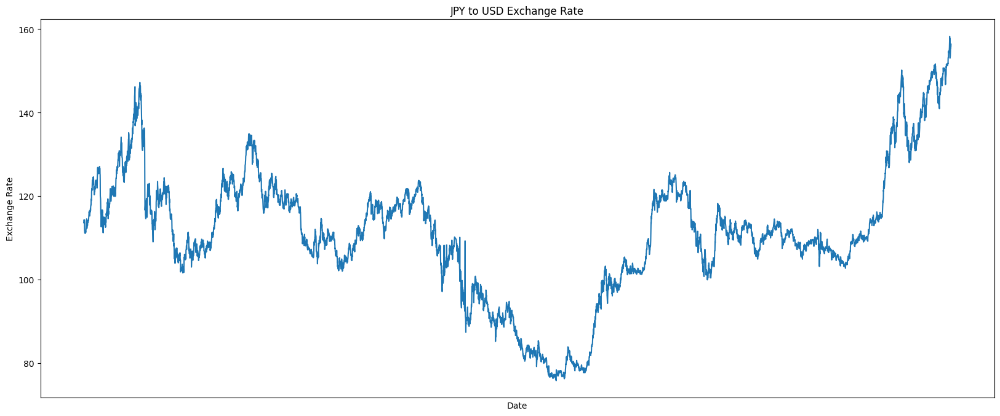

In [ ]:
# Load the time series data
series = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv', header=0, index_col=0, usecols=['Date', 'Close'])
series.index = pd.to_datetime(series.index, format='%Y/%m/%d')

# Drop rows with NaN values
series = series.dropna()

# Ensure data is float32 for LSTM compatibility
series = series.astype('float32')

# Print the first five rows of the dataset
print(series.head())

# Print the shape of the dataset
print(series.shape)

# Plot the time series data
plt.figure(figsize=(20, 8))
plt.plot(series)
plt.title('JPY to USD Exchange Rate')
plt.xlabel('Date')
plt.ylabel('Exchange Rate')
plt.xticks([])
plt.show()

In [ ]:
# Custom train-test split function to avoid conflict with sklearn function
def custom_train_test_split(data, test_size):
    return data[:-test_size], data[-test_size:]

# Convert time series data to supervised learning format
def series_to_supervised(data, n_in, n_out=1):
    df = pd.DataFrame(data)
    cols = []
    cols += [df.shift(i) for i in range(n_in, 0, -1)]
    cols += [df.shift(-i) for i in range(n_out)]
    agg = pd.concat(cols, axis=1).dropna()
    return agg.values

# Calculate root mean squared error (RMSE)
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# Differencing function
def difference(data, order):
    return [data[i] - data[i - order] for i in range(order, len(data))]


In [ ]:
# Fit the model with LSTM layers
def model_fit(train, config):
    n_input, n_nodes, n_epochs, n_batch, n_diff = config
    if n_diff > 0:
        train = difference(train, n_diff)
    data = series_to_supervised(train, n_in=n_input)
    train_x, train_y = data[:, :-1], data[:, -1]
    train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))  # Reshape for LSTM

    model = Sequential()
    model.add(LSTM(n_nodes, activation='tanh', recurrent_activation='sigmoid', input_shape=(n_input, 1)))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)
    return model

# Make predictions with the LSTM model
def model_predict(model, history, config):
    n_input, _, _, _, n_diff = config
    correction = 0.0
    if n_diff > 0:
        correction = history[-n_diff]
        history = difference(history, n_diff)
    x_input = np.array(history[-n_input:]).reshape((1, n_input, 1))  # Reshape for LSTM
    yhat = model.predict(x_input, verbose=0)
    return correction + yhat[0]

In [ ]:
# Walk-forward validation
def walk_forward_validation(data, n_test, cfg):
    predictions = []
    train, test = custom_train_test_split(data, n_test)
    model = model_fit(train, cfg)
    history = list(train)
    for i in range(len(test)):
        yhat = model_predict(model, history, cfg)
        predictions.append(yhat)
        history.append(test[i])
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

# Repeat evaluation multiple times and return the average score
def repeat_evaluate(data, config, n_test, n_repeats=3):  # Reduced repeats to 3
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

# Perform grid search to evaluate configurations
def grid_search(data, cfg_list, n_test):
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores

In [ ]:
# Generate model configurations
def model_configs():
    n_input = [30, 60]  # Input sequence lengths for daily data
    n_nodes = [50, 100]  # Number of neurons in the LSTM layer
    n_epochs = [10]  # Reduced number of training epochs to 10
    n_batch = [32]  # Batch size set to 32 to meet cuDNN requirements
    n_diff = [0, 12]  # Differencing orders

    # Create all possible combinations of configurations
    configs = [[i, j, k, l, m] for i in n_input for j in n_nodes for k in n_epochs for l in n_batch for m in n_diff]
    print('Total configs: %d' % len(configs))
    return configs

In [ ]:
# Define the dataset
data = series.values

# Split the data
n_test = 365  # Use the last year's data as the test set

# Get model configurations
cfg_list = model_configs()

# Perform grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List the top configurations
for cfg, error in scores[:3]:
    print(cfg, error)

Total configs: 8
 > 66.010
 > 74.974
 > 65.092
> Model[[30, 50, 10, 32, 0]] 68.692
 > 1.207
 > 1.199
 > 1.211
> Model[[30, 50, 10, 32, 12]] 1.205
 > 34.675
 > 31.568
 > 32.096
> Model[[30, 100, 10, 32, 0]] 32.780
 > 1.191
 > 1.192
 > 1.208
> Model[[30, 100, 10, 32, 12]] 1.197
 > 74.106
 > 68.355
 > 70.128
> Model[[60, 50, 10, 32, 0]] 70.863
 > 1.168
 > 1.178
 > 1.181
> Model[[60, 50, 10, 32, 12]] 1.176
 > 32.839
 > 33.419
 > 37.827
> Model[[60, 100, 10, 32, 0]] 34.695
 > 1.194
 > 1.181
 > 1.170
> Model[[60, 100, 10, 32, 12]] 1.181
done
[60, 50, 10, 32, 12] 1.1756443728281518
[60, 100, 10, 32, 12] 1.1814748257620034
[30, 100, 10, 32, 12] 1.1970591698194186


# Classification


### Load Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import os

### Load the Dataset

In [ ]:
# Load the dataset
def load_file(filepath):
    dataframe = pd.read_csv(filepath)
    return dataframe

data = load_file('/content/drive/My Drive/JPY_Japanese-Yen.csv')
data.head()

,Date,Open,High,Low,Close,Volume
0,1996/10/30,114.370003,114.480003,113.610001,114.180000,0
1,1996/11/1,113.500000,113.500000,113.500000,113.500000,0
2,1996/11/4,113.279999,113.980003,112.949997,113.879997,0
3,1996/11/5,113.709999,114.330002,113.449997,114.250000,0
4,1996/11/6,114.230003,114.680000,113.650002,113.949997,0


### Preprocess Data

-It uses the apply method on the 'Close' column to categorize the 'Close' values into three classes:

Class 0: If 'Close' value is less than 110.

Class 1: If 'Close' value is between 110 and 130 (inclusive).

Class 2: If 'Close' value is greater than 130.


In [ ]:
# Preprocess data and generate features and labels
def preprocess_data(df):
    df['Class'] = df['Close'].apply(lambda x: 0 if x < 110 else (2 if x > 130 else 1))
    features = df[['Open', 'High', 'Low', 'Close', 'Volume']].values
    labels = df['Class'].values
    return train_test_split(features, labels, test_size=0.3, random_state=42), df

(X_train, X_test, y_train, y_test), data = preprocess_data(data)

### Save Processed Data

In [ ]:
# Save processed data
def save_processed_data(X_train, y_train, X_test, y_test, output_dir):
    np.savetxt(os.path.join(output_dir, 'X_train.csv'), X_train, delimiter=',')
    np.savetxt(os.path.join(output_dir, 'y_train.csv'), y_train, delimiter=',')
    np.savetxt(os.path.join(output_dir, 'X_test.csv'), X_test, delimiter=',')
    np.savetxt(os.path.join(output_dir, 'y_test.csv'), y_test, delimiter=',')

save_processed_data(X_train, y_train, X_test, y_test, '/content/drive/My Drive/ProcessedData')

### Load Processed Data

In [ ]:
# Load processed data
def load_processed_data(output_dir):
    X_train = np.loadtxt(os.path.join(output_dir, 'X_train.csv'), delimiter=',')
    y_train = np.loadtxt(os.path.join(output_dir, 'y_train.csv'), delimiter=',')
    X_test = np.loadtxt(os.path.join(output_dir, 'X_test.csv'), delimiter=',')
    y_test = np.loadtxt(os.path.join(output_dir, 'y_test.csv'), delimiter=',')
    return X_train, y_train, X_test, y_test

X_train, y_train, X_test, y_test = load_processed_data('/content/drive/My Drive/ProcessedData')

### Define Models

-The define_models function performs the following tasks:

Initializes a dictionary to store various machine
learning classification models.
Instantiates multiple classifiers with specific
configurations:
K-Nearest Neighbors

Decision Tree

Support Vector Machine

Gaussian Naive Bayes

Random Forest

Extra Trees

Gradient Boosting Machine

Stores each classifier in the dictionary with a descriptive key.

Returns the dictionary of models.


In [ ]:
# Define models
def define_models(models=dict()):
    models['knn'] = KNeighborsClassifier(n_neighbors=7)
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier(n_estimators=100)
    models['et'] = ExtraTreesClassifier(n_estimators=100)
    models['gbm'] = GradientBoostingClassifier(n_estimators=100)
    return models

models = define_models()

### Evaluate Models

In [ ]:
# Evaluate a single model
def evaluate_model(X_train, y_train, X_test, y_test, model):
    model.fit(X_train, y_train)
    yhat = model.predict(X_test)
    accuracy = accuracy_score(y_test, yhat)
    precision = precision_score(y_test, yhat, average='weighted', zero_division=1)
    recall = recall_score(y_test, yhat, average='weighted', zero_division=1)
    f1 = f1_score(y_test, yhat, average='weighted', zero_division=1)
    return accuracy * 100.0, precision * 100.0, recall * 100.0, f1 * 100.0, yhat

# Evaluate all models
def evaluate_models(X_train, y_train, X_test, y_test, models):
    results = {}
    y_pred_dict = {}
    for name, model in models.items():
        accuracy, precision, recall, f1, yhat = evaluate_model(X_train, y_train, X_test, y_test, model)
        results[name] = (accuracy, precision, recall, f1)
        y_pred_dict[name] = yhat
        print(f'>{name}: Accuracy={accuracy:.3f}, Precision={precision:.3f}, Recall={recall:.3f}, F1 Score={f1:.3f}')
    return results, y_pred_dict

results, y_pred_dict = evaluate_models(X_train, y_train, X_test, y_test, models)

>knn: Accuracy=99.580, Precision=99.583, Recall=99.580, F1 Score=99.581
>cart: Accuracy=99.953, Precision=99.954, Recall=99.953, F1 Score=99.953
>svm: Accuracy=97.853, Precision=97.932, Recall=97.853, F1 Score=97.846
>bayes: Accuracy=96.687, Precision=96.874, Recall=96.687, F1 Score=96.722
>rf: Accuracy=99.953, Precision=99.954, Recall=99.953, F1 Score=99.953
>et: Accuracy=99.813, Precision=99.814, Recall=99.813, F1 Score=99.813
>gbm: Accuracy=99.953, Precision=99.954, Recall=99.953, F1 Score=99.953


### Plot Exchange Rate Over Time

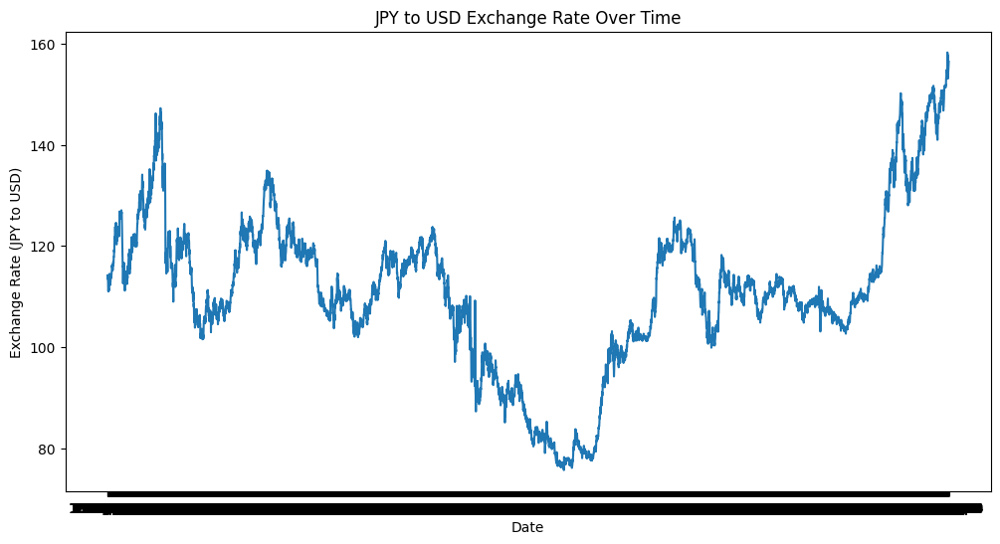

In [ ]:
# Plot the exchange rate over time
def plot_time_series(df):
    if isinstance(df, pd.DataFrame):
        plt.figure(figsize=(12, 6))
        plt.plot(df['Date'], df['Close'])
        plt.title('JPY to USD Exchange Rate Over Time')
        plt.xlabel('Date')
        plt.ylabel('Exchange Rate (JPY to USD)')
        plt.show()
    else:
        print("Error: Input data is not a DataFrame")

plot_time_series(data)

### Plot Exchange Rate Distribution


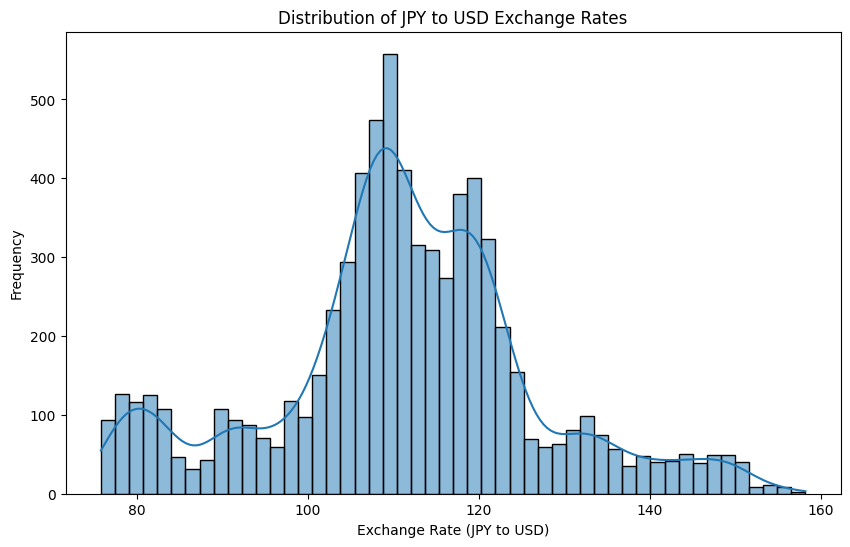

In [ ]:
# Plot the distribution of exchange rates
def plot_exchange_rate_distribution(df):
    if isinstance(df, pd.DataFrame):
        plt.figure(figsize=(10, 6))
        sns.histplot(df['Close'], bins=50, kde=True)
        plt.title('Distribution of JPY to USD Exchange Rates')
        plt.xlabel('Exchange Rate (JPY to USD)')
        plt.ylabel('Frequency')
        plt.show()
    else:
        print("Error: Input data is not a DataFrame")

plot_exchange_rate_distribution(data)

###Plot Class Distribution


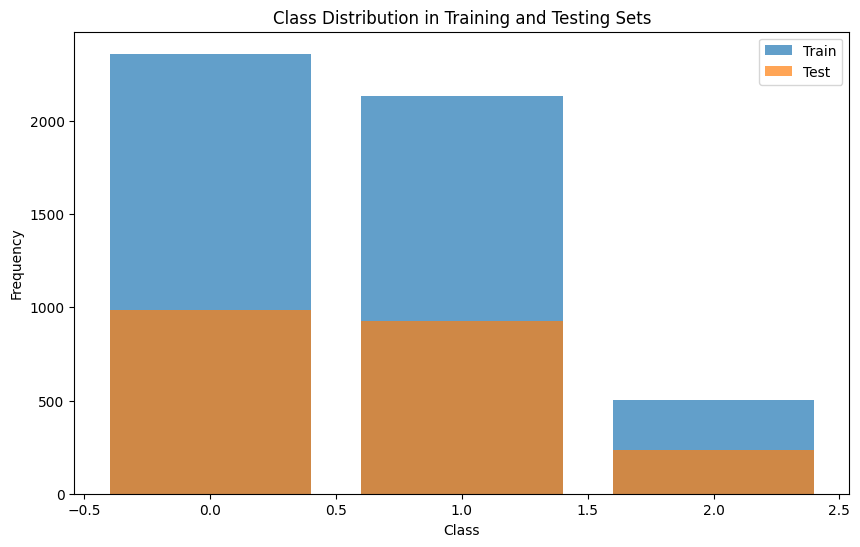

In [ ]:
# Plot class distribution
def class_distribution(y):
    unique, counts = np.unique(y, return_counts=True)
    return dict(zip(unique, counts))

def plot_class_distribution(y_train, y_test):
    train_dist = class_distribution(y_train)
    test_dist = class_distribution(y_test)

    plt.figure(figsize=(10, 6))
    plt.bar(train_dist.keys(), train_dist.values(), alpha=0.7, label='Train')
    plt.bar(test_dist.keys(), test_dist.values(), alpha=0.7, label='Test')
    plt.title('Class Distribution in Training and Testing Sets')
    plt.xlabel('Class')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

plot_class_distribution(y_train, y_test)

### Plot Confusion Matrix for Each Model

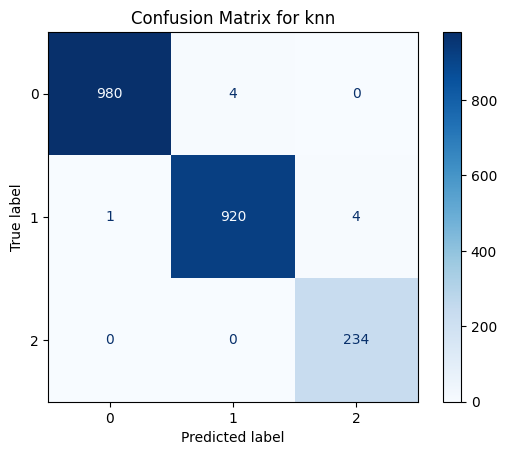

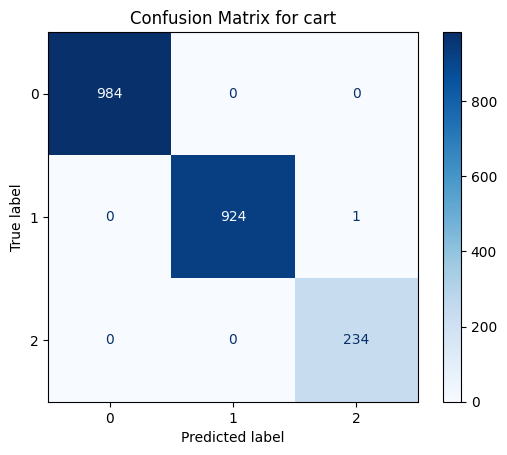

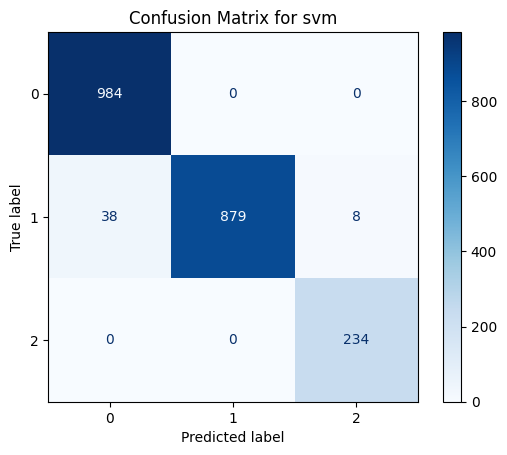

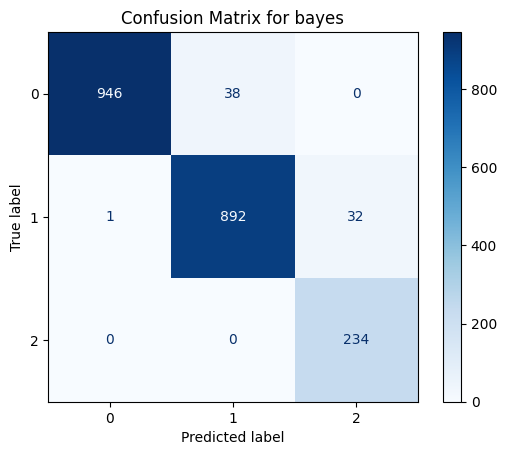

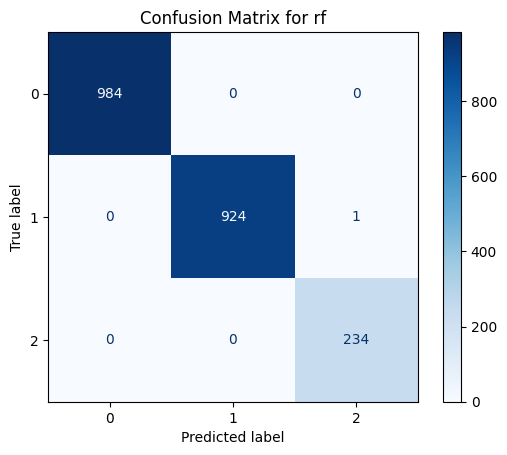

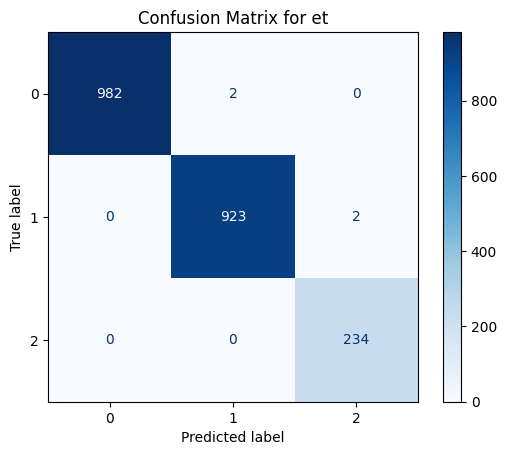

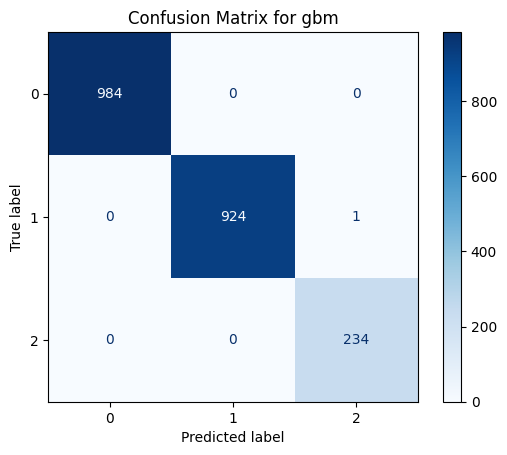

In [ ]:
# Plot confusion matrix
def plot_confusion_matrix(y_test, y_pred, model_name):
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

for model_name, y_pred in y_pred_dict.items():
    plot_confusion_matrix(y_test, y_pred, model_name)

### Generate Classification Report for Each Model


In [ ]:
# Generate classification report
def classification_report_table(results):
    report = pd.DataFrame.from_dict(results, orient='index', columns=['Accuracy', 'Precision', 'Recall', 'F1 Score'])
    return report

report = classification_report_table(results)
report.to_csv('/content/drive/My Drive/ProcessedData/classification_report.csv', index=True)
report

,Accuracy,Precision,Recall,F1 Score
knn,99.580028,99.582820,99.580028,99.580527
cart,99.953336,99.953535,99.953336,99.953374
svm,97.853476,97.931749,97.853476,97.846042
bayes,96.686888,96.874235,96.686888,96.721701
rf,99.953336,99.953535,99.953336,99.953374
et,99.813346,99.814137,99.813346,99.813497
gbm,99.953336,99.953535,99.953336,99.953374


# Prophet


In [ ]:
# Import necessary libraries
import pandas as pd
from prophet import Prophet
from prophet.plot import plot_plotly, add_changepoints_to_plot, plot_components_plotly, plot_forecast_component, plot_yearly
import matplotlib.pyplot as plt


### Load the dataset


In [ ]:
df = pd.read_csv('/content/drive/My Drive/JPY_Japanese-Yen.csv', usecols=['Date', 'Close'])

# Rename columns to fit Prophet's requirements
df.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)
df['ds'] = pd.to_datetime(df['ds'])

# Display the first few rows of the dataframe
print(df.head())

          ds           y
0 1996-10-30  114.180000
1 1996-11-01  113.500000
2 1996-11-04  113.879997
3 1996-11-05  114.250000
4 1996-11-06  113.949997


### Descriptive statistics


In [ ]:
print(df.describe())

                                  ds            y
count                           7142  7142.000000
mean   2010-08-18 00:31:27.202464256   111.131425
min              1996-10-30 00:00:00    75.739998
25%              2003-09-23 06:00:00   104.232002
50%              2010-08-30 12:00:00   110.870502
75%              2017-07-05 18:00:00   119.627253
max              2024-05-14 00:00:00   158.223999
std                              NaN    15.484989




### Define key events and their impacts to be used as changepoints




In [ ]:
events = [
    '1997-07-02',  # Asian Financial Crisis
    '2008-09-15',  # Lehman Brothers Collapse
    '2011-03-11',  # Japan Earthquake
    '2013-04-04',  # BOJ QQE Policy
    '2016-06-23',  # Brexit Vote
    '2020-03-11',  # COVID-19 Pandemic
    '2020-11-03',  # US Presidential Election
    '2021-12-01',  # Omicron Variant
    '2024-02-14',  # US Economic Data Strong
    '2024-03-15',  # Japan GDP Below Expectations
    '2024-04-18',  # Japan Trade Deficit Widens
    '2024-04-26',  # BOJ Policy Adjustment
    '2024-05-10',  # Fed Rate Hike
]

### Instantiate the Prophet model and add Japanese holidays


In [ ]:
m = Prophet(changepoints=events)
m.add_country_holidays(country_name='JP')

# Fit the model
m.fit(df)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/v5jvz4c_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/3p14fo73.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26539', 'data', 'file=/tmp/tmpdy1i677y/v5jvz4c_.json', 'init=/tmp/tmpdy1i677y/3p14fo73.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modeleklq0xww/prophet_model-20240716181138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:11:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:11:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


### Generate a future dataframe and make predictions


In [ ]:
# Generate a future dataframe and make predictions
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

# Display the last few rows of the forecast dataframe
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())

             ds        yhat  yhat_lower  yhat_upper
7502 2025-05-10  166.986411  157.668326  175.808704
7503 2025-05-11  167.026452  158.085837  175.931707
7504 2025-05-12  171.351249  161.502226  180.429094
7505 2025-05-13  171.380741  162.426024  181.022105
7506 2025-05-14  171.405237  161.932241  180.364582


### Plot the forecast and add changepoints


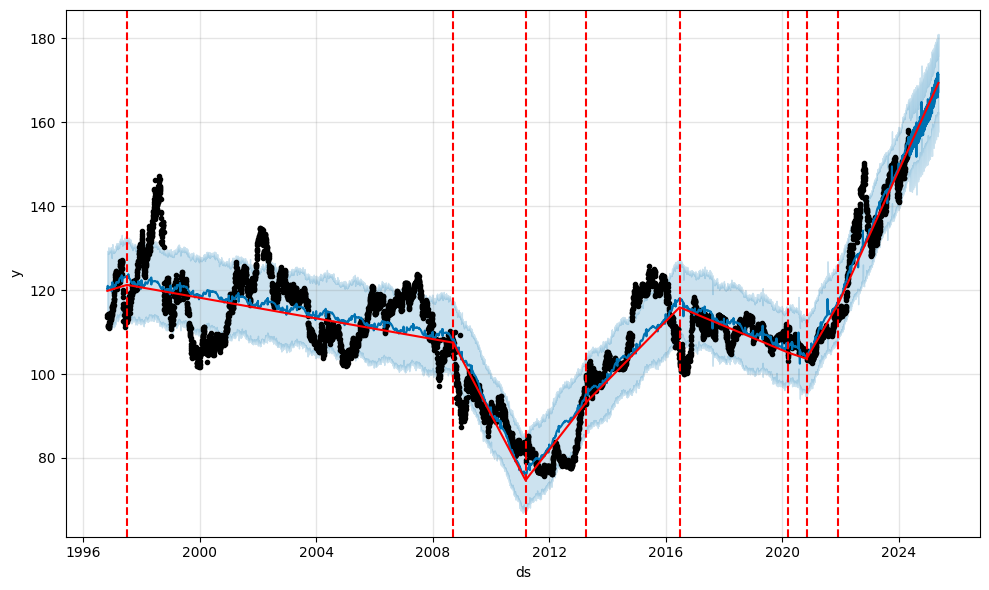

In [ ]:
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
plt.show()

### Plot the forecast components (trend, seasonality, holidays)


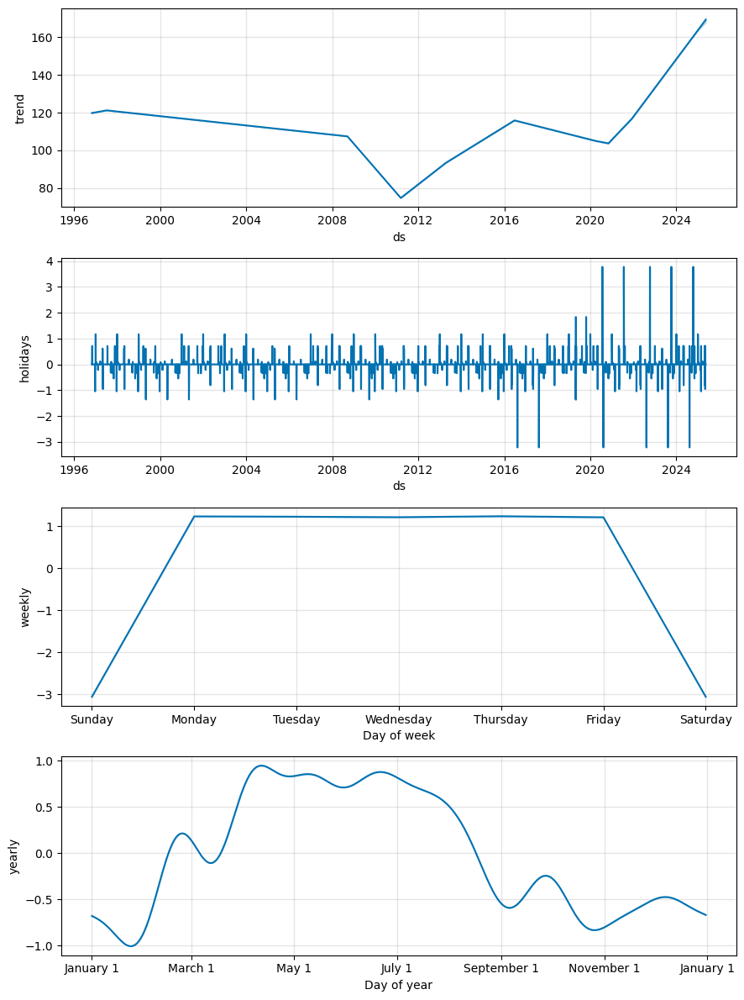

In [ ]:
fig2 = m.plot_components(forecast)
plt.show()

### Interactive plot of the forecast


In [ ]:
plot_plotly(m, forecast)

### Interactive plot of the forecast components


In [ ]:
plot_components_plotly(m, forecast)

### Using logistic growth model for forecasting



INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ae7_spxf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/bn68knoy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10424', 'data', 'file=/tmp/tmpdy1i677y/ae7_spxf.json', 'init=/tmp/tmpdy1i677y/bn68knoy.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelefn_vo_8/prophet_model-20240716181207.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:12:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:12:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


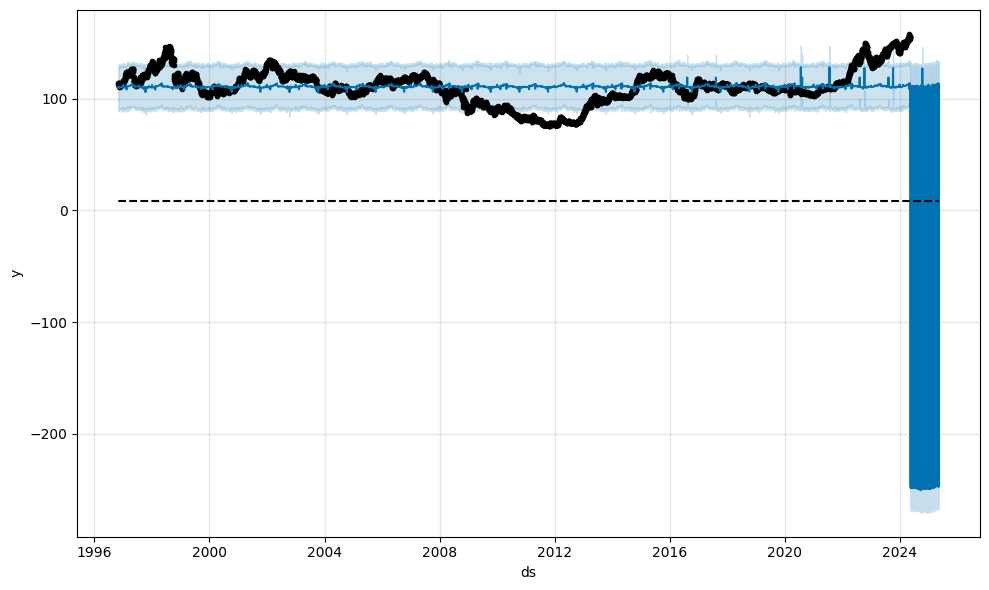

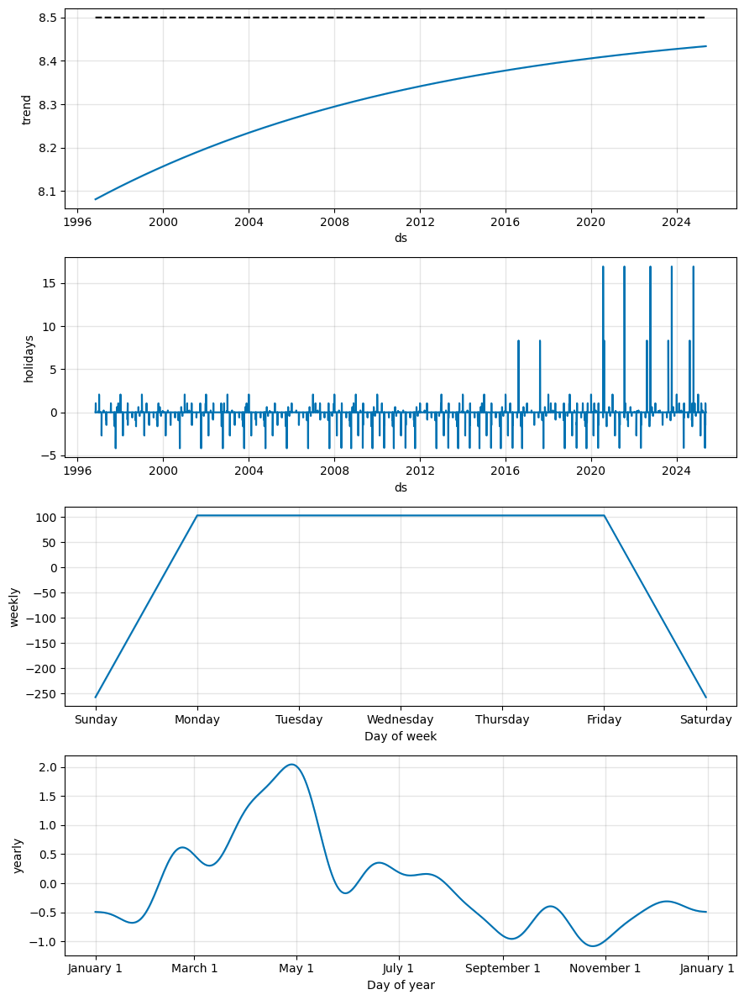

In [ ]:
df['cap'] = 8.5
m = Prophet(growth='logistic', changepoints=events)
m.add_country_holidays(country_name='JP')
m.fit(df)
future['cap'] = 8.5
fcst = m.predict(future)

# Plot the forecast
fig3 = m.plot(fcst)
plt.show()

# Plot forecast components
fig4 = m.plot_components(fcst)
plt.show()

### More flexible trend


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/lz188tda.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/mrf10og6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50253', 'data', 'file=/tmp/tmpdy1i677y/lz188tda.json', 'init=/tmp/tmpdy1i677y/mrf10og6.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model8lav9j2f/prophet_model-20240716181319.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:13:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:13:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


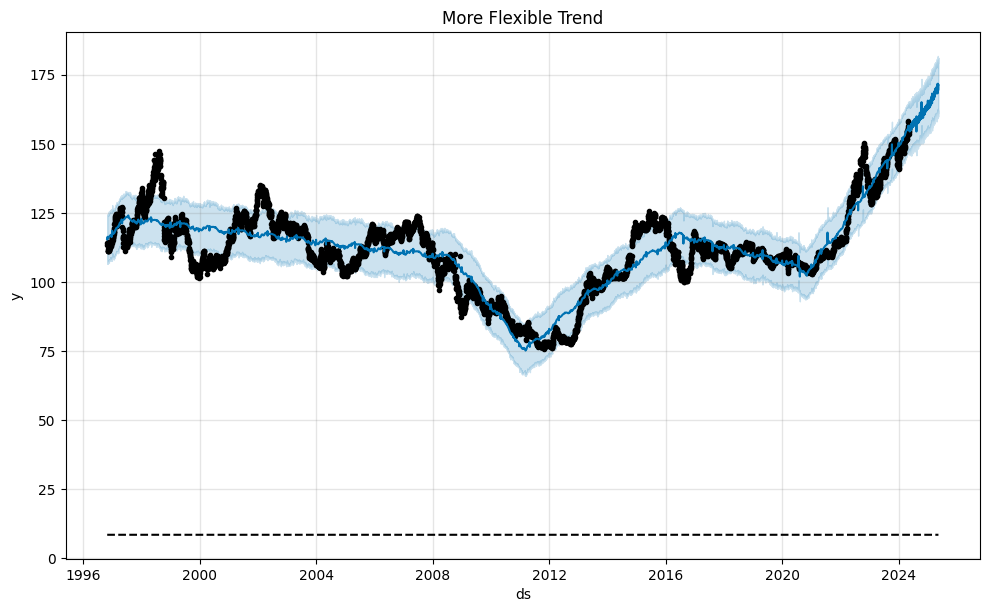

In [ ]:
# More flexible trend
m = Prophet(changepoint_prior_scale=0.5, changepoints=events)
m.add_country_holidays(country_name='JP')
m.fit(df)
forecast = m.predict(future)
fig5 = m.plot(forecast)
plt.title('More Flexible Trend')
plt.show()

### Less flexible trend



INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/cuuftnaj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/sq71712m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13900', 'data', 'file=/tmp/tmpdy1i677y/cuuftnaj.json', 'init=/tmp/tmpdy1i677y/sq71712m.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model82cua4ml/prophet_model-20240716181331.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:13:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:13:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


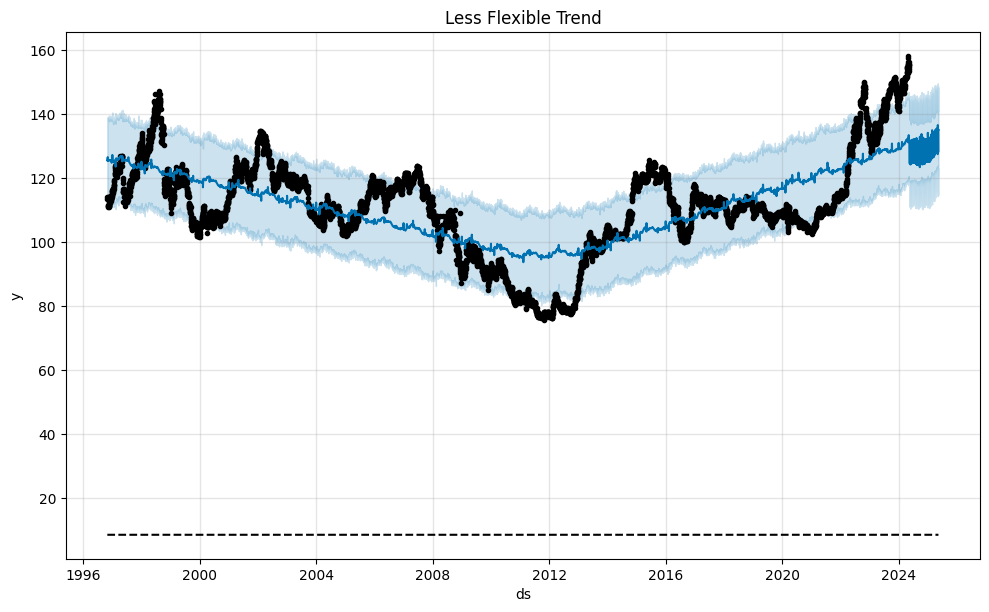

In [ ]:
m = Prophet(changepoint_prior_scale=0.001, changepoints=events)
m.add_country_holidays(country_name='JP')
m.fit(df)
forecast = m.predict(future)
fig6 = m.plot(forecast)
plt.title('Less Flexible Trend')
plt.show()

### Manually specified changepoints


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/u6ierbqy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/q81nhk45.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19228', 'data', 'file=/tmp/tmpdy1i677y/u6ierbqy.json', 'init=/tmp/tmpdy1i677y/q81nhk45.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelf3m7a0ay/prophet_model-20240716181449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:14:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:14:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


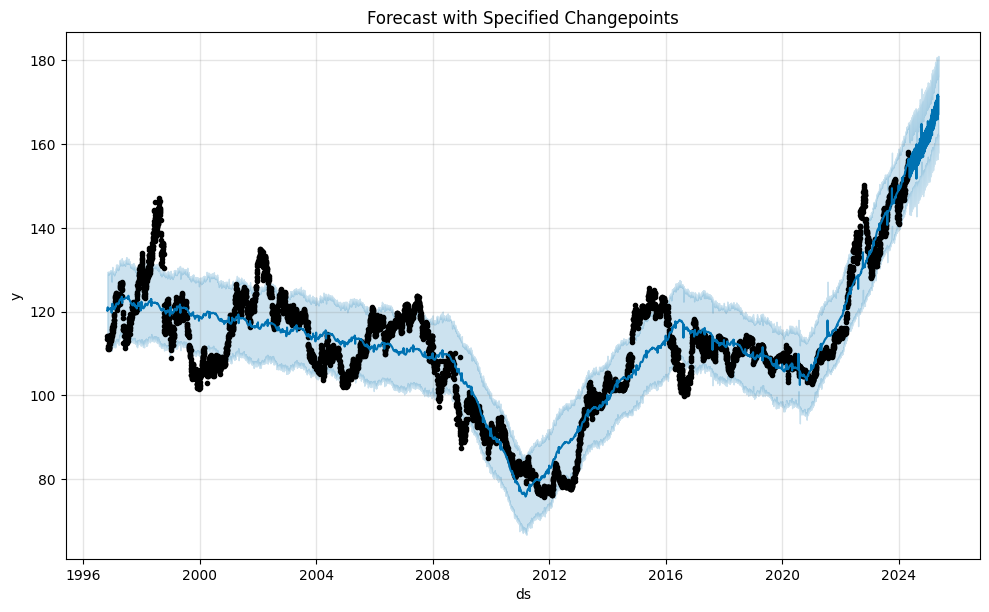

In [ ]:
# Define significant events as changepoints
changepoints = [
    '1997-07-02',  # Asian Financial Crisis
    '2008-09-15',  # Lehman Brothers Collapse
    '2011-03-11',  # Japan Earthquake
    '2013-04-04',  # BOJ QQE Policy
    '2016-06-23',  # Brexit Vote
    '2020-03-11',  # COVID-19 Pandemic
    '2020-11-03',  # US Presidential Election
    '2021-12-01',  # Omicron Variant
    '2024-02-14',  # US Economic Data Strong
    '2024-03-15',  # Japan GDP Below Expectations
    '2024-04-18',  # Japan Trade Deficit Widens
    '2024-04-26',  # BOJ Policy Adjustment
    '2024-05-10',  # Fed Rate Hike
]

# Instantiate Prophet and add country holidays for Japan
m = Prophet(changepoints=changepoints)
m.add_country_holidays(country_name='JP')

# Fit the model
m.fit(df)

# Make future dataframe
future = m.make_future_dataframe(periods=365)

# Make predictions
forecast = m.predict(future)

# Plot the forecast
fig = m.plot(forecast)
plt.title('Forecast with Specified Changepoints')
plt.show()


### Add country holidays and plot components


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/7yk7veab.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/nqzt5n8b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27940', 'data', 'file=/tmp/tmpdy1i677y/7yk7veab.json', 'init=/tmp/tmpdy1i677y/nqzt5n8b.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelkb_f1nqv/prophet_model-20240716163255.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:32:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


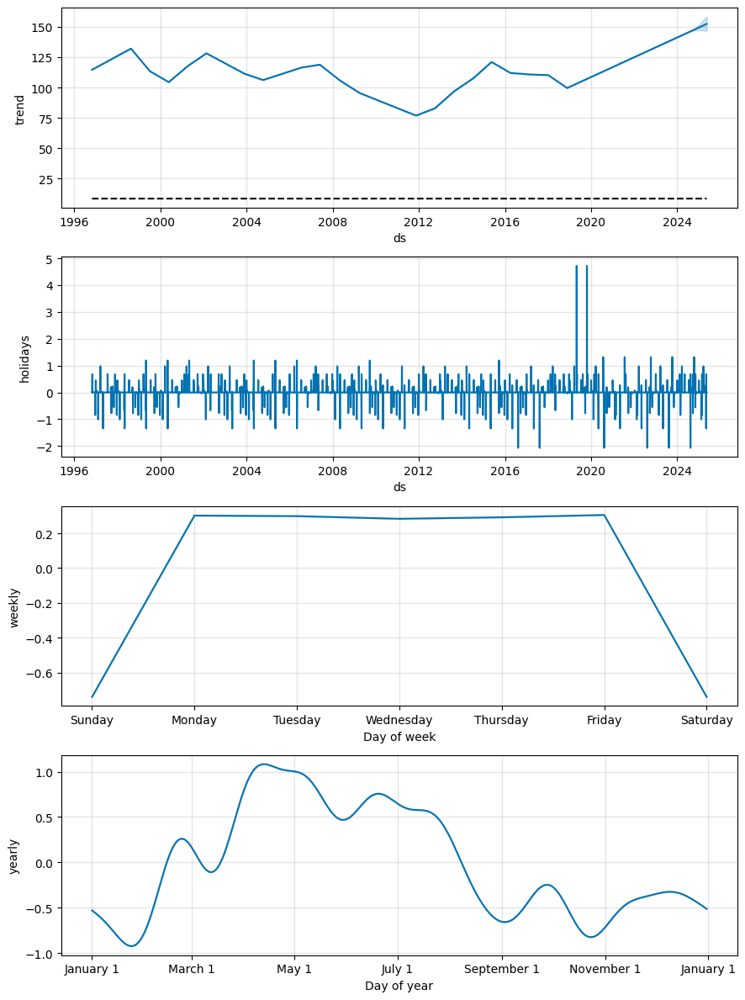

In [ ]:
m = Prophet()
m.add_country_holidays(country_name='JP')
m.fit(df)
forecast = m.predict(future)
fig8 = m.plot_components(forecast)
plt.show()


### Plot yearly seasonality with default Fourier order


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/3h5ys6it.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/93bsu190.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95837', 'data', 'file=/tmp/tmpdy1i677y/3h5ys6it.json', 'init=/tmp/tmpdy1i677y/93bsu190.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model_0pm3wux/prophet_model-20240716163308.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


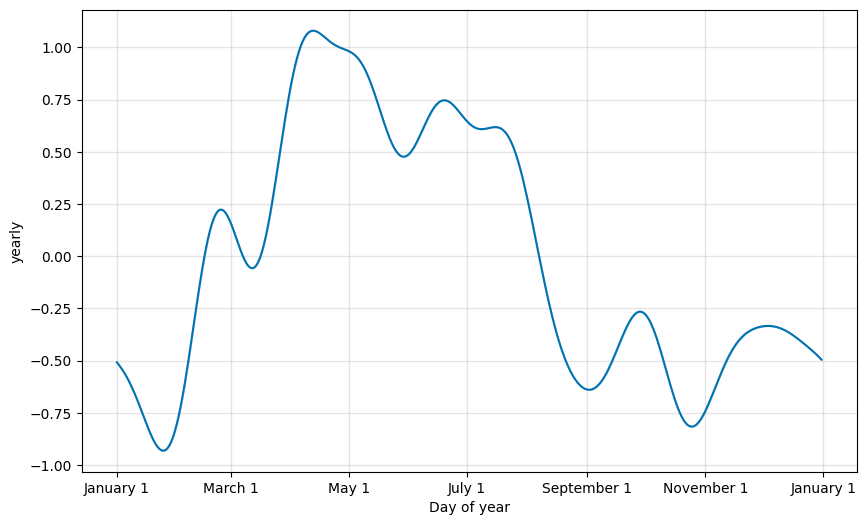

In [ ]:
m = Prophet().fit(df)
fig9 = plot_yearly(m)
plt.show()

### Plot yearly seasonality with increased Fourier order


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ua_o35bd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/by7dfh7x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35081', 'data', 'file=/tmp/tmpdy1i677y/ua_o35bd.json', 'init=/tmp/tmpdy1i677y/by7dfh7x.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model3zygyf8b/prophet_model-20240716163315.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


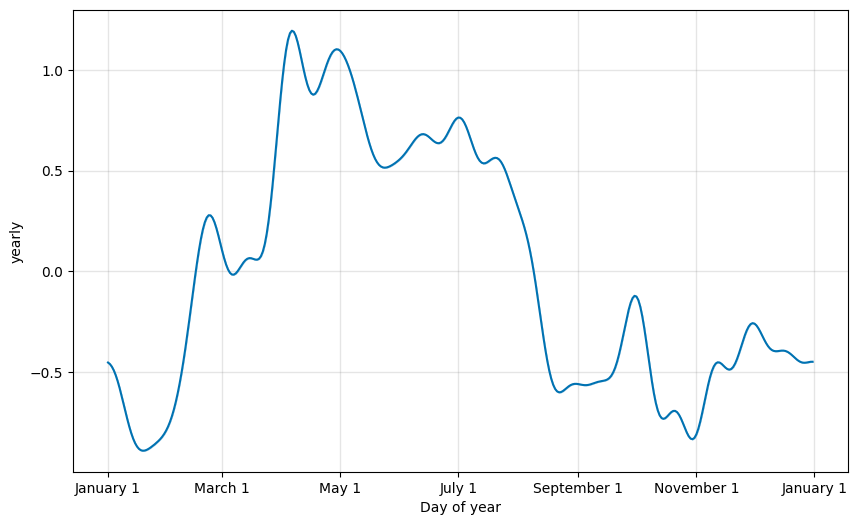

In [ ]:
m = Prophet(yearly_seasonality=20).fit(df)
fig10 = plot_yearly(m)
plt.show()

### Specify monthly seasonality and plot components


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/y880egcu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/kw1pikxg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44258', 'data', 'file=/tmp/tmpdy1i677y/y880egcu.json', 'init=/tmp/tmpdy1i677y/kw1pikxg.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modele4ntqblk/prophet_model-20240716163324.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


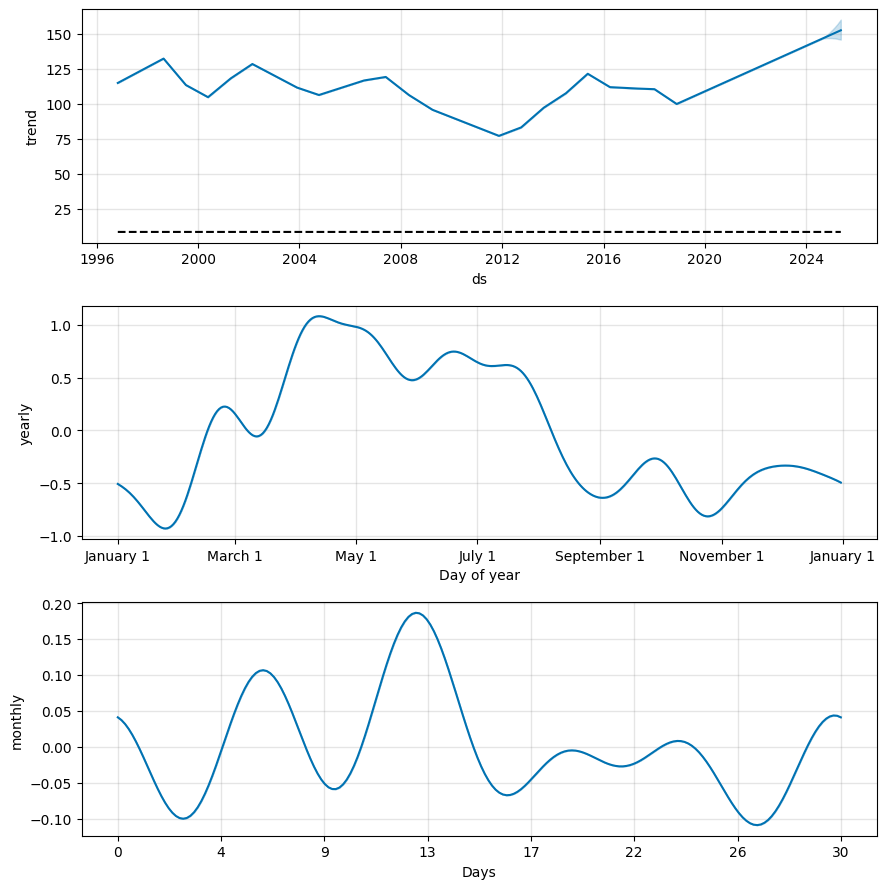

In [ ]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(df)
forecast = m.predict(future)
fig11 = m.plot_components(forecast)
plt.show()

### Define and apply NFL season function


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/6n010auh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/t4ie5ne5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71320', 'data', 'file=/tmp/tmpdy1i677y/6n010auh.json', 'init=/tmp/tmpdy1i677y/t4ie5ne5.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model9yrw8ipq/prophet_model-20240716163334.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


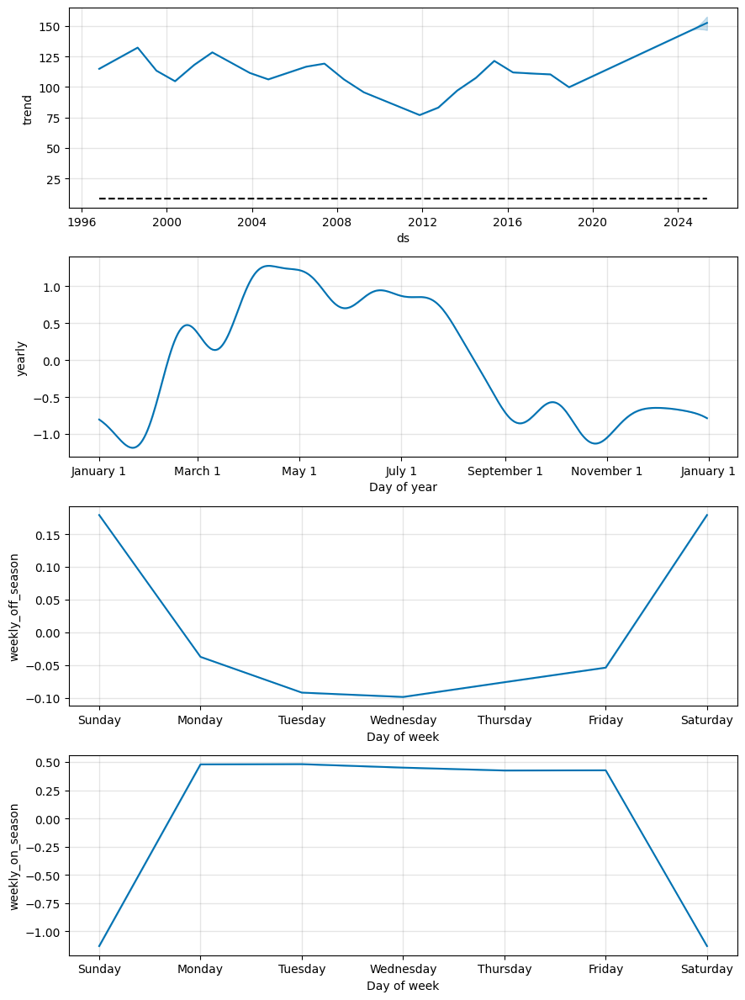

In [ ]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 8 or date.month < 2)

# Apply NFL season function
df['on_season'] = df['ds'].apply(is_nfl_season)
df['off_season'] = ~df['ds'].apply(is_nfl_season)

# Initialize Prophet model and add seasonality
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
m.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

# Fit the model and make predictions
m.fit(df)
future['on_season'] = future['ds'].apply(is_nfl_season)
future['off_season'] = ~future['ds'].apply(is_nfl_season)
forecast = m.predict(future)
fig12 = m.plot_components(forecast)
plt.show()

### Forecast using multiplicative seasonality model


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/4yuol4o3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/nj4zkc32.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46536', 'data', 'file=/tmp/tmpdy1i677y/4yuol4o3.json', 'init=/tmp/tmpdy1i677y/nj4zkc32.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modeliih4cs8m/prophet_model-20240716163346.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


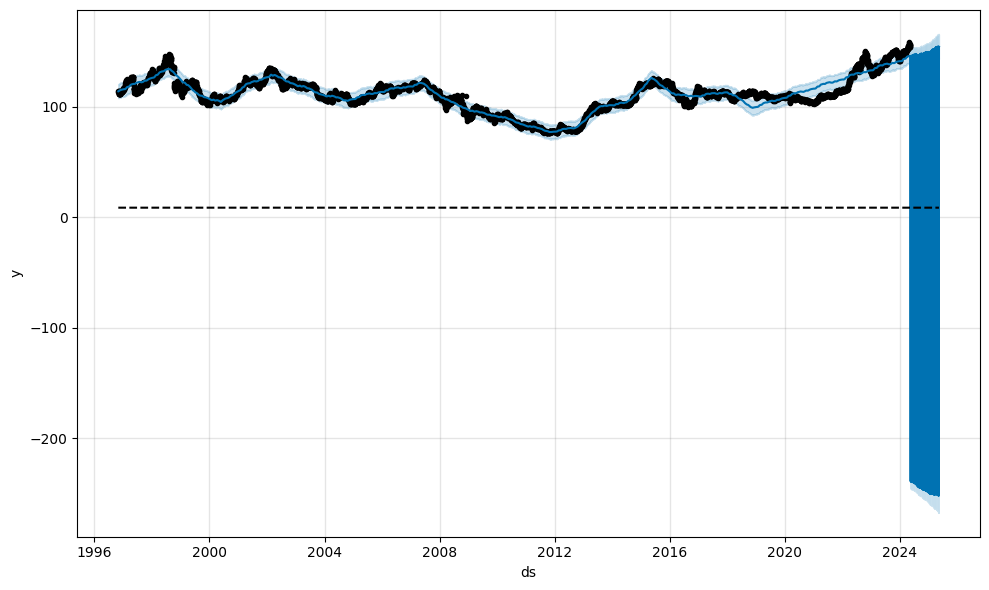

In [ ]:
# Forecast using multiplicative seasonality model
m = Prophet(seasonality_mode='multiplicative')
m.fit(df)
forecast = m.predict(future)
fig13 = m.plot(forecast)
plt.show()

### Plot components of the multiplicative seasonality model


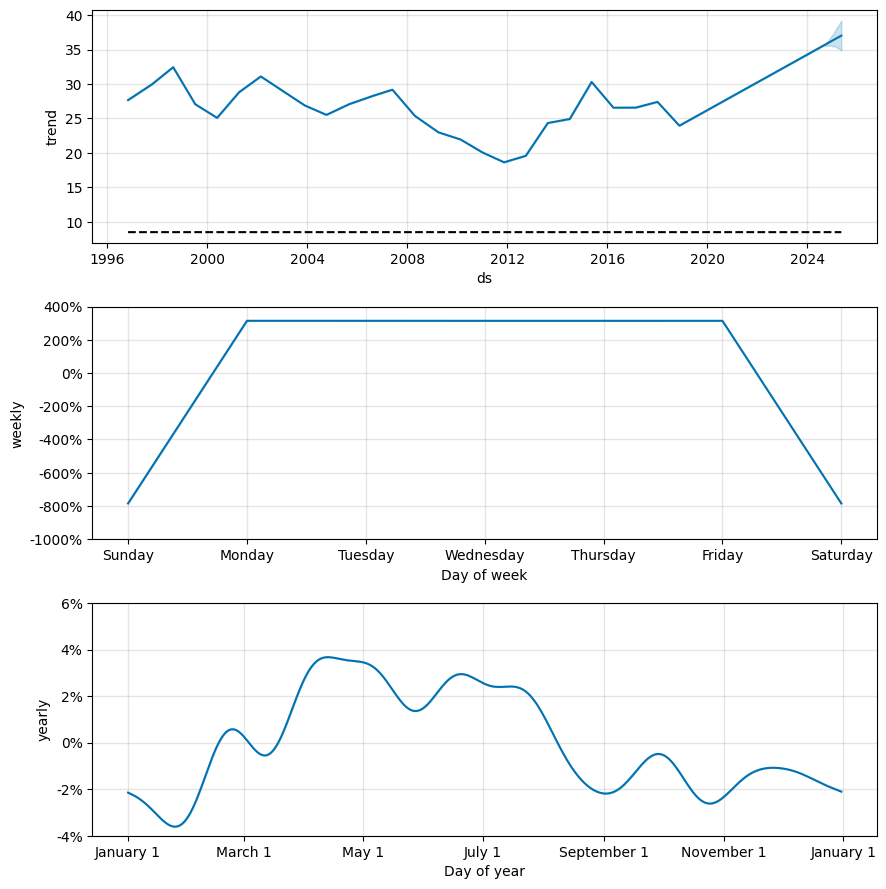

In [ ]:
# Plot components of the multiplicative seasonality model
fig14 = m.plot_components(forecast)
plt.show()

### Forecast with uncertainty intervals


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ctbh22rd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ji416tq1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1018', 'data', 'file=/tmp/tmpdy1i677y/ctbh22rd.json', 'init=/tmp/tmpdy1i677y/ji416tq1.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelem8fc1r1/prophet_model-20240716163359.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:34:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


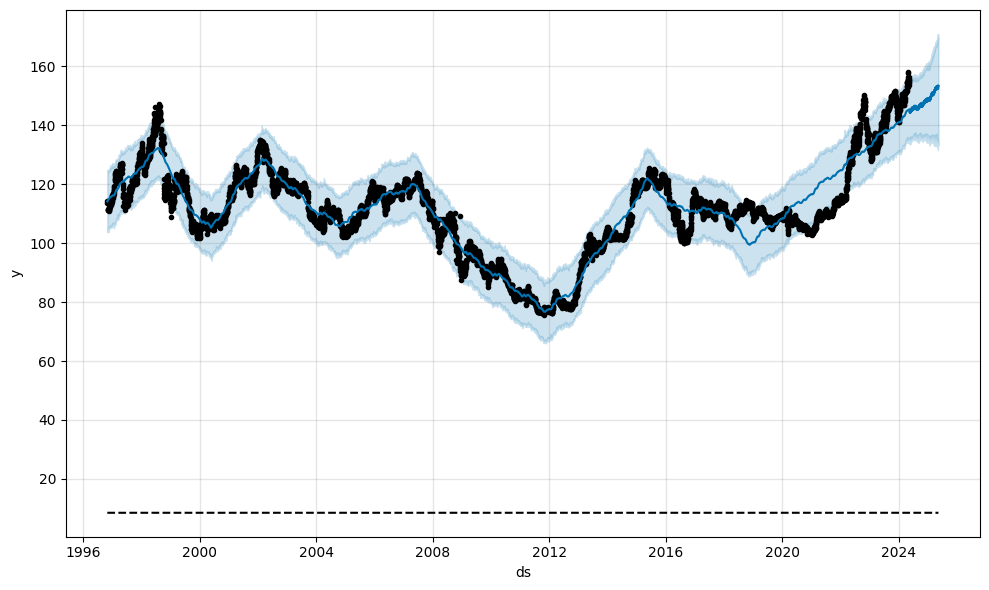

In [ ]:
# Forecast with uncertainty intervals
forecast = Prophet(interval_width=0.95).fit(df).predict(future)
fig15 = m.plot(forecast)
plt.show()


### Forecast with Bayesian sampling


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/xg05ljdv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ul6kbp0h.json
16:50:07 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=98845', 'data', 'file=/tmp/tmpdy1i677y/xg05ljdv.json', 'init=/tmp/tmpdy1i677y/ul6kbp0h.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model8igwy4x0/prophet_model-20240716165008_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=98845', 'data', 'file=/tmp/tmpdy1i677y/xg05ljdv.json', 'init=/tmp/tmpdy1i677y/ul6kbp0h.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model8igwy4x0/prophet_model-20240716165008_2.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:24:45 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=98845', 'data', 'file=/tmp/tmpdy1i677y/xg05ljdv.json', 'init=/tmp/tmpdy1i677y/ul6kbp0h.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_model8igwy4x0/prophet_model-20240716165008_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpdy1i677y/prophet_model8igwy4x0/prophet_model-20240716165008_1.csv
 console_msgs (if any):
	/tmp/tmpdy1i677y/prophet_model8igwy4x0/prophet_model-20240716165008_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 150
    num_warmup = 150
    save_warmup = 0 (Default)
    thin = 1 (Defau

17:24:46 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 150 iterations at max treedepth (100.0%)
	Chain 2 had 150 iterations at max treedepth (100.0%)
	Chain 3 had 150 iterations at max treedepth (100.0%)
	Chain 4 had 150 iterations at max treedepth (100.0%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
	Chain 1 had 150 iterations at max treedepth (100.0%)
	Chain 2 had 150 iterations at max treedepth (100.0%)
	Chain 3 had 150 iterations at max treedepth (100.0%)
	Chain 4 had 150 iterations at max treedepth (100.0%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


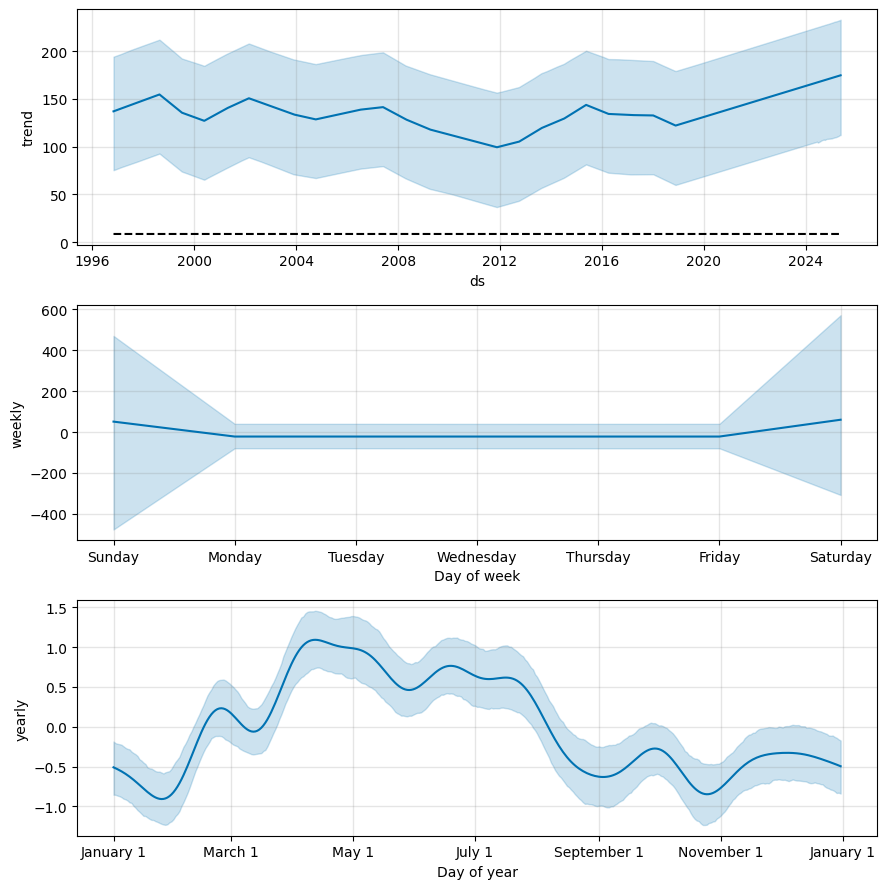

In [ ]:
# Forecast with Bayesian sampling
m = Prophet(mcmc_samples=300)
forecast = m.fit(df).predict(future)
fig16 = m.plot_components(forecast)
plt.show()


### Forecast with Bayesian sampling


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/a2gw2ieu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/g6ga2f9q.json
17:34:01 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49505', 'data', 'file=/tmp/tmpdy1i677y/a2gw2ieu.json', 'init=/tmp/tmpdy1i677y/g6ga2f9q.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modeljnwpso2c/prophet_model-20240716173401_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=49505', 'data', 'file=/tmp/tmpdy1i677y/a2gw2ieu.json', 'init=/tmp/tmpdy1i677y/g6ga2f9q.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modeljnwpso2c/prophet_model-20240716173401_2.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49505', 'data', 'file=/tmp/tmpdy1i677y/a2gw2ieu.json', 'init=/tmp/tmpdy1i677y/g6ga2f9q.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modeljnwpso2c/prophet_model-20240716173401_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpdy1i677y/prophet_modeljnwpso2c/prophet_model-20240716173401_1.csv
 console_msgs (if any):
	/tmp/tmpdy1i677y/prophet_modeljnwpso2c/prophet_model-20240716173401_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 150
    num_warmup = 150
    save_warmup = 0 (Default)
    thin = 1 (Defau

18:04:39 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 149 iterations at max treedepth (99.3%)
	Chain 2 had 150 iterations at max treedepth (100.0%)
	Chain 3 had 149 iterations at max treedepth (99.3%)
	Chain 4 had 150 iterations at max treedepth (100.0%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
	Chain 1 had 149 iterations at max treedepth (99.3%)
	Chain 2 had 150 iterations at max treedepth (100.0%)
	Chain 3 had 149 iterations at max treedepth (99.3%)
	Chain 4 had 150 iterations at max treedepth (100.0%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


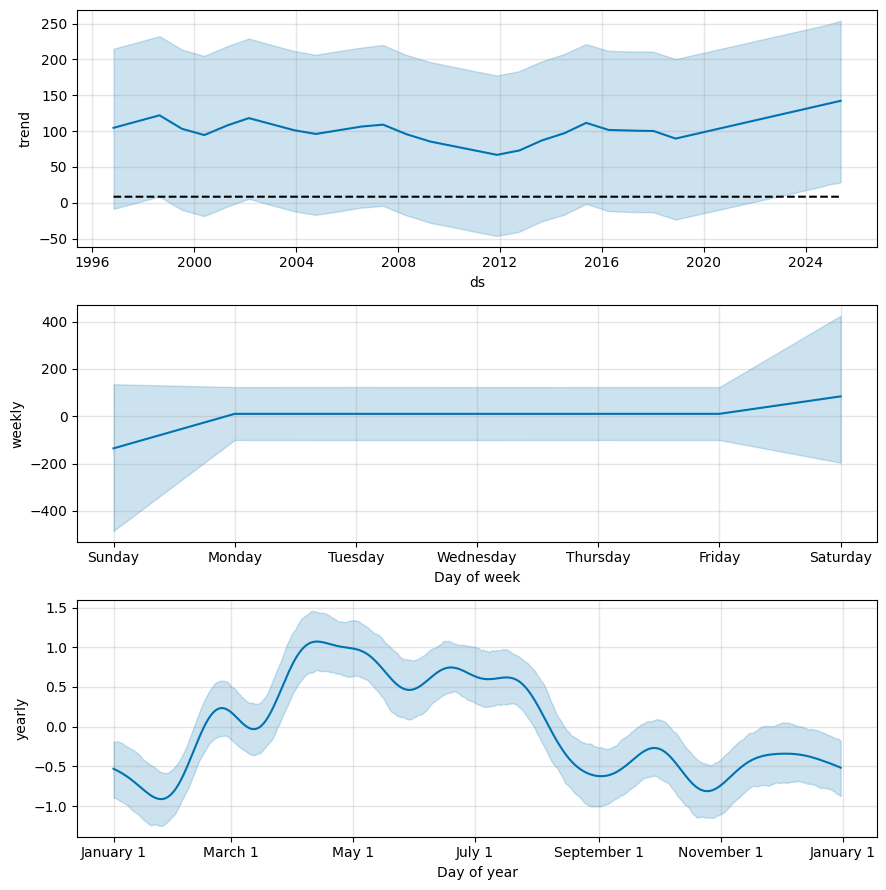

In [ ]:
# Forecast with Bayesian sampling
m = Prophet(mcmc_samples=300)
forecast = m.fit(df).predict(future)
fig16 = m.plot_components(forecast)
plt.show()


### Dataset with outliers


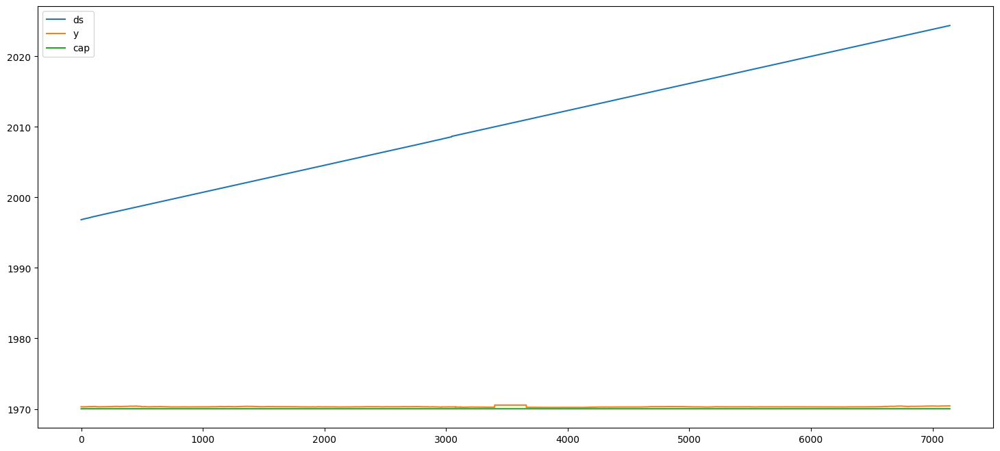

In [ ]:
# Dataset with outliers
df_outliers = df.copy()
df_outliers.loc[(df_outliers['ds'] > '2010-01-01') & (df_outliers['ds'] < '2011-01-01'), 'y'] = 200
df_outliers.plot(figsize=(18, 8))
plt.show()

### Forecast with dataset containing outliers


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/muqs3z6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ndpcjjtj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24241', 'data', 'file=/tmp/tmpdy1i677y/muqs3z6y.json', 'init=/tmp/tmpdy1i677y/ndpcjjtj.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelabmrbq_s/prophet_model-20240716180450.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:04:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:04:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


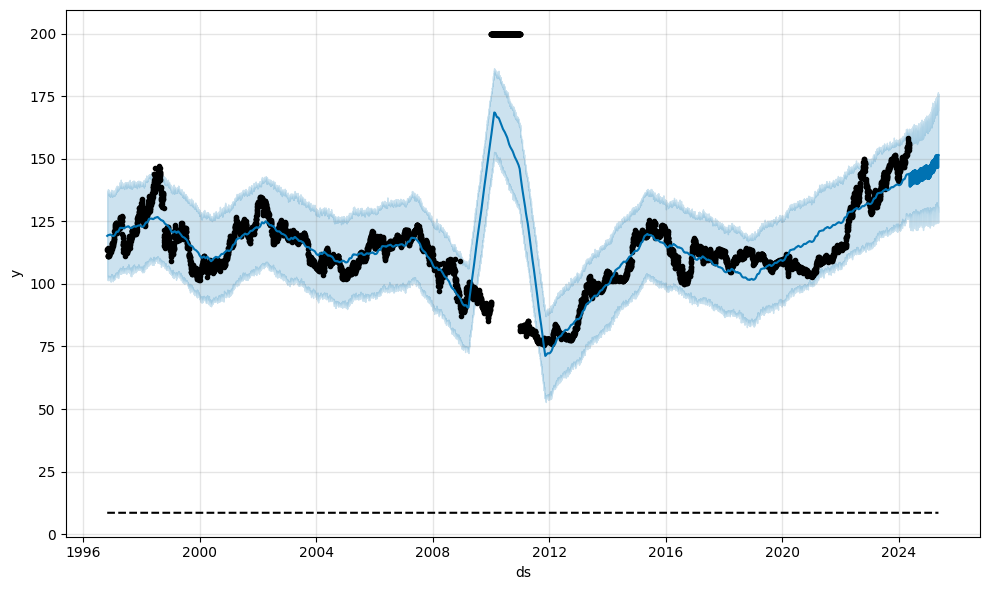

In [ ]:
# Forecast with dataset containing outliers
m = Prophet()
m.fit(df_outliers)
forecast = m.predict(future)
fig17 = m.plot(forecast)
plt.show()

### Forecast after removing outliers


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/k_puntim.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpdy1i677y/ennrpzzw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76164', 'data', 'file=/tmp/tmpdy1i677y/k_puntim.json', 'init=/tmp/tmpdy1i677y/ennrpzzw.json', 'output', 'file=/tmp/tmpdy1i677y/prophet_modelziau4jwk/prophet_model-20240716180457.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:04:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:05:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


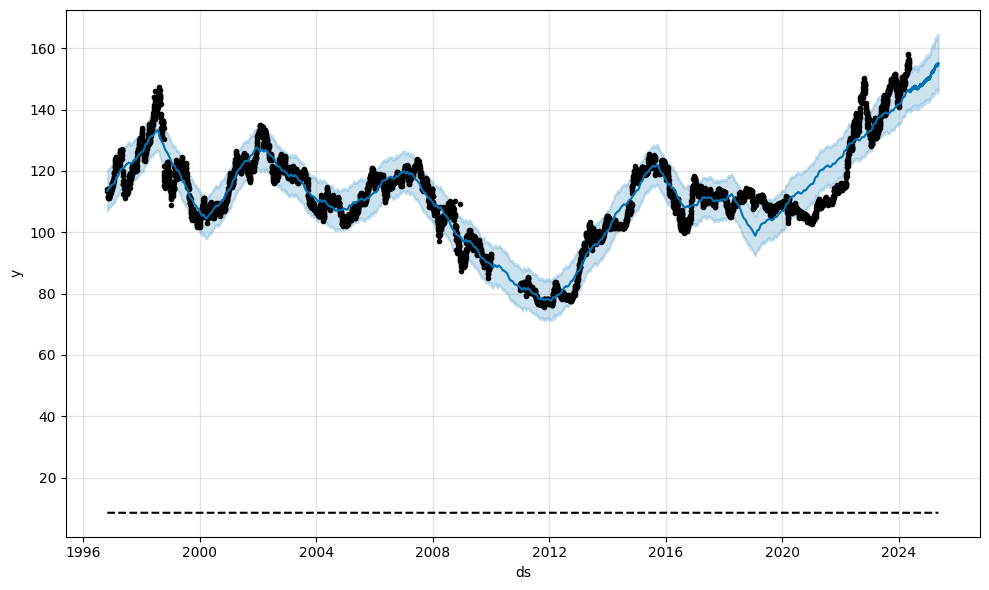

In [ ]:
# Forecast after removing outliers
df.loc[(df['ds'] > '2010-01-01') & (df['ds'] < '2011-01-01'), 'y'] = None
m = Prophet()
m.fit(df)
forecast = m.predict(future)
fig18 = m.plot(forecast)
plt.show()

# Conclusion

In this project, I mainly researched how to predict the JPY/USD exchange rate. Here's a detailed overview:

### Exploratory Data Analysis (EDA):
   - Identified the dates of minimum and maximum values for each column.
   - Plotted time series charts of the closing price, including data for the entire period and recent times.
   - Calculated and plotted 5-year moving averages to smooth data trends.
   - Used heatmaps to visualize monthly and yearly average closing price patterns.
   - Created scatter plots of opening and closing prices to analyze their relationship.
   - Computed and visualized a correlation matrix to study the relationships between variables.

### Time Series Modeling and Forecasting:

1. **Simple Time Series Forecasting Models**:
   - Included mean model, naive model, seasonal naive model, and drift model.

2. **Autoregressive (AR) and Moving Average (MA) Models**:
   - Trained and evaluated AR and MA models, comparing their forecast results.

3. **ARIMA and SARIMA Models**:
   - Used automatic ARIMA functions to search for the best parameters, trained and fitted the models, made predictions, and evaluated their performance.

4. **Holt-Winters Seasonal Model**:
   - Fitted the Holt-Winters seasonal model, made predictions, and evaluated performance.

### Deep Learning Models

1. **Univariate LSTM Model**:
   - Standardized the data, split it into training and test sets, created time window data, built and trained various LSTM models, visualized predictions, and calculated error metrics.

2. **Multivariate LSTM Model**:
   - Used multiple input features for prediction, built and trained multivariate LSTM models, and evaluated predictions.

3. **Multi-step LSTM Model**:
   - Used time window data for multi-step forecasting, built and trained multi-step LSTM models, and evaluated their performance.

4. **Encoder-Decoder LSTM Model**:
   - Built encoder-decoder models for multi-step predictions, trained the models, made predictions, and evaluated performance.

Then, I focused on predicting using interest rate differentials.

### Predicting Using Interest Rate Differentials:
   - Detailed how to calculate and use interest rate differentials for multi-step predictions.

### Multilayer Perceptron (MLP) Model

1. **Univariate MLP Model**:
   - Standardized data, converted it to a supervised learning format, trained and evaluated the MLP model, visualized predictions, and calculated error metrics.

2. **Multivariate Multi-step MLP Model**:
   - Used multiple input features for multi-step predictions, built and trained multivariate multi-step MLP models, and evaluated their performance.

### Convolutional Neural Network (CNN) Model

1. **Univariate CNN Model**:
   - Standardized data, converted it to a supervised learning format, trained and evaluated the CNN model, visualized predictions, and calculated error metrics.

2. **Multivariate Multi-step CNN Model**:
   - Used multiple input features for multi-step predictions, built and trained multivariate multi-step CNN models, and evaluated their performance.

### Classification Models

1. **Data Preprocessing**:
   - Classified the exchange rate data into categories, generated features and labels, and split them into training and test sets.

2. **Model Definition and Evaluation**:
   - Defined various classification models, including KNN, decision tree, SVM, naive Bayes, random forest, extra trees, and gradient boosting.
   - Trained and evaluated models, generated confusion matrices, and classification reports.

### Prophet Model

1. **Defining Key Events and Generating Changepoints**:
   - Used the Prophet model to add Japanese holidays, defined key events as changepoints, fitted the model, and made predictions.

2. **Generating Future Data and Making Predictions**:
   - Generated future data, made predictions, and plotted forecast results and components.

### Grid Search

1. **Defining Model Configurations**:
   - Defined various model configurations, including input sequence length, number of hidden layer neurons, number of training epochs, batch size, and differencing order.

2. **Grid Search and Evaluation**:
   - Evaluated model configurations using grid search, calculated the average score for each configuration, sorted and listed the best configurations.

This project comprehensively demonstrated how to perform complex time series analysis, modeling, and forecasting of exchange rate data using various machine learning and deep learning models. Through detailed processing and evaluation steps, the predictive performance and accuracy of the models were effectively improved.